In [1]:
import numpy as np
import os
import matplotlib
import matplotlib.pyplot as plt
from PIL import Image
from sklearn.cluster import KMeans
import seaborn as sns
from mpl_toolkits.mplot3d import axes3d, Axes3D
from mpl_toolkits.mplot3d import proj3d
import pandas as pd
from sklearn.manifold import TSNE
from sklearn.decomposition import PCA
import matplotlib.pyplot as plt 
from sklearn.preprocessing import normalize, StandardScaler 
from os import listdir
from os.path import isfile, join
from numpy import *
#from sklearn.cluster import OPTICS, cluster_optics_dbscan 

import re
%matplotlib notebook

In [2]:
in_out_germinal = r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\In Germinal Dataset\Border Dataset"
in_germinal = r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\In Germinal Dataset\In Germinal Dataset"
out_germinal = r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\In Germinal Dataset\Outside Dataset"
unlabelled_tissue = r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\In Germinal Dataset\Unlabeled Dataset"

In [3]:
python_data_path= r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\Python Data"
results_store_path = r"Y:\coskun-lab\Shambavi\Paper\New Results"

In [5]:
python_data_path= r"Y:\coskun-lab\Shambavi\Paper\Data\Main Data\New Data\Python Data"
os.chdir(python_data_path)

In [5]:
pixel_in = np.load('pixel_in_zero.npy',allow_pickle=True)
in_germinal_labels = np.load('in_germinal_labels.npy',allow_pickle=True)

In [6]:
pixel_in = np.load('pixel_in_zero.npy',allow_pickle=True)
pixel_out = np.load('pixel_out_zero.npy',allow_pickle=True)
pixel_in_out = np.load('pixel_in_out_zero.npy',allow_pickle=True)
pixel_none = np.load('pixel_unlabelled_zero.npy',allow_pickle=True)

In [7]:
in_germinal_labels = np.load('in_germinal_labels.npy',allow_pickle=True)
out_germinal_labels = np.load('out_germinal_labels.npy',allow_pickle=True)
in_out_germinal_labels = np.load("in_out_germinal_labels.npy",allow_pickle =True)
unlabelled_labels = np.load("unlabelled_tissue_labels.npy",allow_pickle =True)

## Convert all the compounds into 3D Image Dimensions

In [78]:
def image_stack(pv,n_slices):
    final= []
    compounds = []
    for i in range(len(pv)):
        final = []
        y = np.split(pv[i,:],len(pv[i,:])/(256*256))
        #for j in range(int(len(pv[i,:])/(256*256))):
        for j in range(n_slices):
            final.append(y[j].reshape(256,256))
        compounds.append(final)
    return compounds

In [79]:
pixel_in_image = image_stack(pixel_in,50)
pixel_out_image = image_stack(pixel_out,50)
pixel_in_out_image =image_stack(pixel_in_out,50)
pixel_unlabelled_image = image_stack(pixel_none,50)

In [64]:
def image_mean(pv_image,n_slices):
    i = 1
    final = np.zeros([len(pv),256*256,n_slices])
    for i in range(len(pv)):
        y = np.split(pv[i,:],len(pv[i,:])/(256*256))
        for j in range(int(len(pv[i,:])/(256*256))):
            final[i,:,j] = y[j]
    return final
            

(152, 256, 256)

# Mean values of 3D stack(unravelled) for each compound 

In [8]:
def mean_pixel(pv):
    i = 1
    final = np.zeros([len(pv),256*256,int(len(pv[i,:])/(256*256))])
    for i in range(len(pv)):
        y = np.split(pv[i,:],len(pv[i,:])/(256*256))
        for j in range(int(len(pv[i,:])/(256*256))):
            final[i,:,j] = y[j]
    final_mean = np.mean(final, axis = 2)
    return final_mean

In [7]:
pixel_in_mean = mean_pixel(pixel_in)

In [9]:
pixel_in_mean = mean_pixel(pixel_in)
pixel_out_mean = mean_pixel(pixel_out)
pixel_in_out_mean = mean_pixel(pixel_in_out)
pixel_unlabelled_mean = mean_pixel(pixel_none)

# Mean values of 3D Image Stack(image dimension)

In [26]:
def recon_image(pixel_in_mean,n_slices):
    image = np.zeros([256,256,n_slices])
    for i in range(len(pixel_in_mean)):
        image[:,:,i] = pixel_in_mean[i,:].reshape((256,256))
    return image

In [1]:
in_stack = recon_image(pixel_in_mean,152)
out_stack = recon_image(pixel_out_mean,150)
in_out_stack = recon_image(pixel_in_out_mean,157)
unlabelled_stack = recon_image(pixel_unlabelled_mean,138)

In [10]:
def df_pixels(final_mean,labels):
    final_mean_T =final_mean.transpose()
    df = pd.DataFrame(data= final_mean_T,columns = labels)
    return df

In [11]:
df_in = df_pixels(pixel_in_mean,in_germinal_labels)
df_out = df_pixels(pixel_out_mean,out_germinal_labels)
df_in_out = df_pixels(pixel_in_out_mean,in_out_germinal_labels)
df_unlabelled = df_pixels(pixel_unlabelled_mean,unlabelled_labels)

# Dictionary for IN Germinal Cells

# New Dataset

In [12]:
dict_full = [50,190,191,193,194,196,198,200,201,202,203,55,204,205,206,207,208,209,210,212,214,216,56,217,220,221,222,223,224,225,226,229,232,57,236,238,240,243,246,248,249,250,252,253,58,254,256,259,261,263,265,267,269,273,275,59,276,279,282,289,301,307,308,310,318,60,328,332,339,344,353,359,369,380,385,397,61,412,424,431,436,448,457,468,474,479,498,63,501,510,514,518,520,529,544,552,570,586,64,593,610,1,66,67,68,69,70,71,72,73,74,75,16,76,78,79,80,81,82,83,84,85,86,17,87,88,91,93,95,96,97,98,100,102,30,104,105,107,109,111,112,115,116,117,118,34,121,122,124,125,127,128,131,133,134,138,35,140,141,143,144,145,146,148,149,150,151,42,152,155,156,158,159,161,162,164,165,166,44,167,168,169,170,171,173,179,182,184,185]

In [13]:
immune_labels = [127,131,138,141,143,148,149,150,152,155,156,158,159,161,162,165,167,168,169,170,171,173,190,191,193,208]

In [14]:
immune_labels_imp = [141,143,148,150,155,156,158,159,161,162,165,167,168,169,170,171,173]

In [15]:
org_labels_in = in_germinal_labels[2:]

org_out_labels = out_germinal_labels[2:]


In [16]:
df_in = df_in.drop(['total','rest'],1)
df_out = df_out.drop(['total','rest'],1)
df_in_out = df_in_out.drop(['total','rest'],1)
df_unlabelled = df_unlabelled.drop(['total','rest'],1)

In [17]:
in_labels = dict(zip(org_labels_in, dict_full)) 
out_labels = dict(zip(org_out_labels, dict_full)) 
border_labels = dict(zip(in_out_germinal_labels[2:], dict_full)) 
unlabelled_t_labels = dict(zip(unlabelled_labels[2:], dict_full)) 


In [18]:
df_in.rename(columns=in_labels, inplace=True)
df_out.rename(columns=out_labels, inplace=True)
df_in_out.rename(columns=border_labels, inplace=True)
df_unlabelled.rename(columns = unlabelled_t_labels, inplace = True)

In [19]:
immune_labels = [str(x) for x in immune_labels]
immune_labels_imp = [str(x) for x in immune_labels_imp]

In [20]:
df_in.columns = [float(x) for x in df_in.columns]
df_out.columns = [float(x) for x in df_out.columns]
df_in_out.columns = [float(x) for x in df_in_out.columns]
df_unlabelled.columns = [float(x) for x in df_unlabelled.columns]

In [21]:
df_in.columns = [int(x) for x in df_in.columns]
df_out.columns = [int(x) for x in df_out.columns]
df_in_out.columns = [int(x) for x in df_in_out.columns]
df_unlabelled.columns = [int(x) for x in df_unlabelled.columns]

In [22]:
df_in.columns = [str(x) for x in df_in.columns]
df_out.columns = [str(x) for x in df_out.columns]
df_in_out.columns = [str(x) for x in df_in_out.columns]
df_unlabelled.columns = [str(x) for x in df_unlabelled.columns]

# Immune Labels Heatmaps

In [23]:
os.chdir(results_store_path)

In [24]:
def create_slices(pv,k,in_germinal_labels,labels):
    i = 1
    total_slices = int(len(pv[i,:])/(256*256))
    slices = total_slices//k+1 if total_slices%k != 0 else total_slices//k
    final = np.zeros([len(pv),256*256, slices])
    for i in range(len(pv)):
        y = np.split(pv[i,:],len(pv[i,:])/(256*256))
        for j in range(slices):
            final[i,:,j] = np.mean(y[j*k:(j+1)*k], axis = 0)
    final = final.reshape(len(final), -1)

    final_T = final.transpose()

    df = pd.DataFrame(data= final_T,columns = in_germinal_labels)

    df = df.drop(['total','rest'],1)
    df.rename(columns=labels, inplace=True)
    return df

In [17]:
df = create_slices(pixel_in,20,in_germinal_labels,in_labels)

In [25]:
df = create_slices(pixel_in,20,in_germinal_labels,in_labels)
df1 = create_slices(pixel_out,20,out_germinal_labels,out_labels)
df2 = create_slices(pixel_in_out,20,in_out_germinal_labels,border_labels)
df3 = create_slices(pixel_none,20,unlabelled_labels,unlabelled_t_labels)

In [26]:
df.columns = [str(x) for x in df.columns]
df1.columns = [str(x) for x in df1.columns]
df2.columns = [str(x) for x in df2.columns]
df3.columns = [str(x) for x in df3.columns]

In [18]:
df.columns = [str(x) for x in df.columns]
immune_labels = [str(x) for x in immune_labels]

In [23]:
df.columns =[str(x) for x in df.columns]
df_corr = df.corr()

In [145]:
hey = [42, 91, 75, 84, 141, 143, 148, 149, 150, 152]
hey1 = [95,112,79,1,149,64,124,155,127,165,169,170]
hey2 = [196,200,201,202,203,204,206,207,149,64,124,155,127,165,169,170]


In [197]:
actual_immune = ['155','156','161','162','170','171','173','191','193']
not_immune = ['127',
 '131',
 '138',
 '141',
 '143',
 '148',
 '149',
 '150',
 '152',
 '158',
 '159',
 '165',
 '167',
 '168',
 '169',
 '190',
 '208']

In [198]:
df_trail = df.copy()

In [203]:
df_trail.columns = [str(x) for x in df_trail.columns]
not_immune = [str(x) for x in not_immune]

In [146]:
hey = [str(x) for x in hey]
hey1 = [str(x) for x in hey1]
hey2 = [str(x) for x in hey2]

In [142]:
immune_labels = [str(x) for x in immune_labels]

In [31]:
df.columns = [str(x) for x in df.columns]

# df1.columns = [str(x) for x in df1.columns]
# df2.columns = [str(x) for x in df2.columns]
# df3.columns = [str(x) for x in df3.columns]

In [19]:
hmm = ['155','156','161','162','170','171','173','191','193',50,72,42,91,75,84,98,'86','66','100','107','73','74','97','121',122,109,146,96,145,140,149,93,95,112,79,128,64,124,102,133,144,115,111,87]
hmm = [str(x) for x in hmm]

In [20]:
os.chdir(results_store_path)

<IPython.core.display.Javascript object>


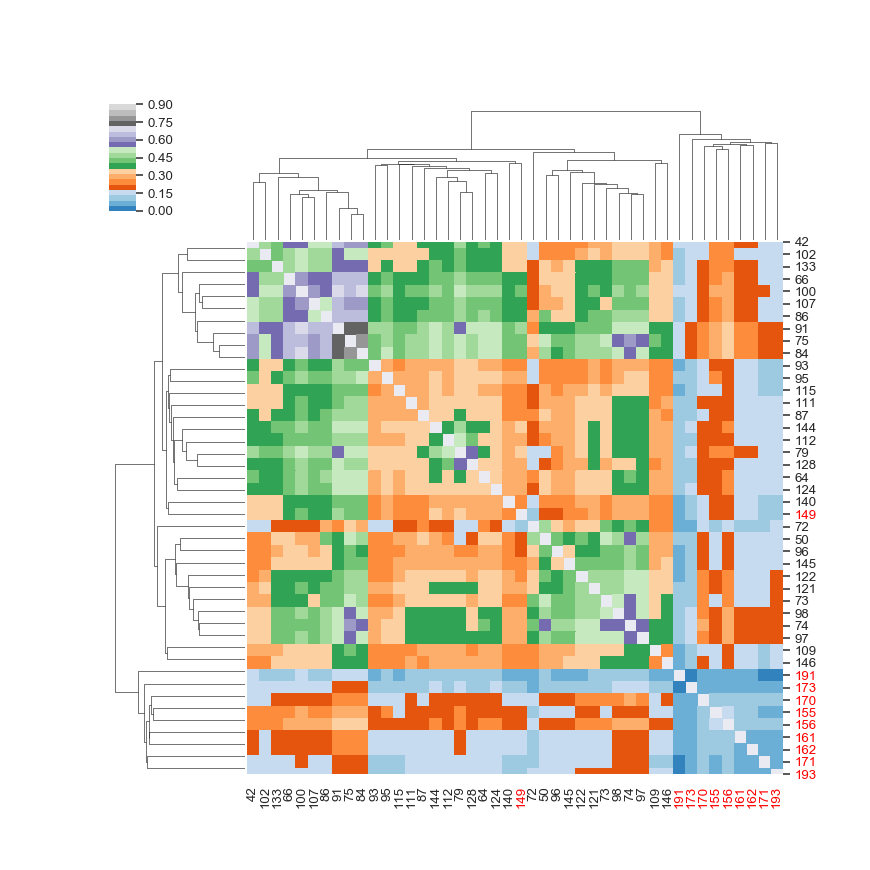

In [22]:
%matplotlib notebook


sns.set(font_scale=1)
#fig = plt.figure()
#Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(df[hmm].corr(), dtype=np.bool)))

#g = sns.clustermap(df[immune_labels].corr(),cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
#mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(df[hmm].corr(), cmap = 'tab20c',mask = mask, yticklabels=True, xticklabels = True, vmin = 0, vmax = 0.9)

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
        
#g.yticks(rotation=0)
plt.savefig('clustermap_immune_nice.svg',format='svg', dpi=1200)

# TSNE MAPS

## Immune Labels + Dataset

In [161]:
in_1_compounds = [str(x) for x in in_1_compounds]
in_2_compounds = [str(x) for x in in_2_compounds]


out_1_compounds = [str(x) for x in out_1_compounds]
out_2_compounds = [str(x) for x in out_2_compounds]

in_out_1_compounds = [str(x) for x in in_out_1_compounds]
in_out_2_compounds = [str(x) for x in in_out_2_compounds]

unlabelled_1_compounds = [str(x) for x in unlabelled_1_compounds]
unlabelled_2_compounds = [str(x) for x in unlabelled_2_compounds]

In [162]:
os.chdir(results_store_path)

In [212]:
c = []
labels = list(df_unlabelled.columns)
for i,type in enumerate(labels): 
    if type in unlabelled_1_compounds:
        c.append('b')
    elif type in unlabelled_2_compounds:  
        c.append('g')
#     elif type in immune_labels_imp: 
#         c.append('black')
    else:
        c.append('r')
            
        
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_unlabelled_anti-corr_immune_50')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            tsne = TSNE(n_components=2,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l)
            tsne_obj= tsne.fit_transform(pixel_unlabelled_mean) #change name here
            tsne_df = pd.DataFrame({'X':tsne_obj[2:,0],'Y':tsne_obj[2:,1]})
            ax = plt.scatter(tsne_obj[2:,0], tsne_obj[2:,1],c = c,s=10)
            for i,type in enumerate(labels):
                if type in unlabelled_1_compounds: #type neame her
                    #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
                    x =tsne_obj[2:,0][i]
                    y = tsne_obj[2:,1][i]
                    plt.text(x, y, type, fontsize=9, c = 'blue')
                    
                if type in unlabelled_2_compounds: #type neame her
                    #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
                    x =tsne_obj[2:,0][i]
                    y = tsne_obj[2:,1][i]
                    plt.text(x, y, type, fontsize=9, c = 'green')
                    
#                 if type in immune_labels_imp: #type neame her
#                     #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
#                     x =tsne_obj[2:,0][i]
#                     y = tsne_obj[2:,1][i]
#                     plt.text(x, y, type, fontsize=9, c = 'black')

            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')
os.chdir(current_dir)    

In [155]:
labels = list(df_out.columns)
c = []
for i,type in enumerate(labels): 
    if type in immune_out:
        c.append('b')
    else: 
        c.append('r')
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_HYPERION_OUTSIDE_GERMINAL_CELLS_IMMUNE_LABELS')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            tsne = TSNE(n_components=2,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l)
            tsne_obj= tsne.fit_transform(pixel_out_mean)
            tsne_df = pd.DataFrame({'X':tsne_obj[2:,0],'Y':tsne_obj[2:,1]})
            ax = plt.scatter(tsne_obj[2:,0], tsne_obj[2:,1],c = c,s=10)
            for i,type in enumerate(labels):
                if type in immune_out :
                    #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
                    x =tsne_obj[2:,0][i]
                    y = tsne_obj[2:,1][i]
                    plt.text(x, y, type, fontsize=7, c = 'darkblue')

            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')
os.chdir(current_dir)    

# Unlabelled Dataset TSNE

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


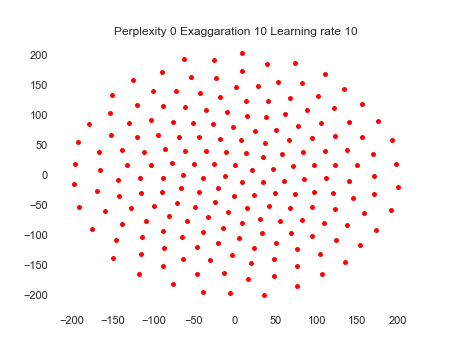

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


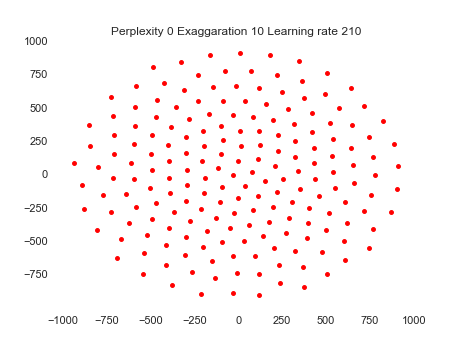

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


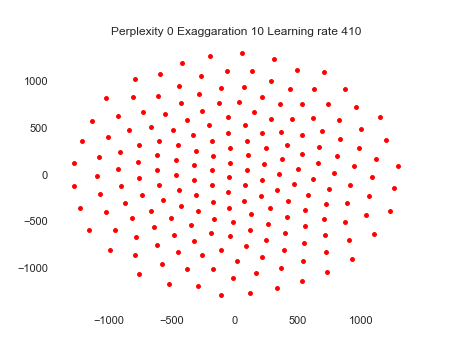

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


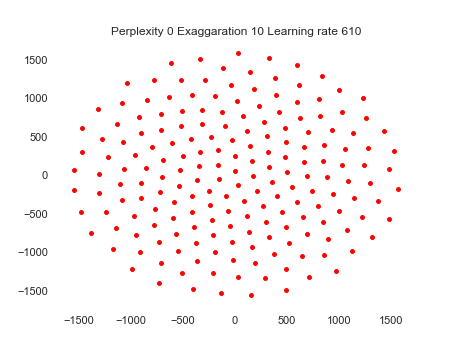

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


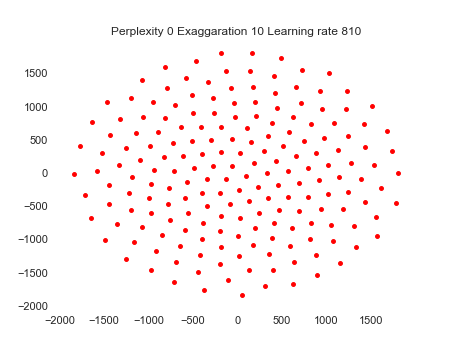

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


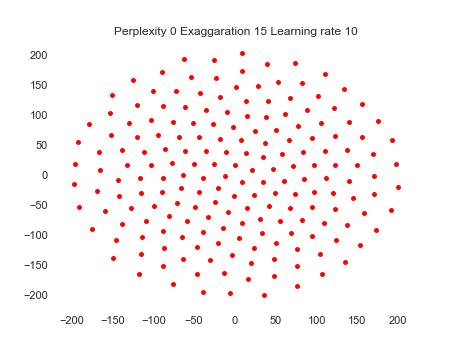

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


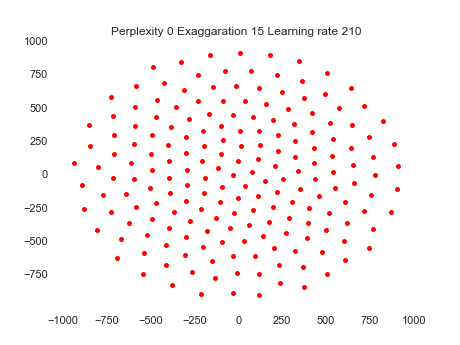

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


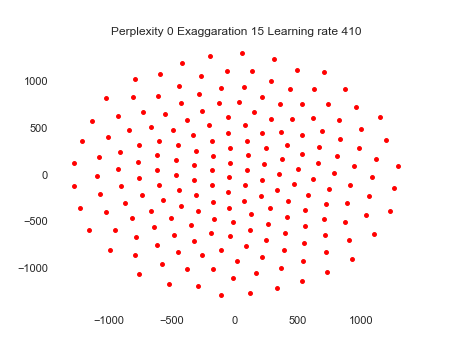

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


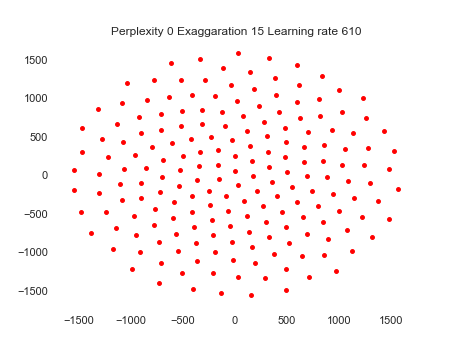

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


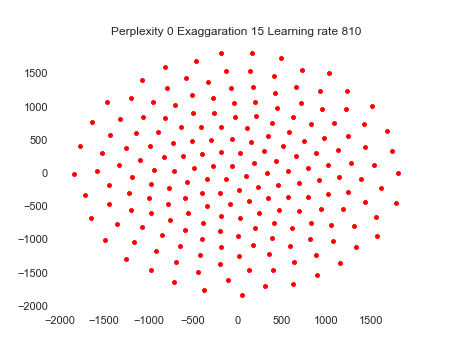

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


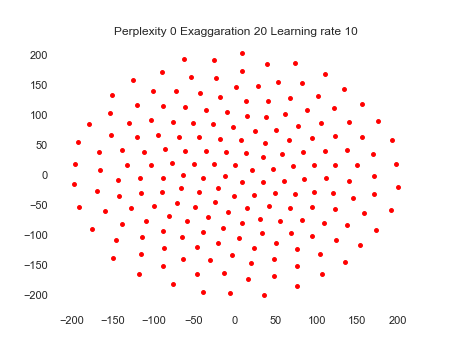

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


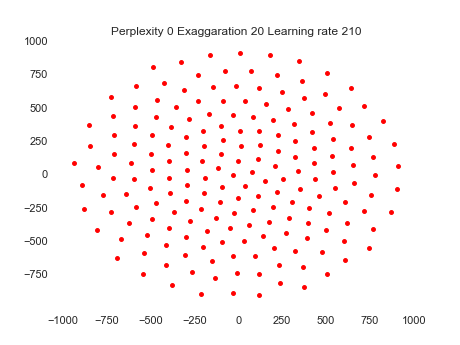

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


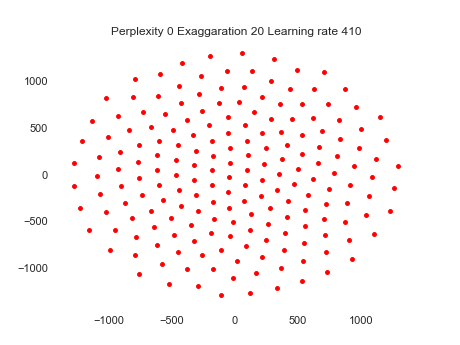

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


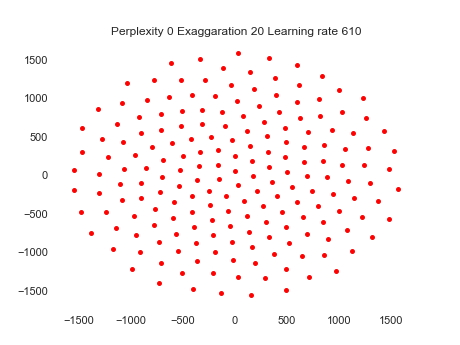

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


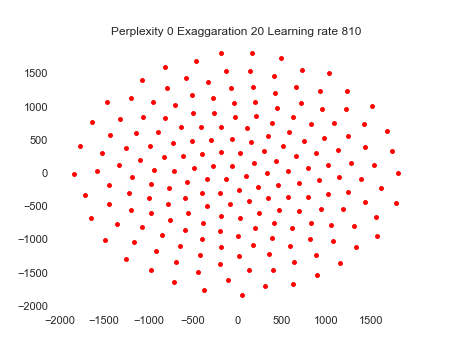

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


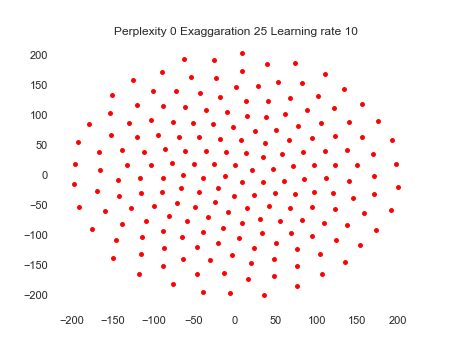

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


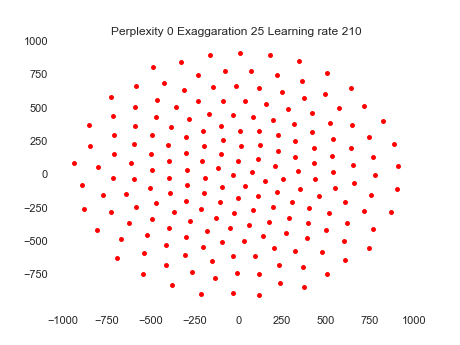

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


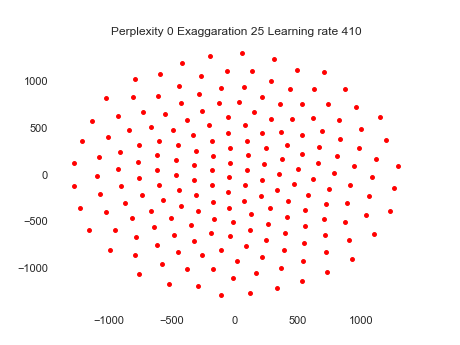

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


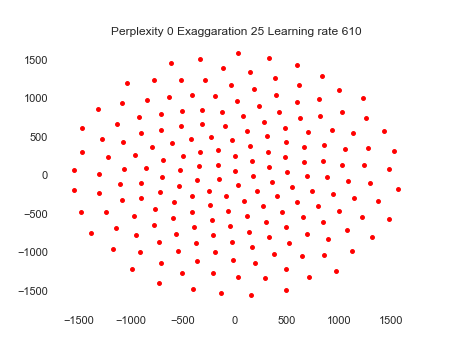

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


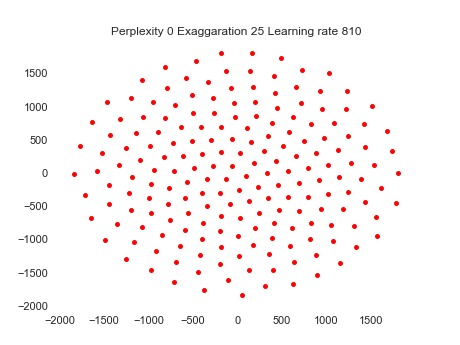

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


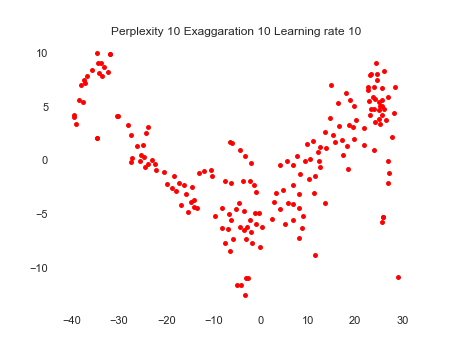

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


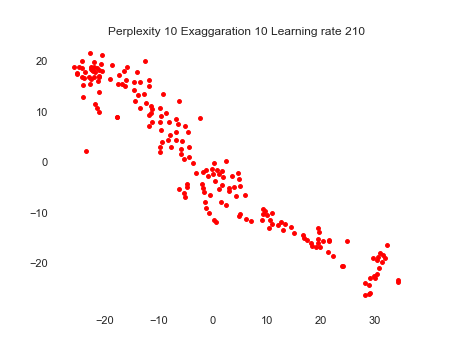

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


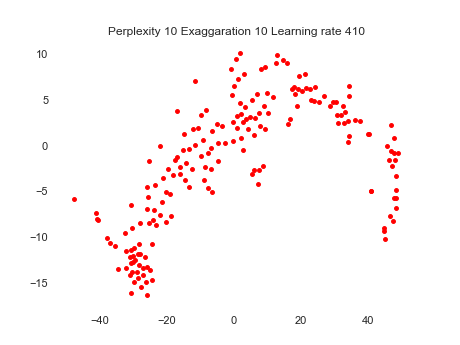

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


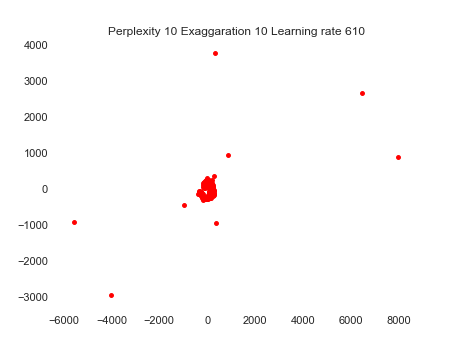

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


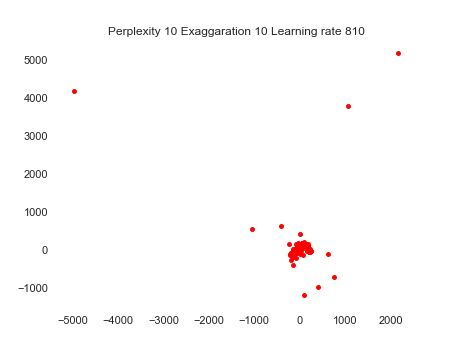

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


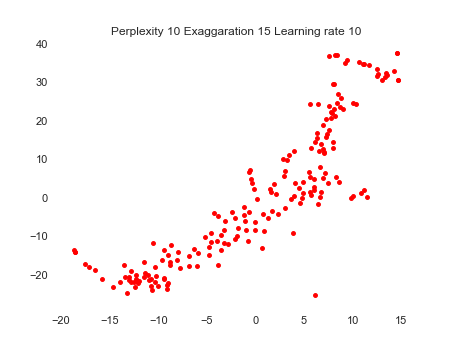

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


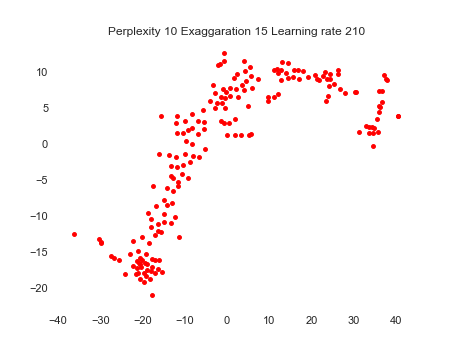

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


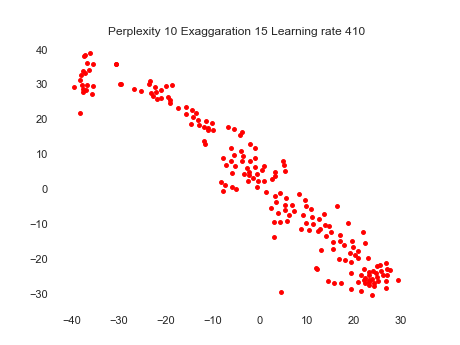

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


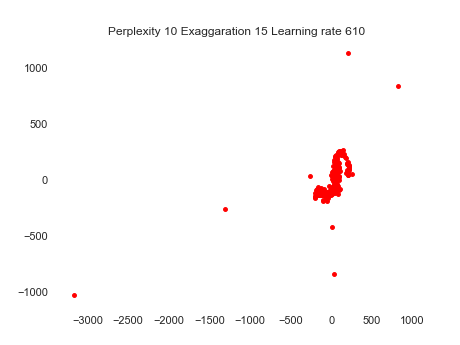

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


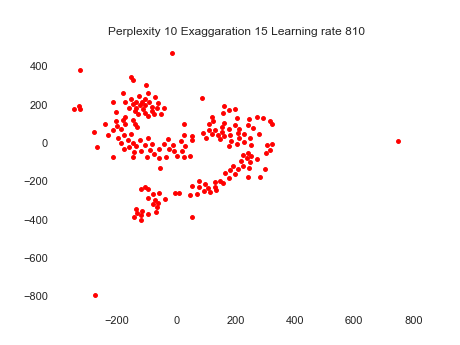

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


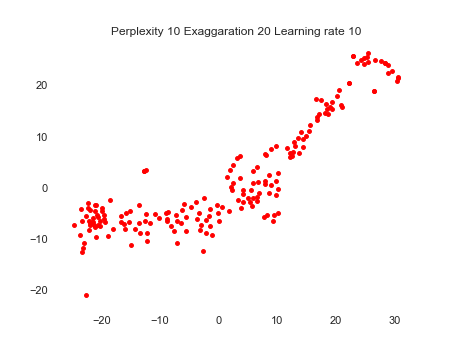

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


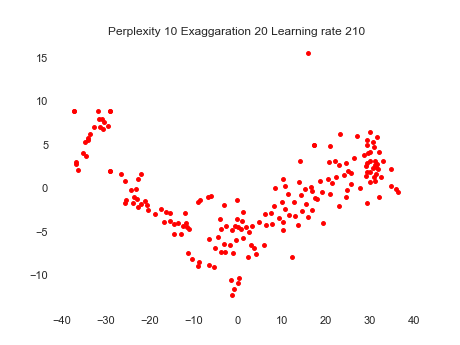

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


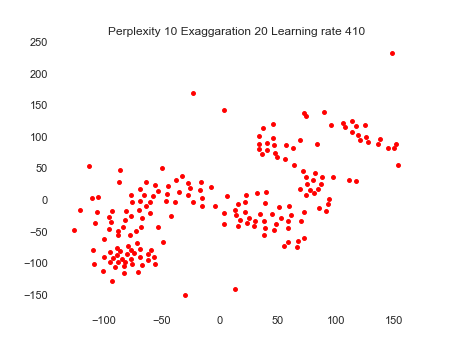

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


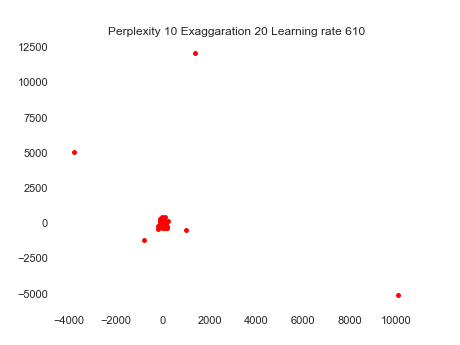

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


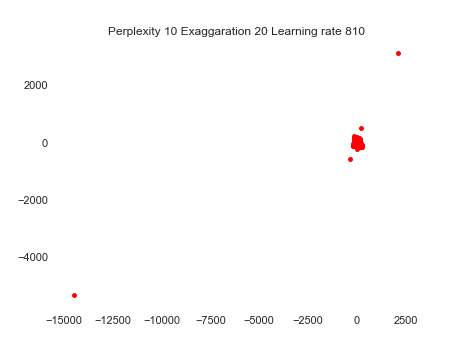

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


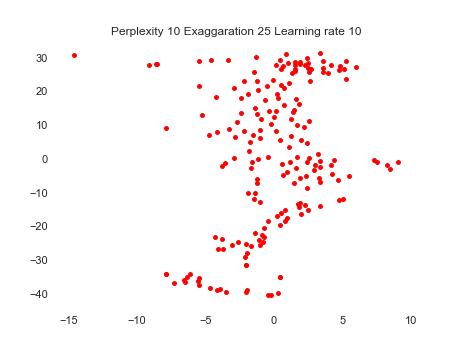

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


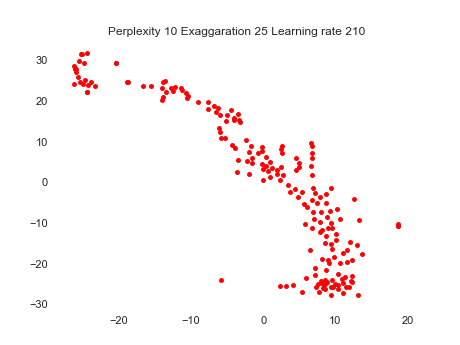

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


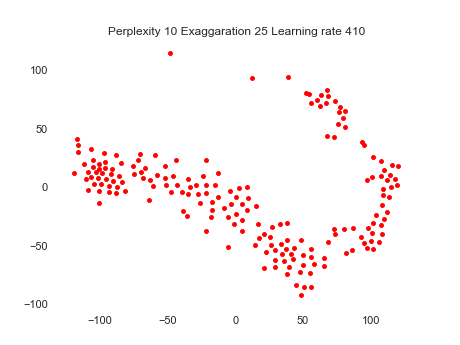

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


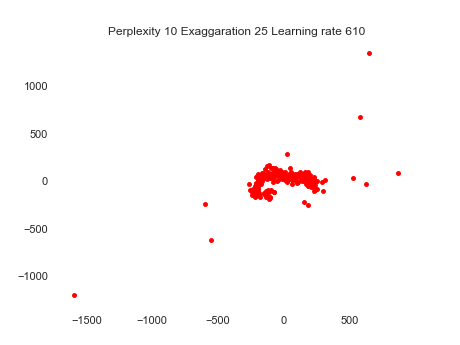

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


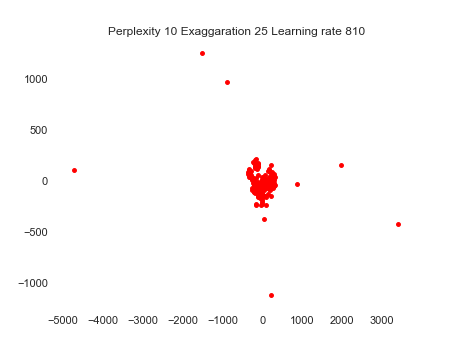

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


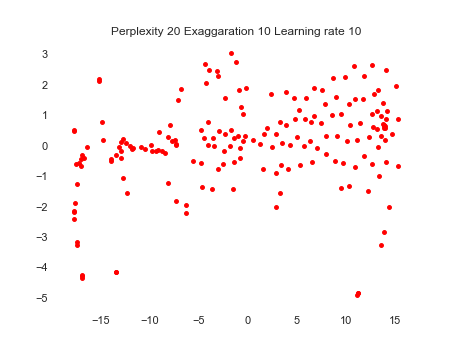

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


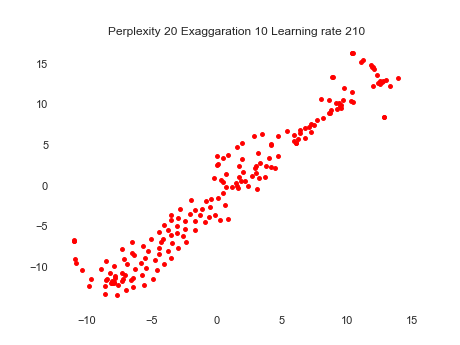

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


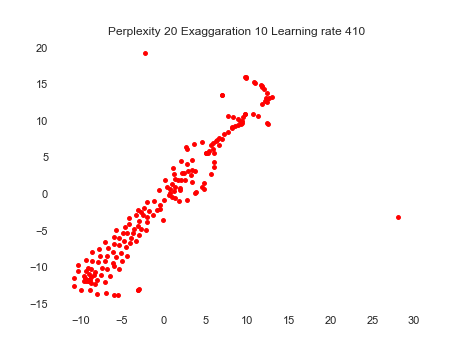

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


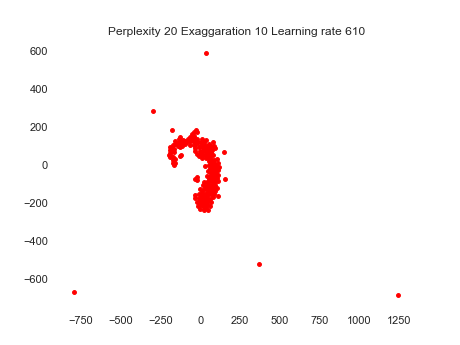

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


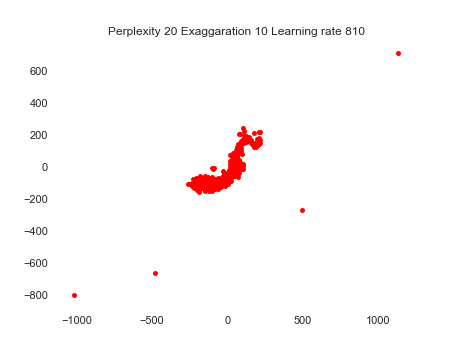

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


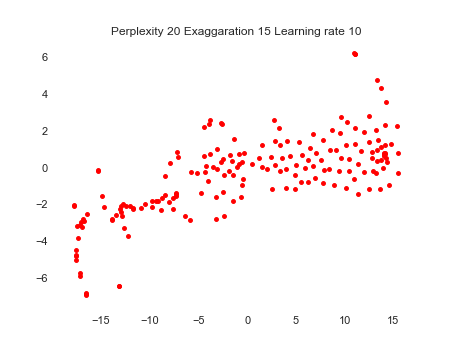

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


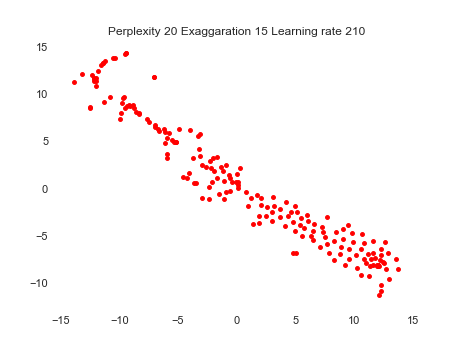

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


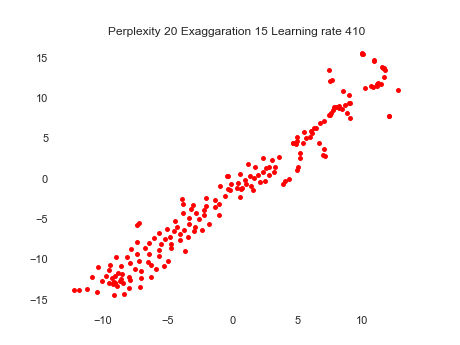

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


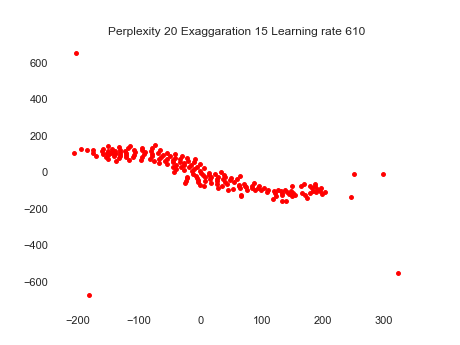

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


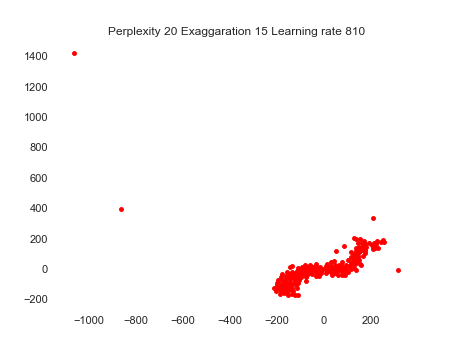

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


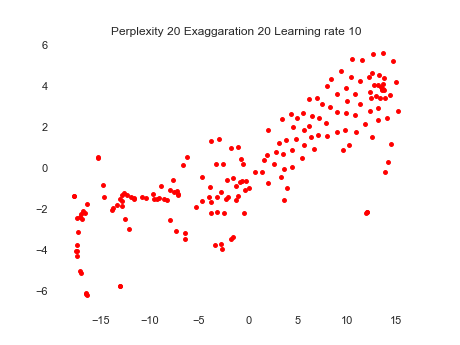

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


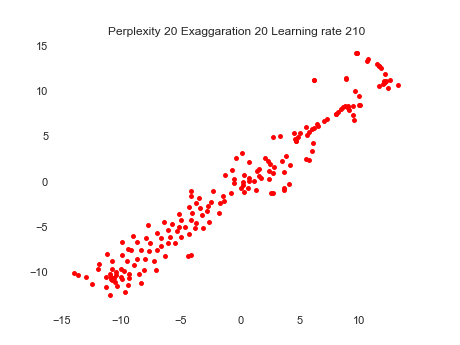

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


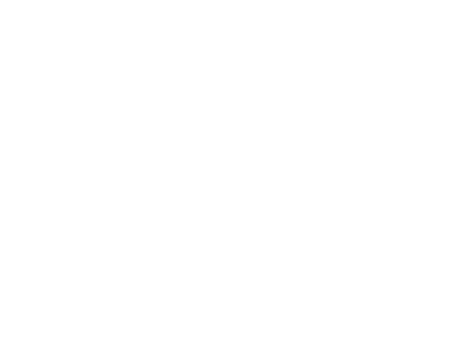

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


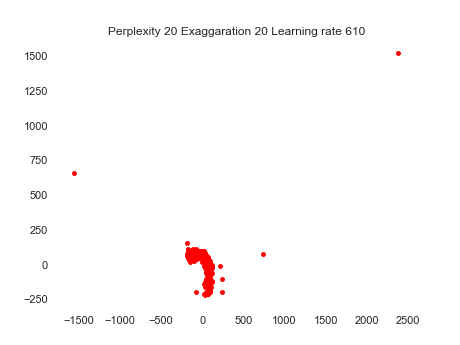

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


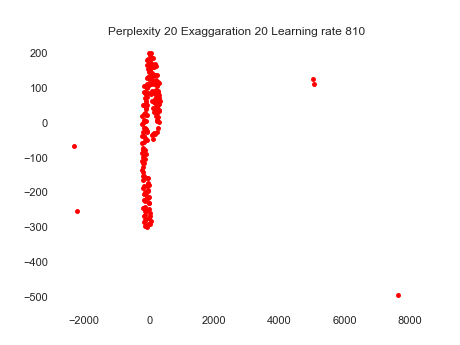

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


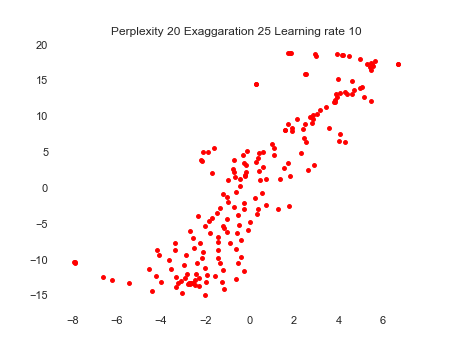

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


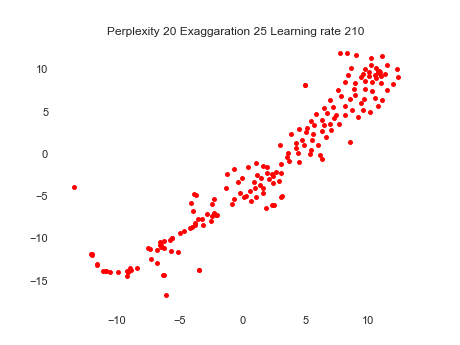

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


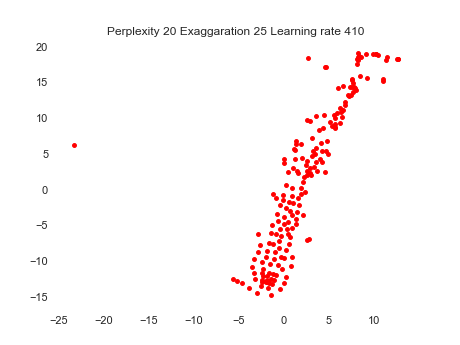

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


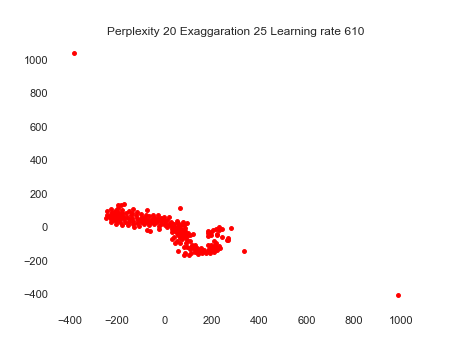

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


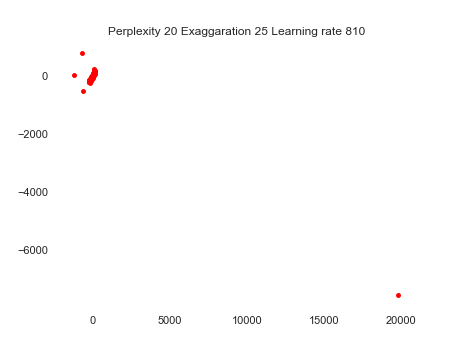

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


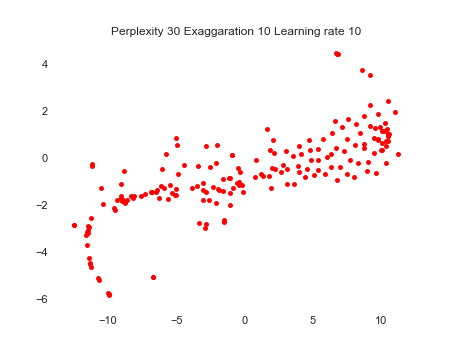

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


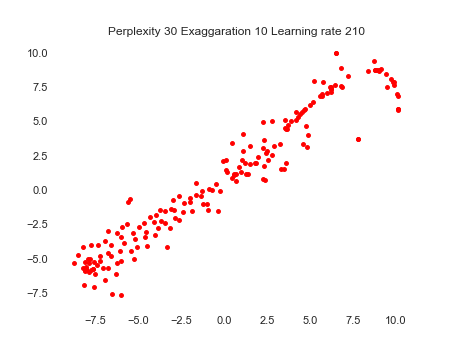

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


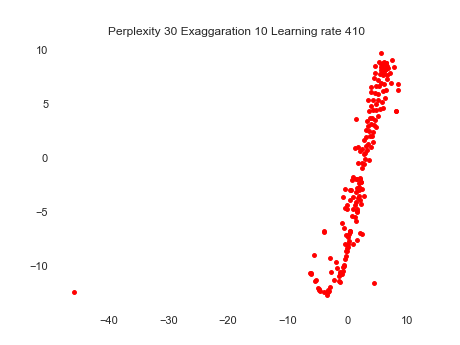

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


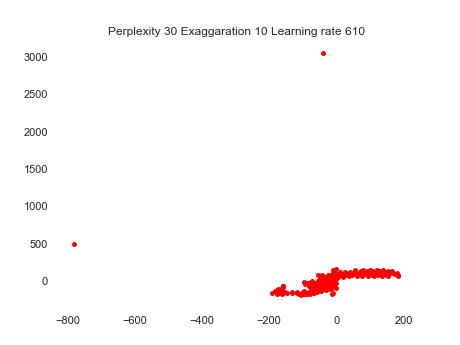

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


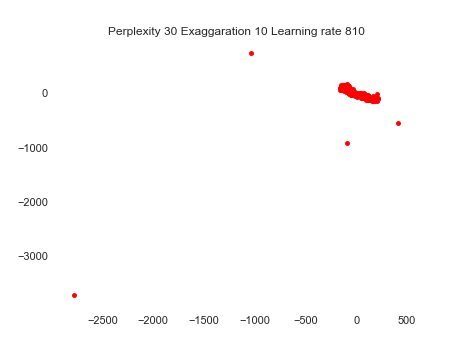

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


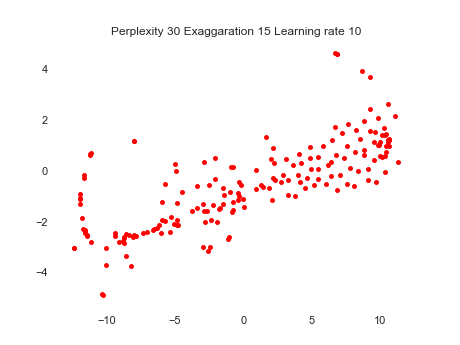

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


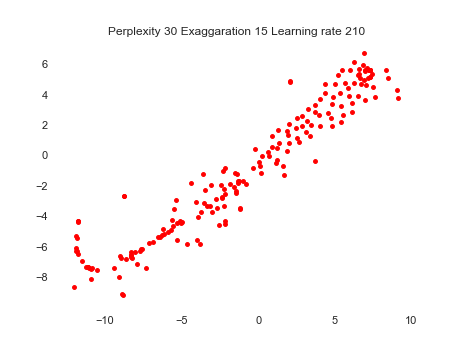

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


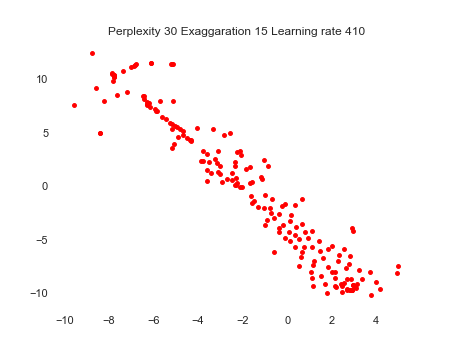

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


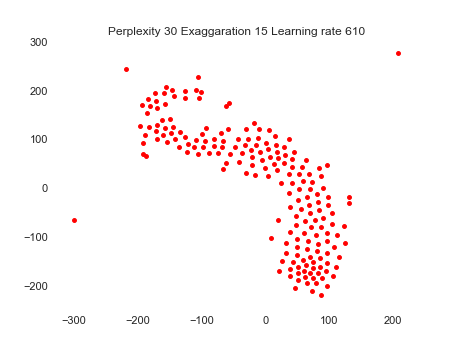

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


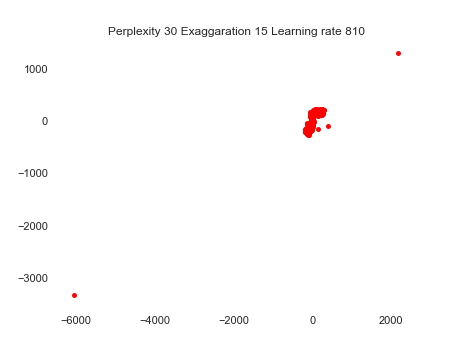

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


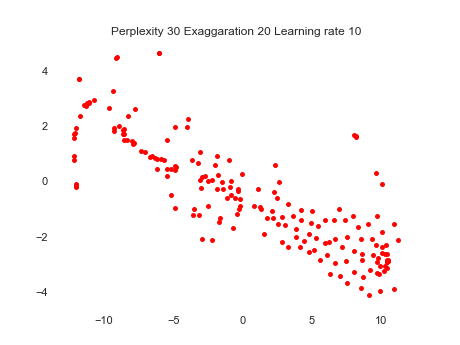

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


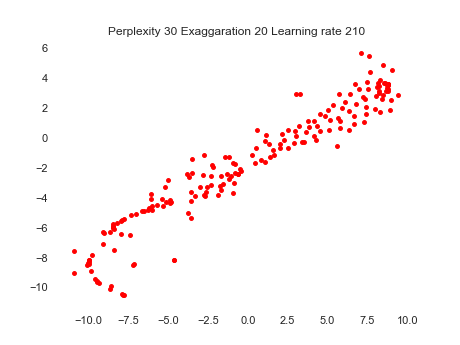

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


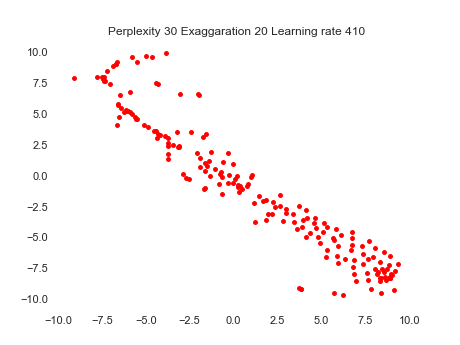

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


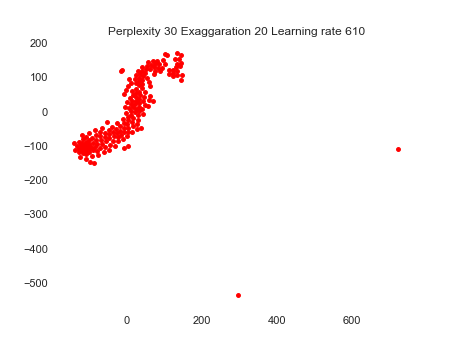

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


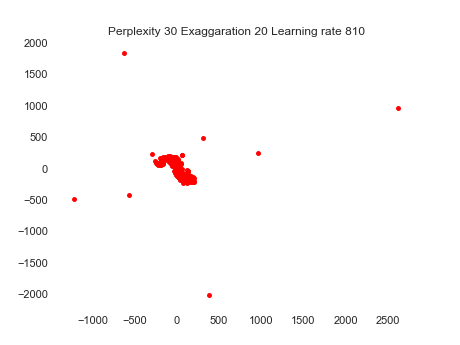

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


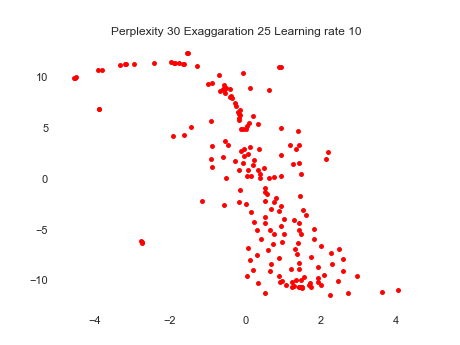

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


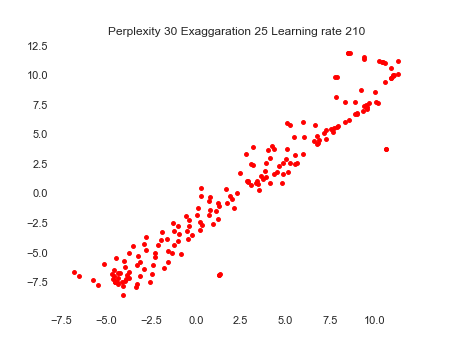

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


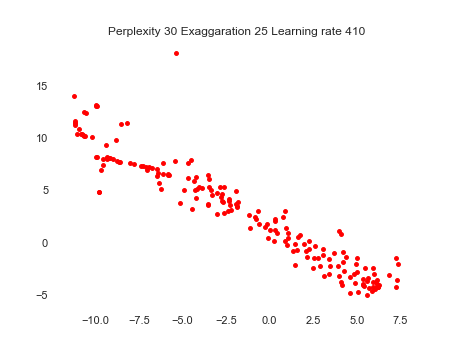

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


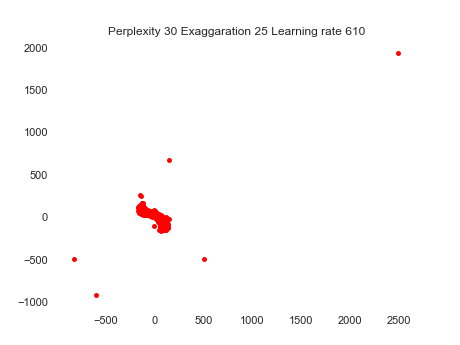

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


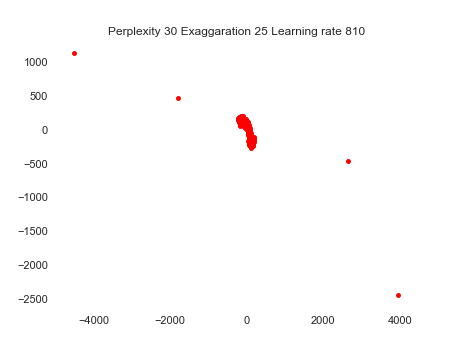

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


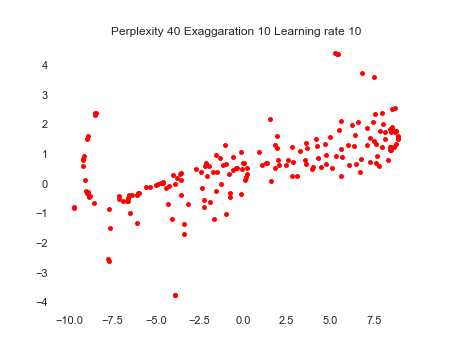

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


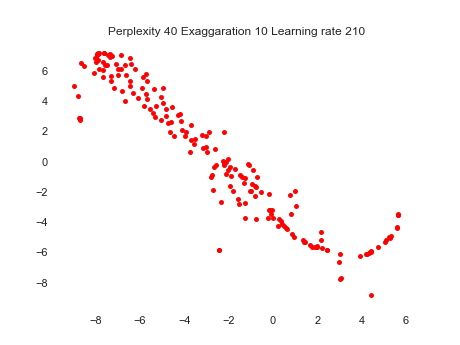

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


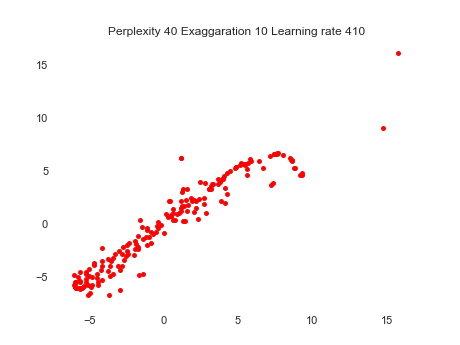

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


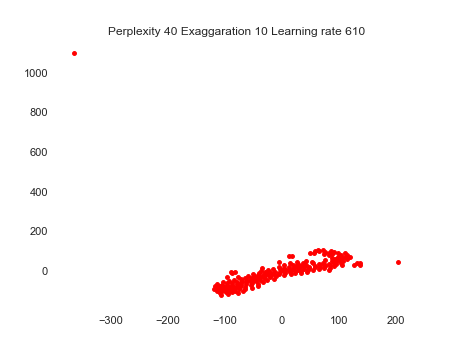

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


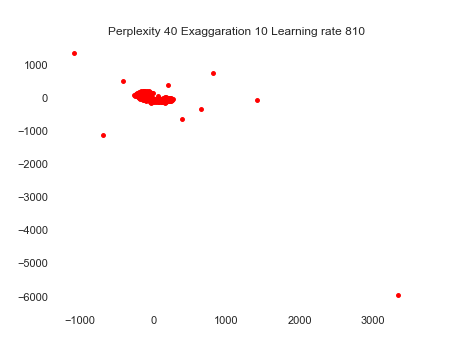

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


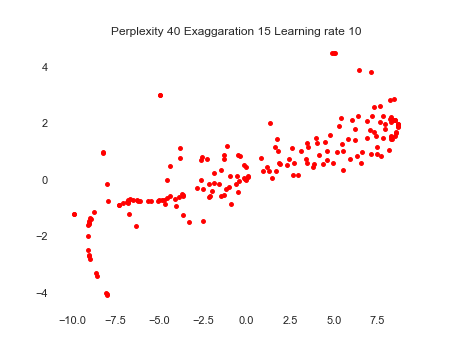

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


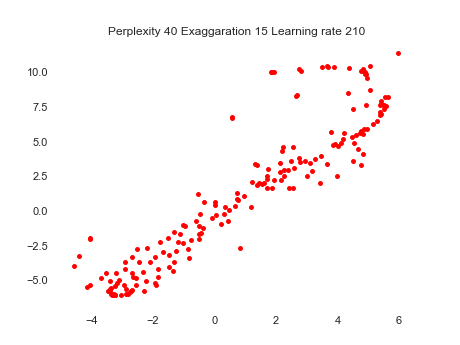

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


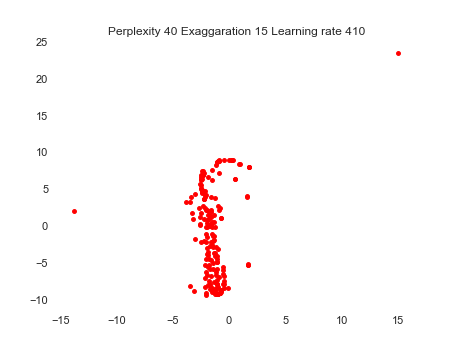

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


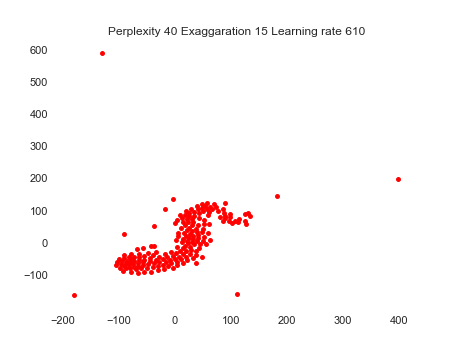

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


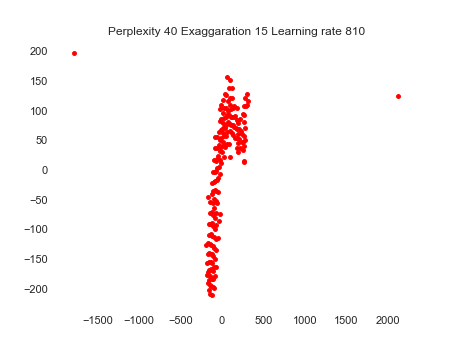

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


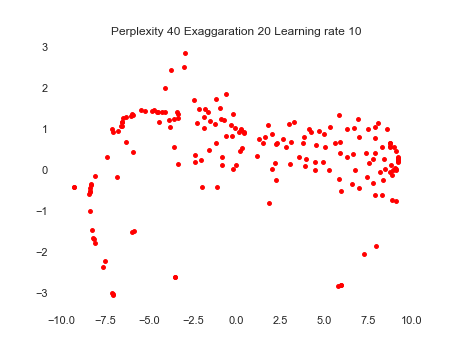

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


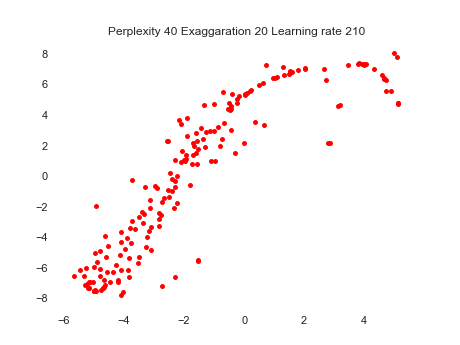

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


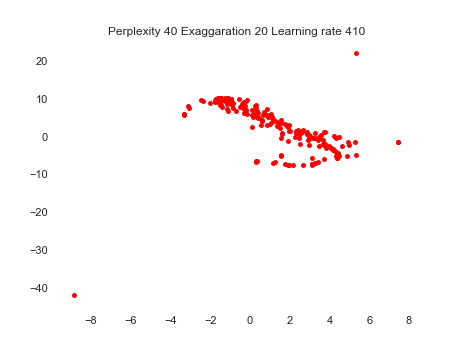

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


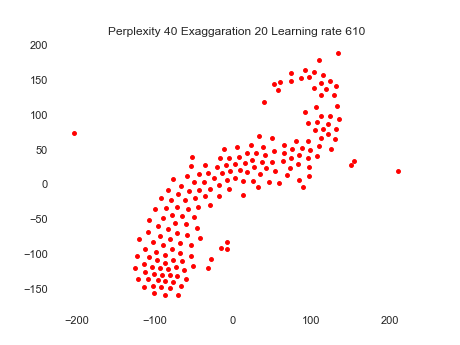

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


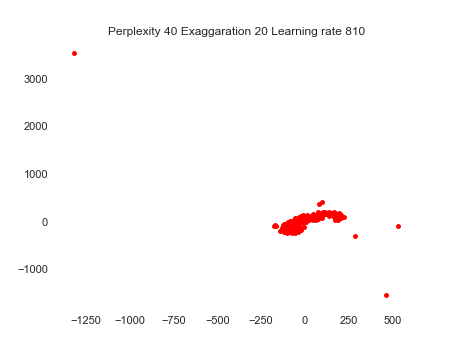

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


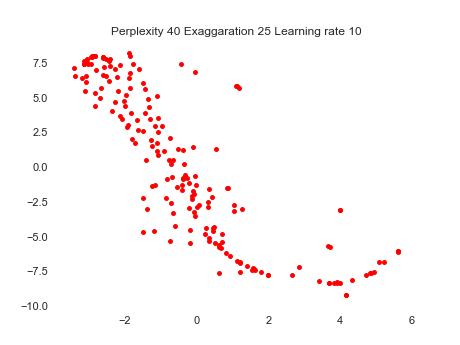

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


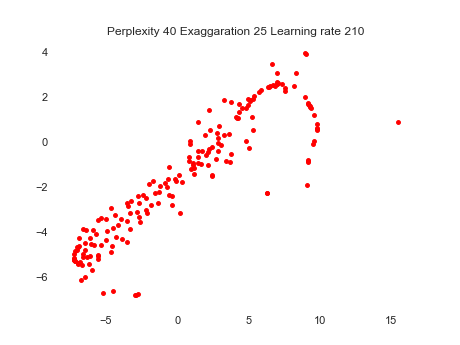

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


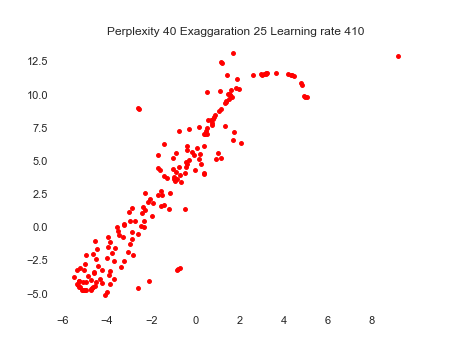

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


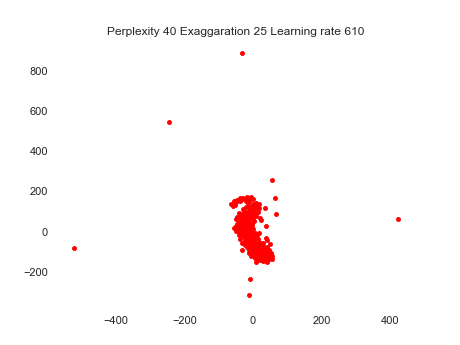

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


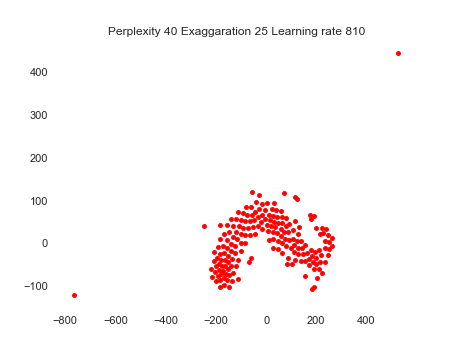

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


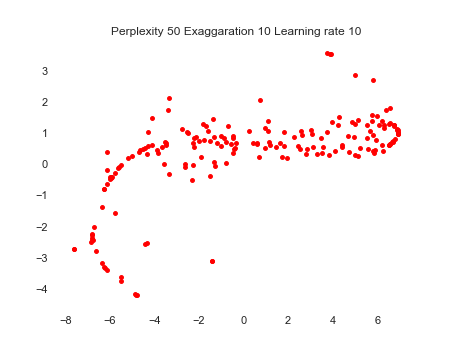

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


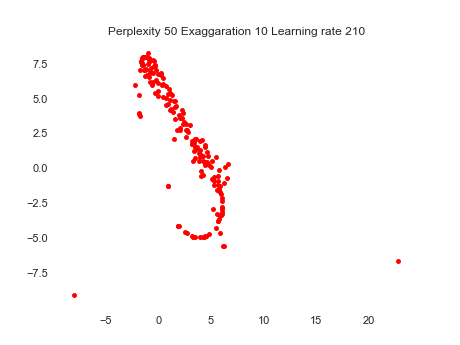

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


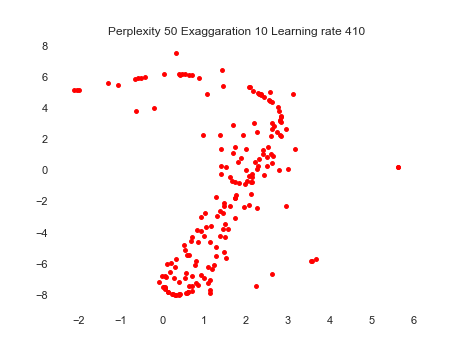

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


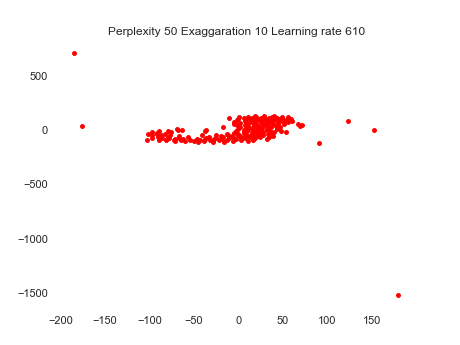

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


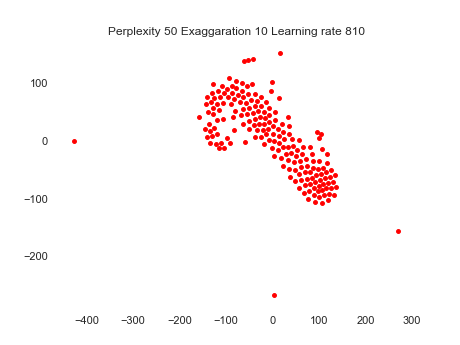

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


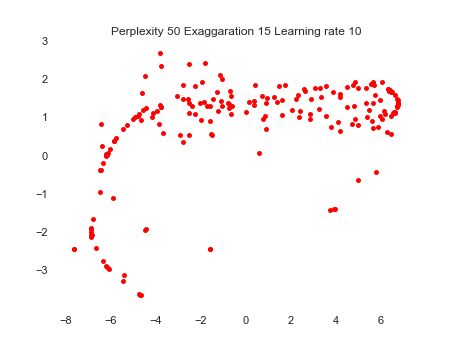

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


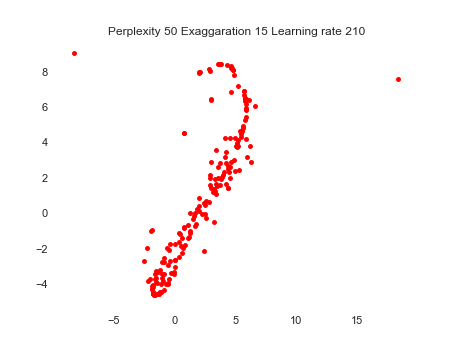

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


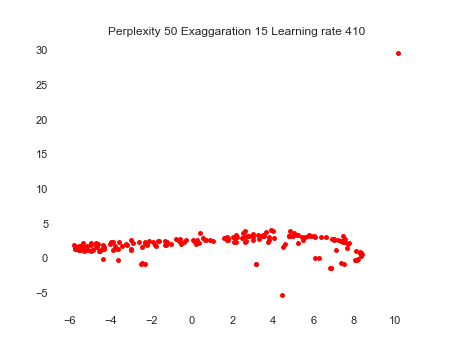

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


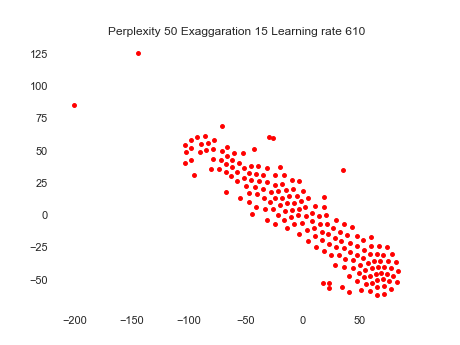

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


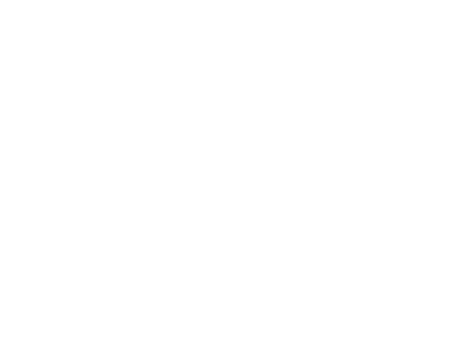

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


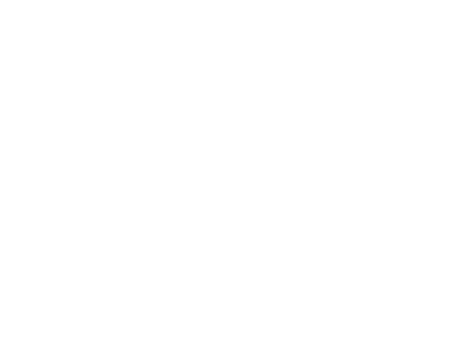

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


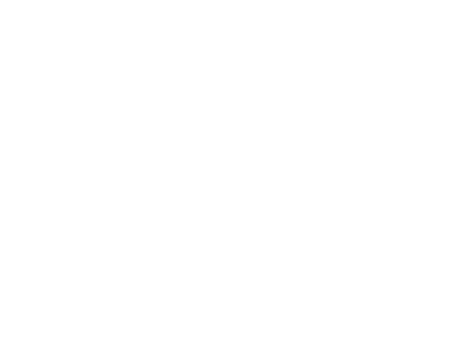

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


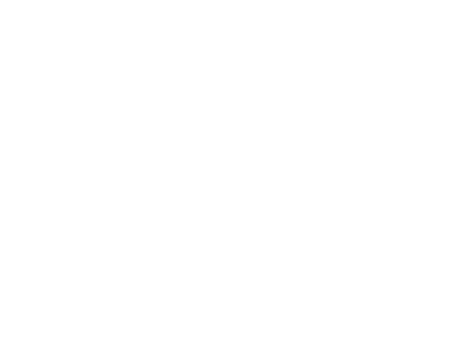

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


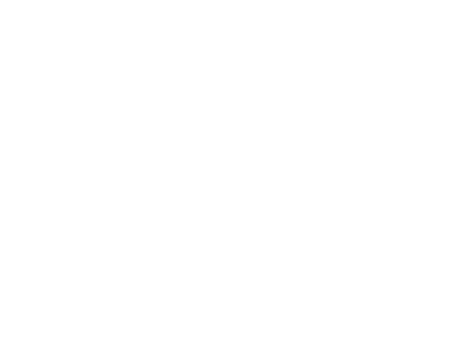

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


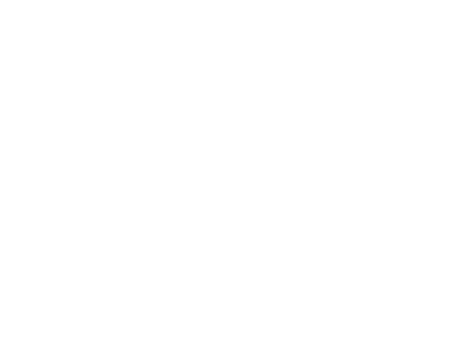

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


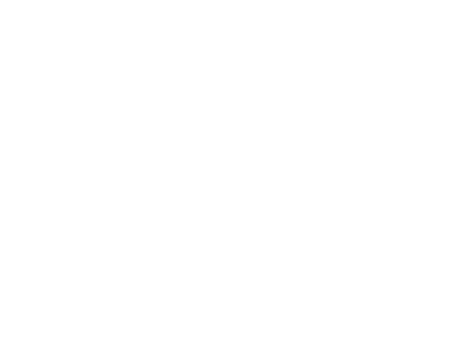

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


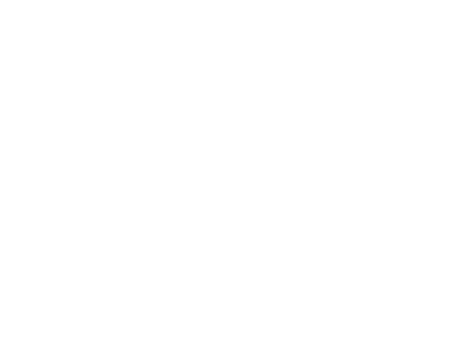

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


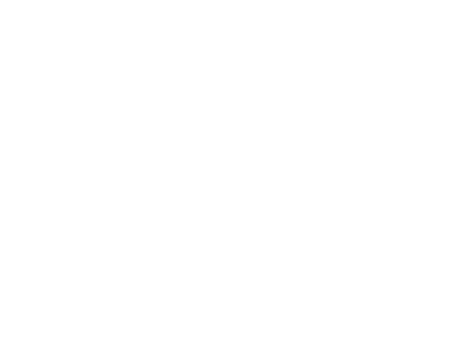

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


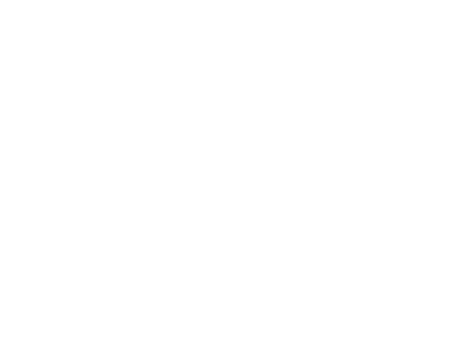

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


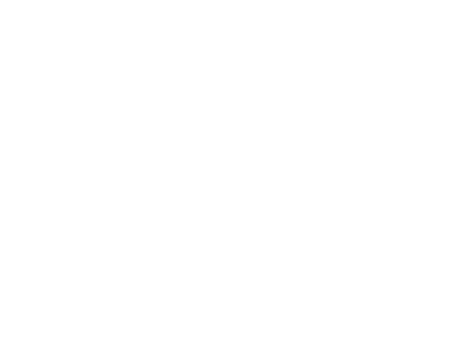

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


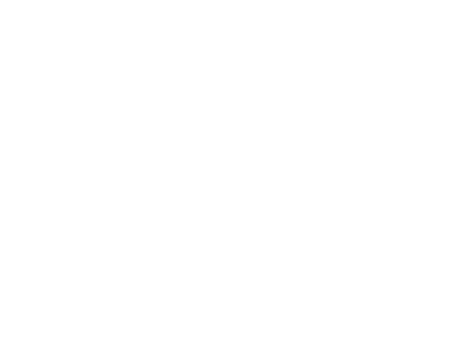

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


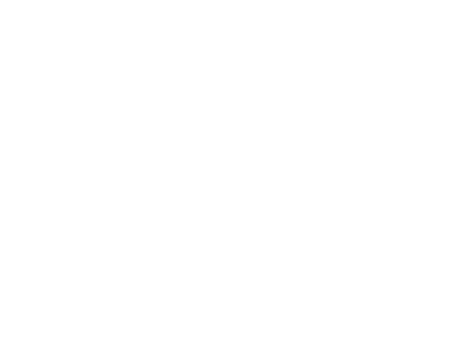

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


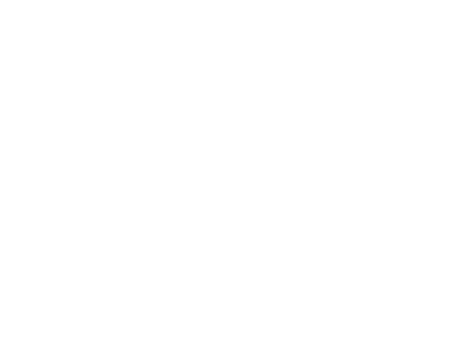

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


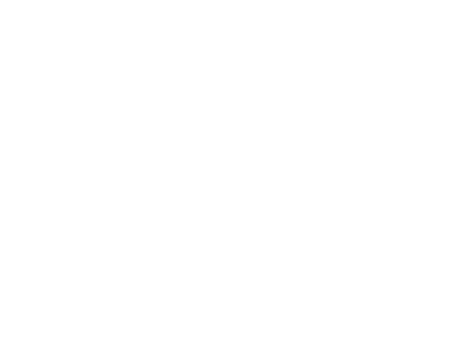

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


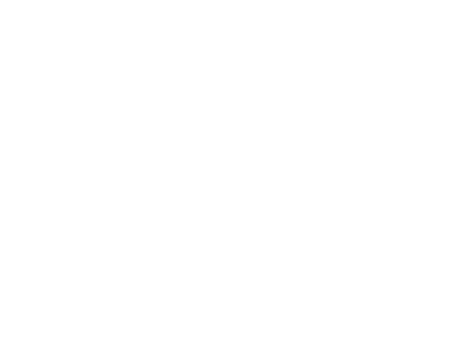

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


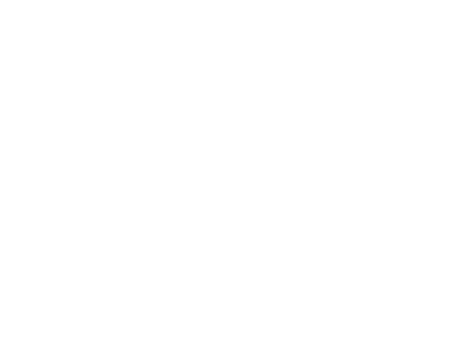

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


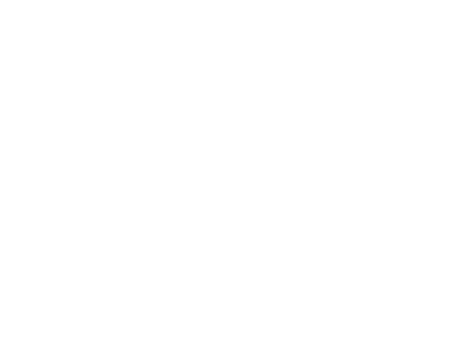

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


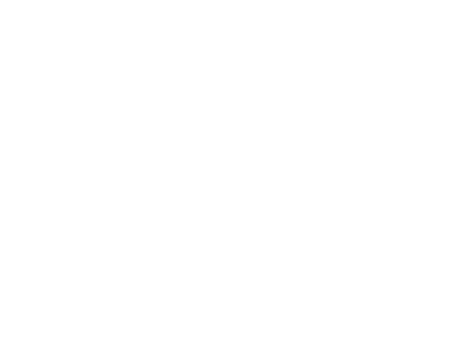

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


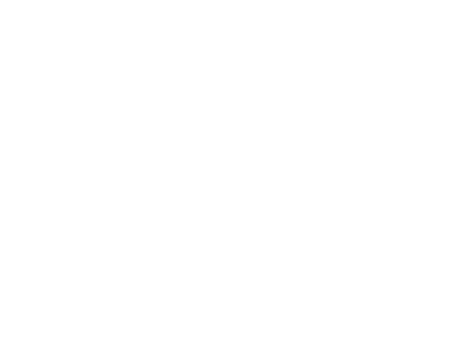

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


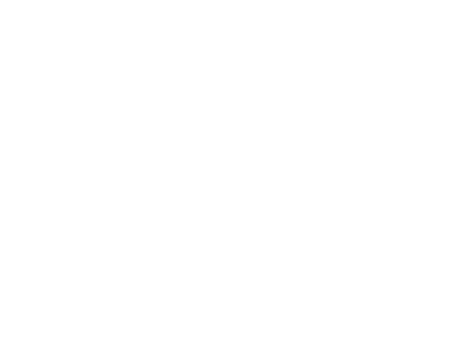

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


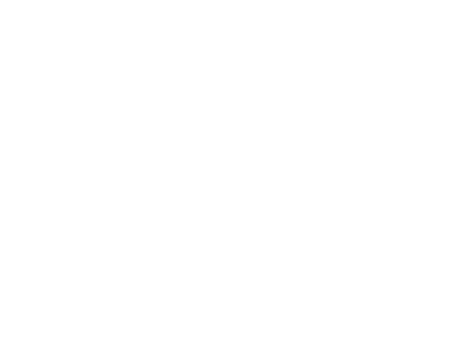

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


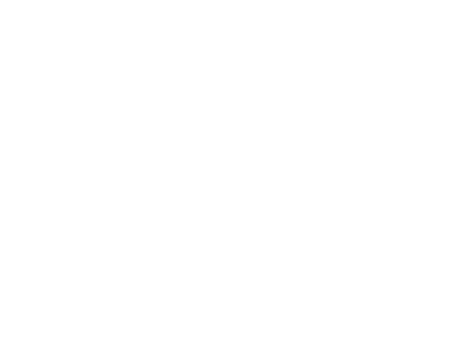

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


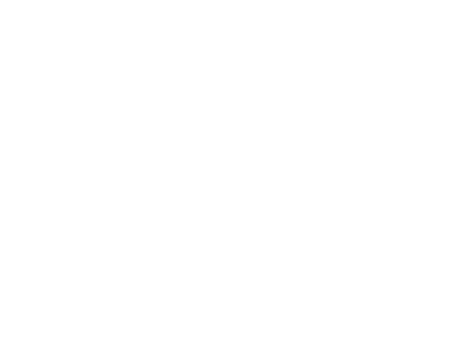

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


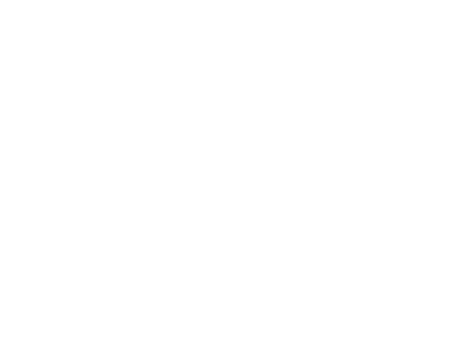

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


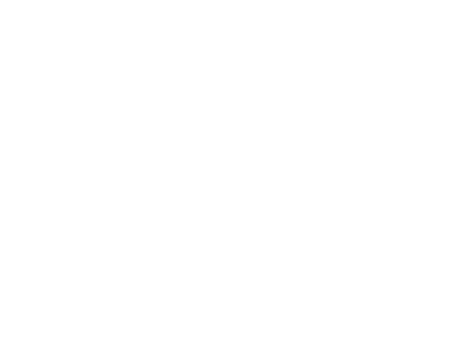

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


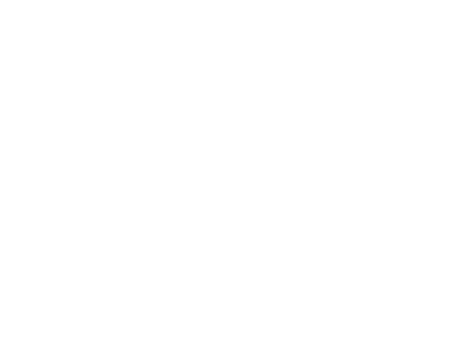

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


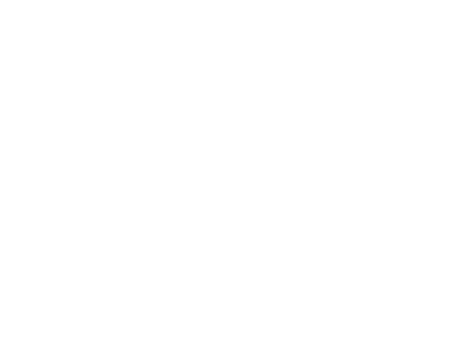

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


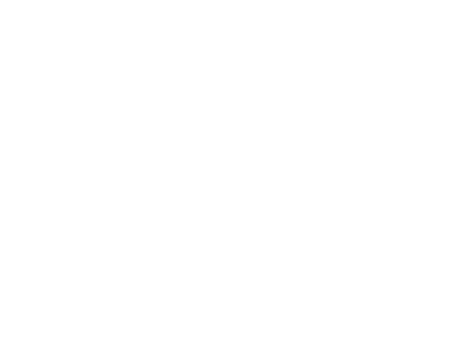

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


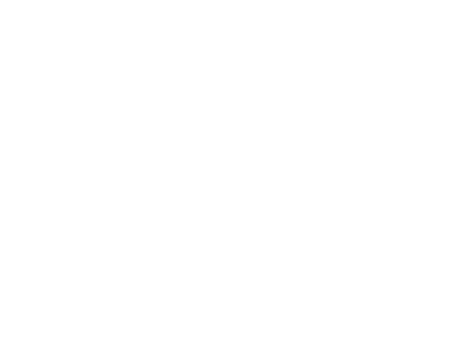

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


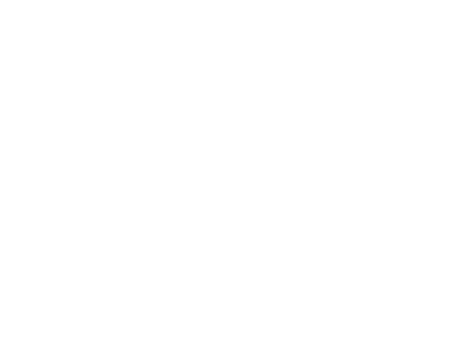

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


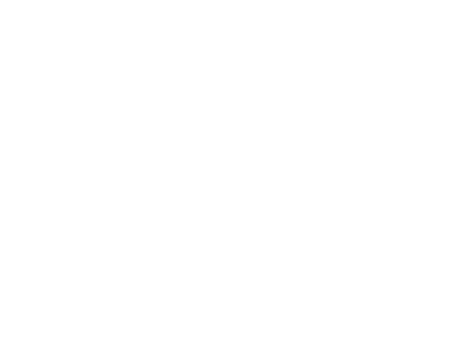

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


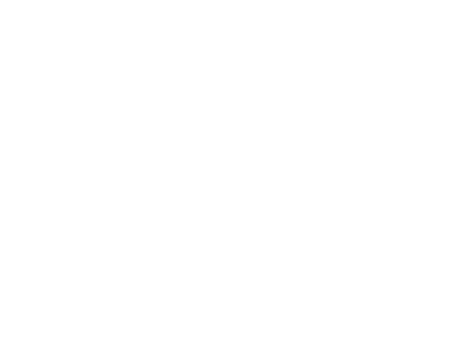

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


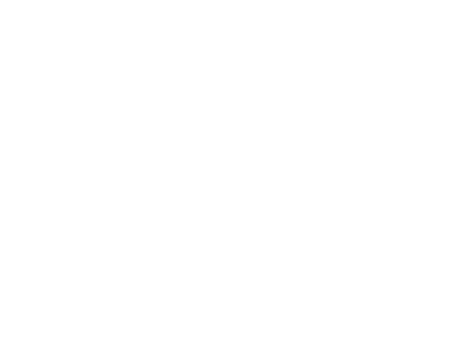

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


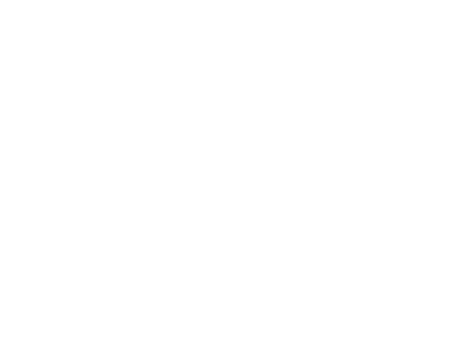

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


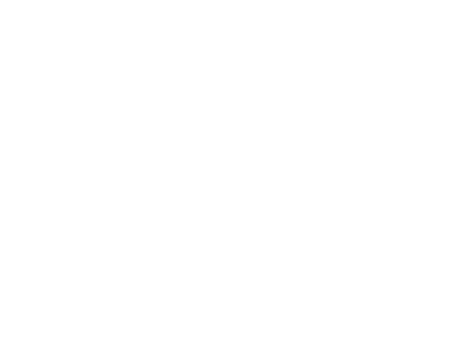

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


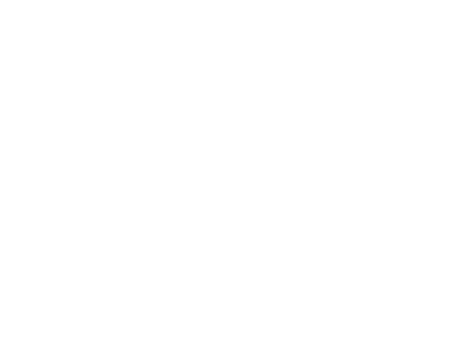

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


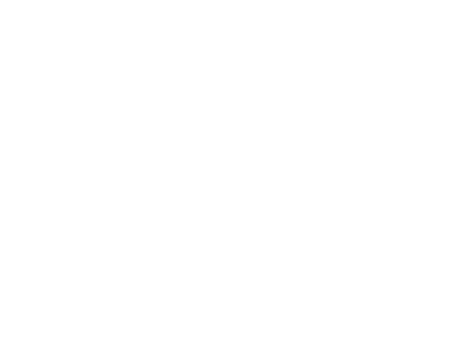

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


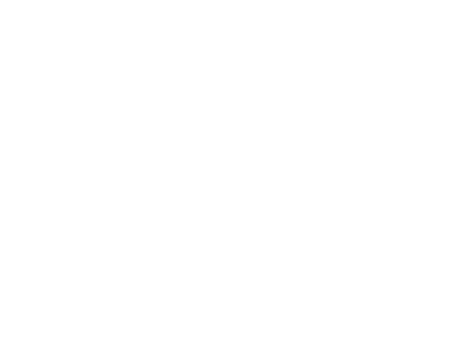

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


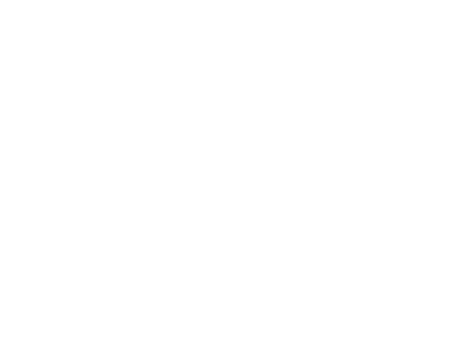

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


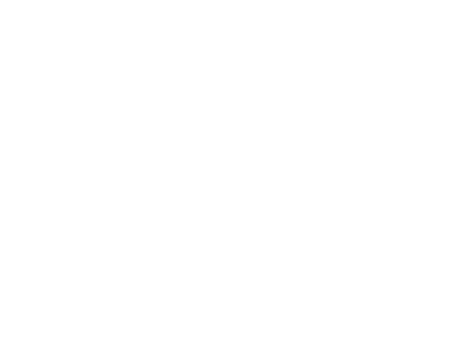

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


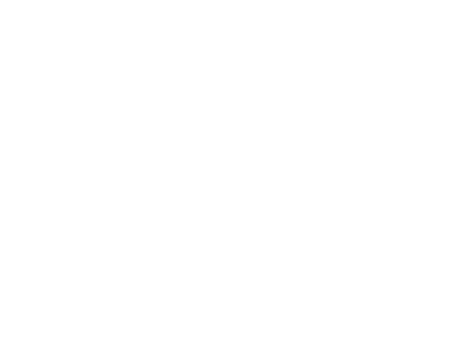

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


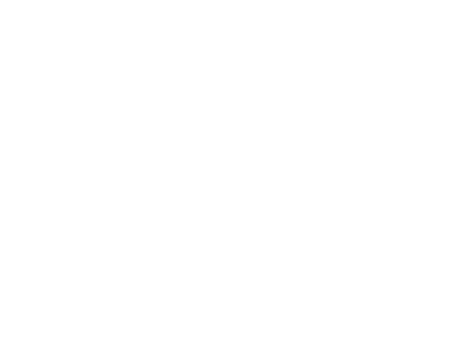

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


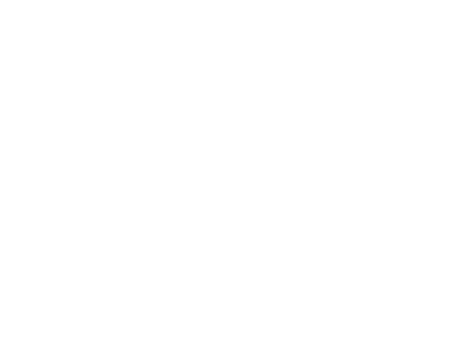

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


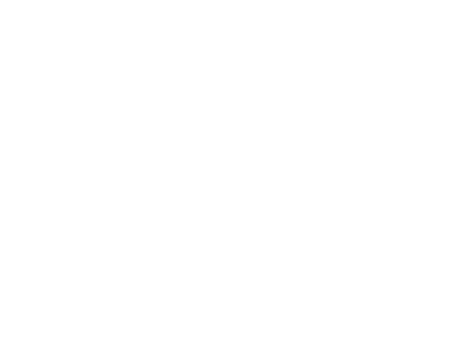

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


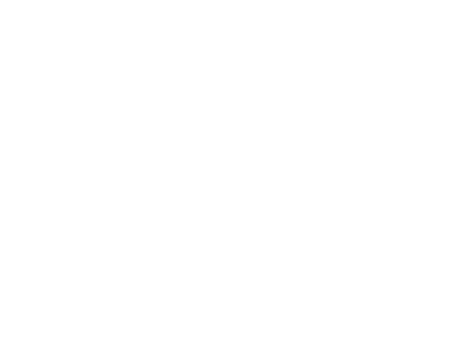

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


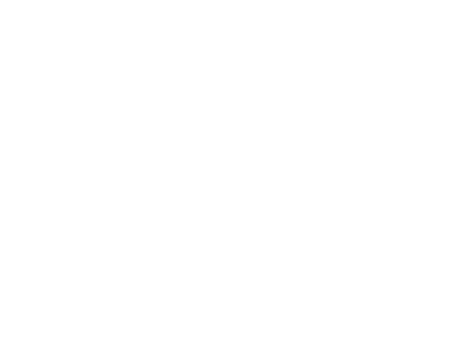

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


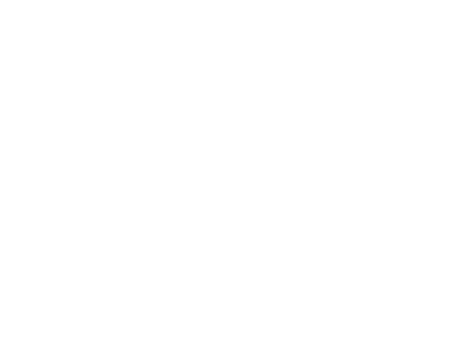

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


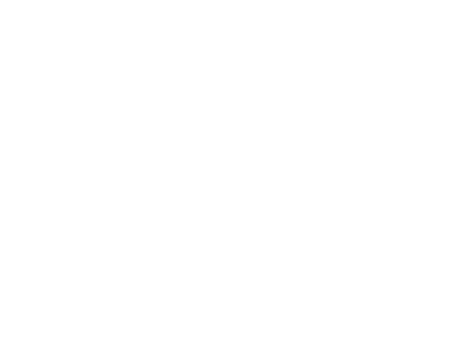

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


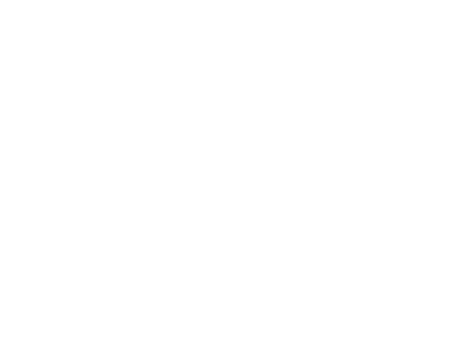

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


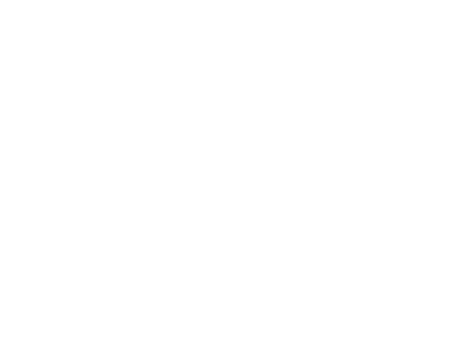

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


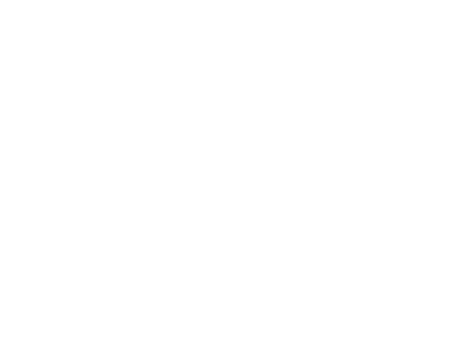

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


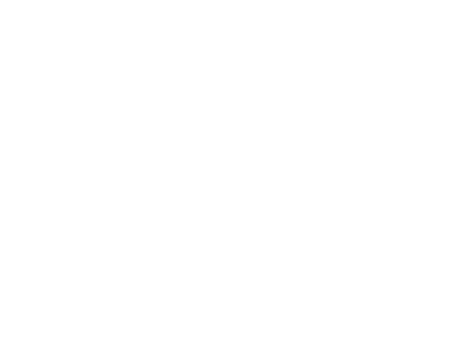

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


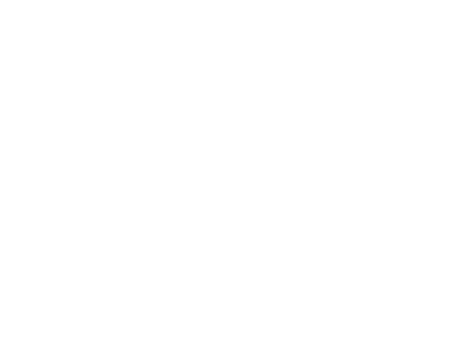

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


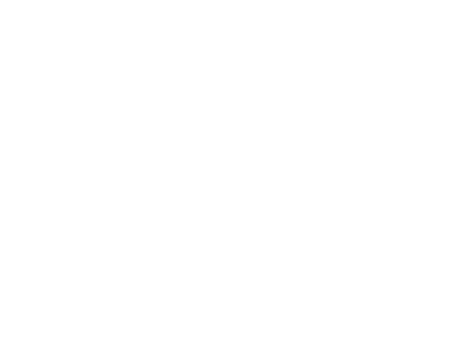

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


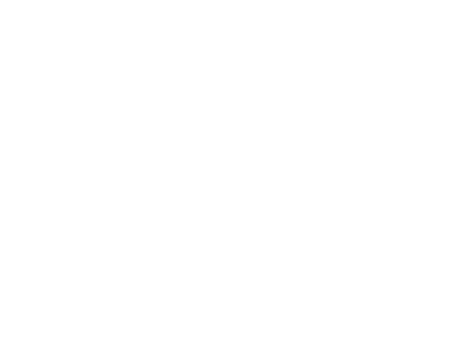

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


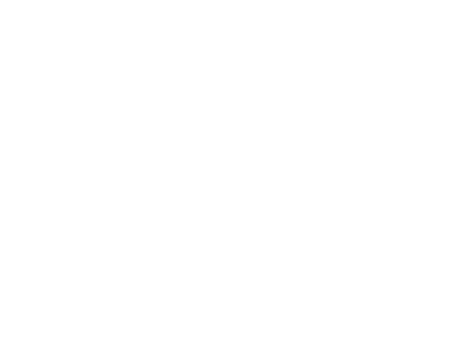

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


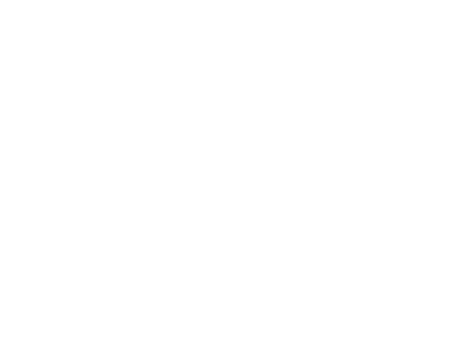

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


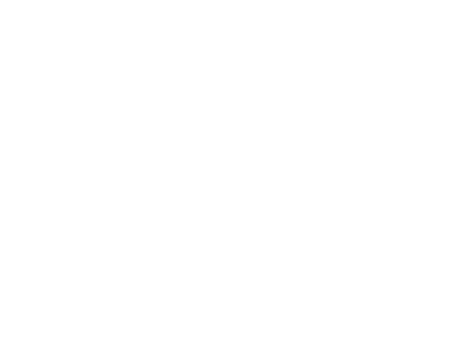

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


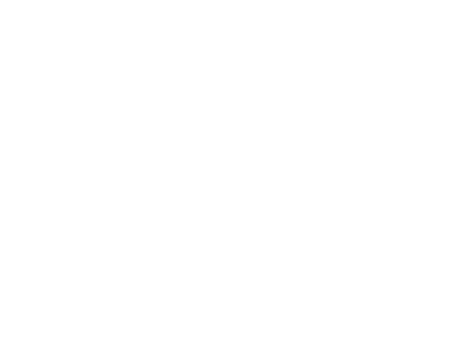

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


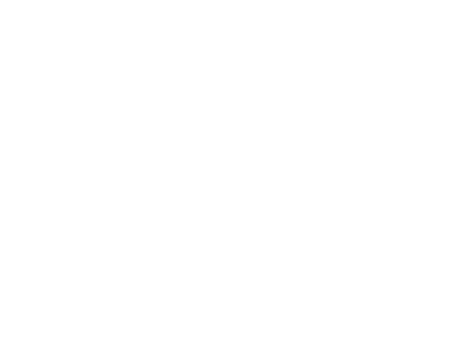

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


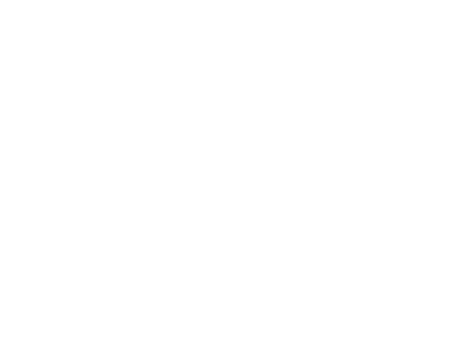

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


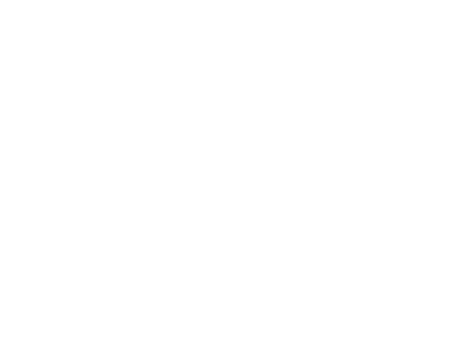

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


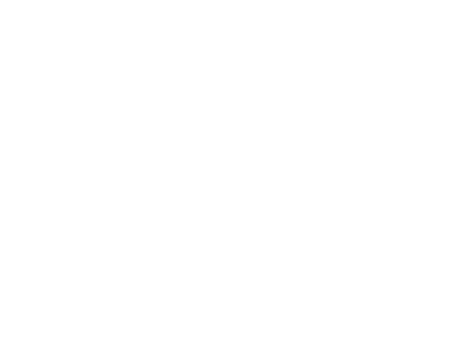

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


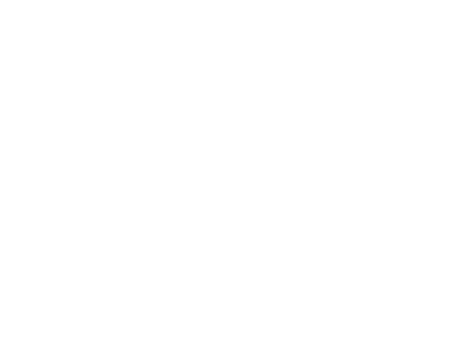

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


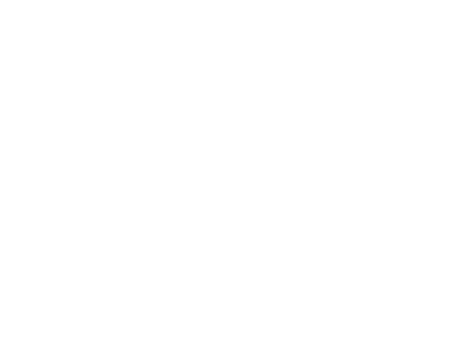

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


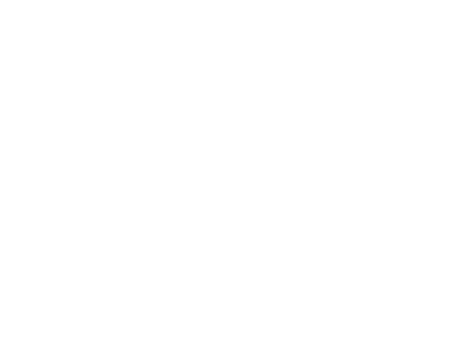

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


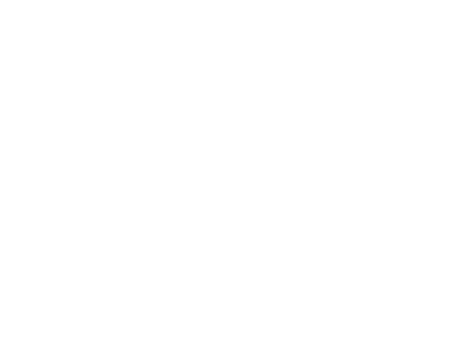

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


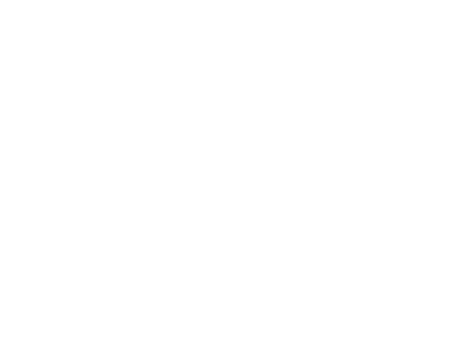

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


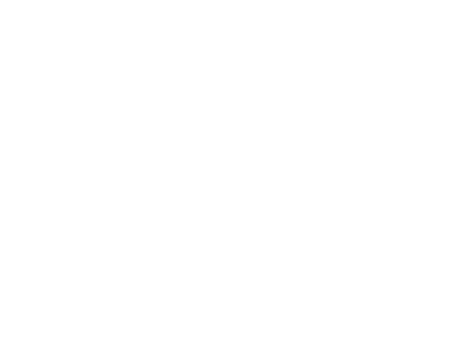

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


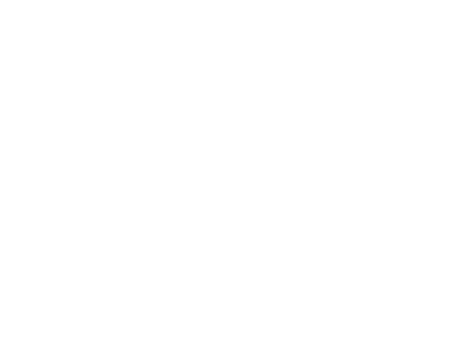

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


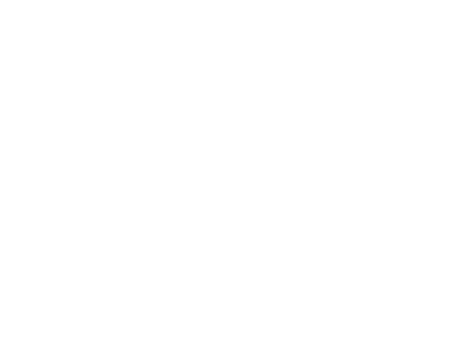

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


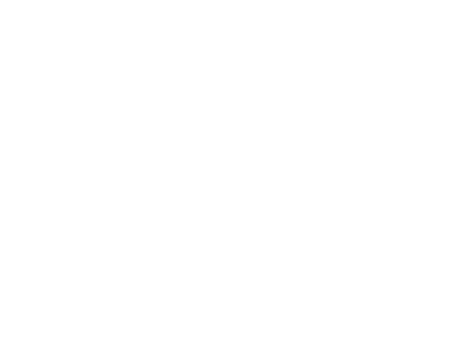

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


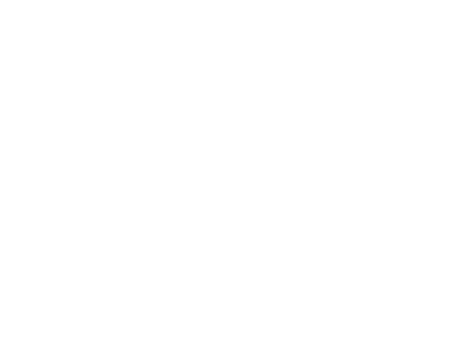

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


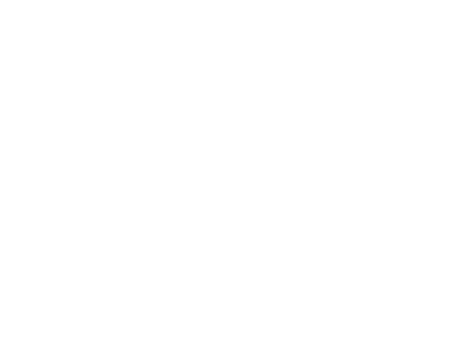

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


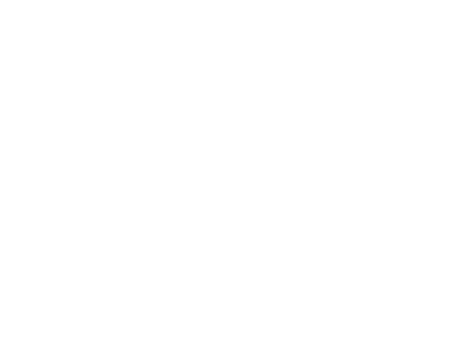

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


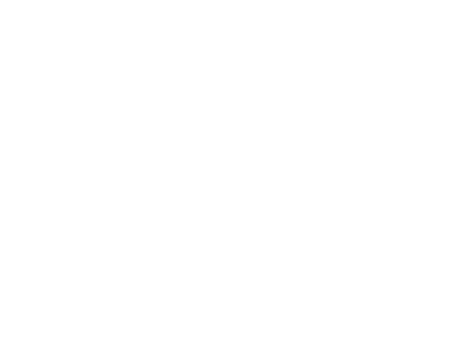

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


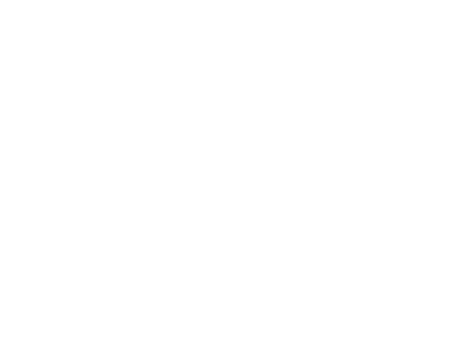

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


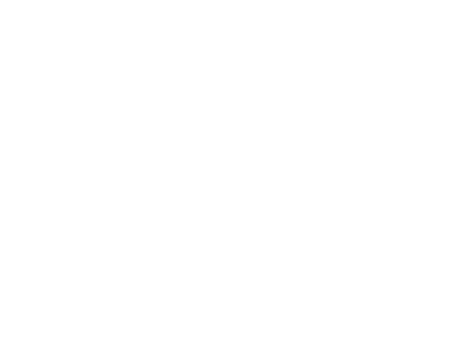

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


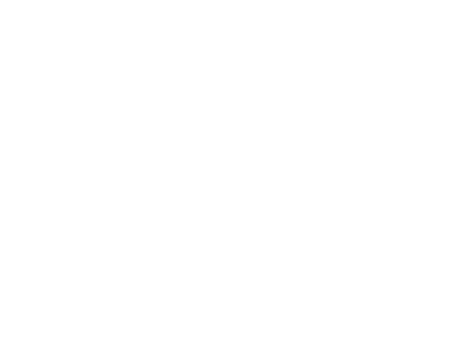

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


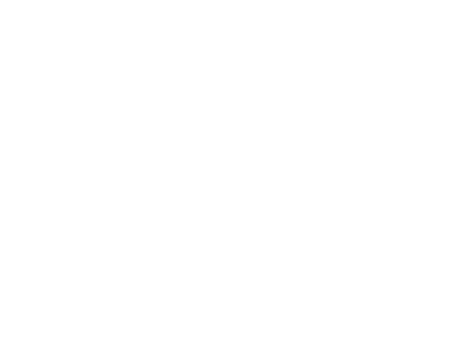

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


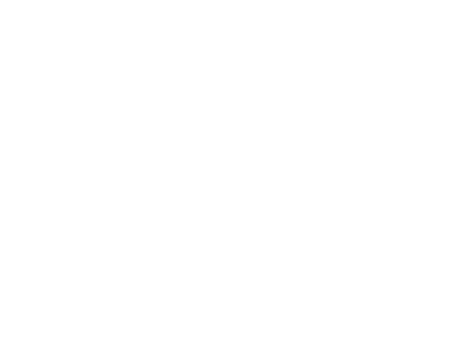

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


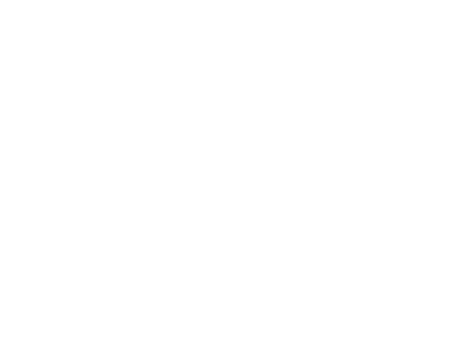

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


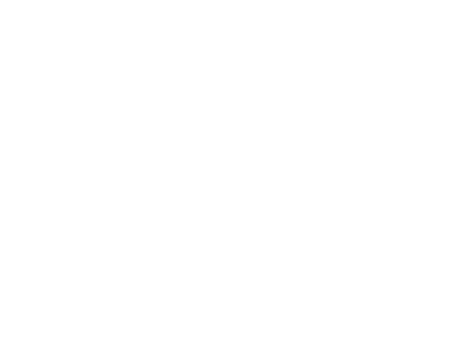

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


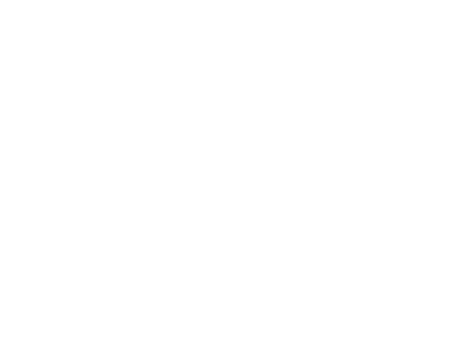

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


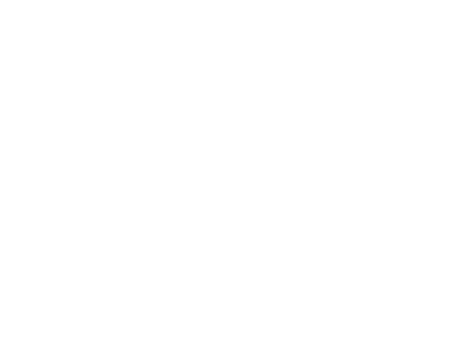

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


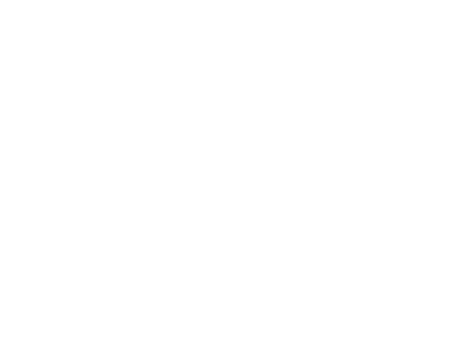

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


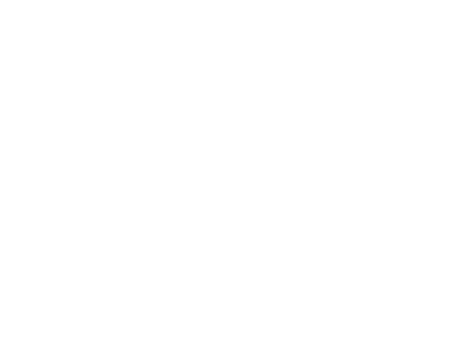

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


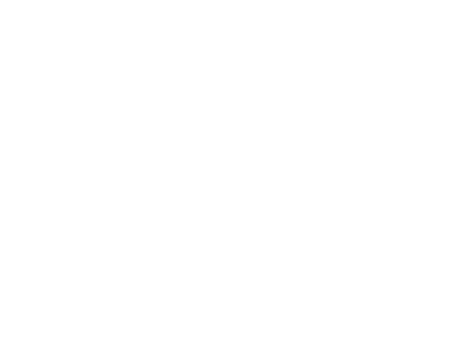

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


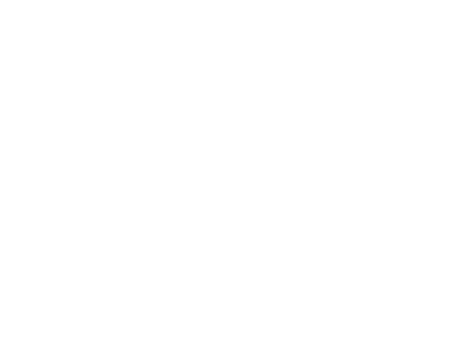

C:\ProgramData\Anaconda3\lib\site-packages\ipykernel_launcher.py:19: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`).


<IPython.core.display.Javascript object>


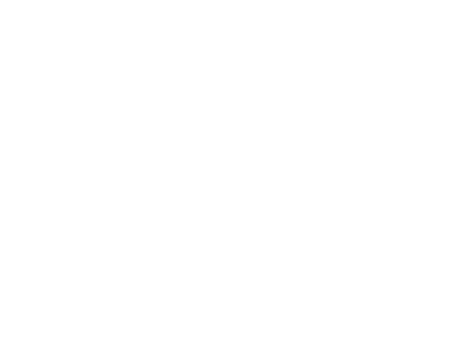

In [31]:
labels = list(df_unlabelled.columns)
c = []
# for i,type in enumerate(labels): 
#     if type in immune_out:
#         c.append('black')
#     else: 
#         c.append('r')
            
len(c)
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_UNLABELLED')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            tsne = TSNE(n_components=2,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l)
            tsne_obj= tsne.fit_transform(pixel_unlabelled_mean)
            tsne_df = pd.DataFrame({'X':tsne_obj[:,0],'Y':tsne_obj[:,1]})
            ax = plt.scatter(tsne_obj[:,0], tsne_obj[:,1],c = 'red',s= 15)
#             for i,type in enumerate(labels):
#                 if type in immune_out:
#                     print(type)
#                     #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
#                     x =tsne_obj[2:,0][i]
#                     y = tsne_obj[2:,1][i]
#                     plt.text(x, y, type, fontsize=10, c = 'black')

            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')
os.chdir(current_dir)    

In [36]:
df_in_sorted = df_in.sort_index(axis = 1)

df_out_sorted = df_out.sort_index(axis = 1)

df_in_out_sorted = df_in_out.sort_index(axis = 1)

# TSNE for Labelled Dataset - (divided by Masses text)

In [ ]:
c = []
for i,type in enumerate(labels): 
    if type == 'E'or type == 'Frag' or type == 'chain' or type == 'frag'or type == 'fragment-R-CO-H' or type == 'head' or type == '168Er-':
        c.append('yellow')
        continue
        
    if float(type)<200:
        c.append('b')
    elif 200<float(type)<400: 
        c.append('r')
    else: 
        c.append('g')
        
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_HYPERION_INSIDE_GERMINAL_CELLS_MASS_all_slices')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            tsne = TSNE(n_components=2,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l)
            tsne_obj= tsne.fit_transform(pixel_in_mean)
            tsne_df = pd.DataFrame({'X':tsne_obj[2:,0],'Y':tsne_obj[2:,1]})
            ax = plt.scatter(tsne_obj[2:,0], tsne_obj[2:,1],c =c,s=10)
#             for i,type in enumerate(labels):
#                 if type in labels:
                
#                     #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
#                     x =tsne_obj[2:,0][i]
#                     y = tsne_obj[2:,1][i]
#                     plt.text(x, y, type, fontsize=4, c = 'darkblue')

            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')
os.chdir(current_dir)    

# TSNE using K-Means Labels

In [ ]:
labels = list(df_in_sorted.columns)
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=7, random_state=0).fit(pixel_in)
# We can extract labels from k-cluster solution and store is to a list or a vector as per our requirement
Y=kmeans.labels_ # a vector

c = pd.DataFrame(Y.tolist()) # a list

In [ ]:

folder_path = os.path.join(results_store_path,'TSNE_PLOTS_HYPERION_OUTSIDE_GERMINAL_CELLS_MASS_ALL_PIXELS_3D')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            ax = Axes3D(fig) 
            tsne = TSNE(n_components=3,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l) #3D
            tsne_obj= tsne.fit_transform(pixel_in)
            tsne_df = pd.DataFrame({'X':tsne_obj[1:,0],'Y':tsne_obj[1:,1]})
            ax.scatter(tsne_obj[3:,0], tsne_obj[3:,1],tsne_obj[3:,2],c =c,s=10)# 3D 
            
            # First remove fill
#             ax.xaxis.pane.fill = False
#             ax.yaxis.pane.fill = False
#             ax.zaxis.pane.fill = False

#             # # Now set color to white (or whatever is "invisible")
#             #ax.grid(False)
#             ax.xaxis.pane.set_edgecolor('w')
#             ax.yaxis.pane.set_edgecolor('w')
#             ax.zaxis.pane.set_edgecolor('w')
#             ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
#             plt.gca().patch.set_facecolor('white')
#             # # Bonus: To get rid of the grid as well:

            # fig.colorbar(img)
            frame1 = plt.gca()
            frame1.axes.get_xaxis().set_ticks([])
            frame1.axes.get_yaxis().set_ticks([])
            frame1.axes.get_zaxis().set_ticks([])


            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')
os.chdir(current_dir)    

# TSNE using PCA

In [ ]:
from sklearn.decomposition import PCA
pca = PCA(n_components=123)
principalComponents = pca.fit_transform(pixel_in) # Either with 3D(pixel_in) or 2D(pixel_in_mean) or equivalent

        
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_HYPERION_INSIDE_GERMINAL_CELLS_PIXEL_PCA_standardized')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(0,100,10):
    for e in arange(10,30,5):
        for l in arange(10,1000,200):
            fig = plt.figure()
            ax = Axes3D(fig) 
            in_proj = TSNE(n_components=3,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l).fit_transform(principalComponents)
            ax.scatter3D(in_proj[:,0],in_proj[:,1],in_proj[:,2], c = Y, s = 1, alpha = 1)
            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')



#             # First remove fill
#             ax.xaxis.pane.fill = False
#             ax.yaxis.pane.fill = False
#             ax.zaxis.pane.fill = False

#             # # Now set color to white (or whatever is "invisible")
#             ax.grid(False)
#             ax.xaxis.pane.set_edgecolor('w')
#             ax.yaxis.pane.set_edgecolor('w')
#             ax.zaxis.pane.set_edgecolor('w')
#             ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
#             plt.gca().patch.set_facecolor('white')
#             # # Bonus: To get rid of the grid as well:

#             # fig.colorbar(img)
#             frame1 = plt.gca()
#             frame1.axes.get_xaxis().set_ticks([])
#             frame1.axes.get_yaxis().set_ticks([])
#             frame1.axes.get_zaxis().set_ticks([])
#             for i,type in enumerate(labels):
#                 if type in labels:
                
#                     #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
#                     x =tsne_obj[2:,0][i]
#                     y = tsne_obj[2:,1][i]
#                     plt.text(x, y, type, fontsize=4, c = 'darkblue')

os.chdir(current_dir)    




# TSNE with DWT

In [ ]:
import pywt
coeffs = np.zeros((123,76*128*128))
for i in range(123):
    coeffs[i,:] = pywt.dwtn(pixel_in_images[i],'db1')['aaa'].ravel()

In [ ]:
folder_path = os.path.join(results_store_path,'TSNE_PLOTS_HYPERION_INSIDE_GERMINAL_CELLS_DWT_HLL')
if os.path.isdir(folder_path) == False:
        os.mkdir(folder_path)

current_dir = os.getcwd()
os.chdir(folder_path)
for P in arange(10,100,10):
    for e in arange(5,60,5):
        for l in arange(100,1000,100):
            fig = plt.figure()
             
            in_proj = TSNE(n_components=2,perplexity = P,early_exaggeration = e, random_state=0,learning_rate = l).fit_transform(coeffs)
            plt.scatter(in_proj[:,0],in_proj[:,1], s = 9,c = Y, alpha = 1)
            plt.gca().patch.set_facecolor('white')
            plt.title('Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) )  
            plt.savefig('TSNE ' + 'Perplexity ' + str(P) + ' Exaggaration ' + str(e) + ' Learning rate ' +  str(l) + '.png')



#             # First remove fill
#             ax.xaxis.pane.fill = False
#             ax.yaxis.pane.fill = False
#             ax.zaxis.pane.fill = False

#             # # Now set color to white (or whatever is "invisible")
#             ax.grid(False)
#             ax.xaxis.pane.set_edgecolor('w')
#             ax.yaxis.pane.set_edgecolor('w')
#             ax.zaxis.pane.set_edgecolor('w')
#             ax.w_xaxis.set_pane_color((1.0, 1.0, 1.0, 1.0))
#             plt.gca().patch.set_facecolor('white')
#             # # Bonus: To get rid of the grid as well:

#             # fig.colorbar(img)
#             frame1 = plt.gca()
#             frame1.axes.get_xaxis().set_ticks([])
#             frame1.axes.get_yaxis().set_ticks([])
#             frame1.axes.get_zaxis().set_ticks([])
#             for i,type in enumerate(labels):
#                 if type in labels:
                
#                     #ax.scatter(tsne_obj[2:,0][i], tsne_obj[2:,1][i], color= 'b',s =1 )
                    
#                     x =tsne_obj[2:,0][i]
#                     y = tsne_obj[2:,1][i]
#                     plt.text(x, y, type, fontsize=4, c = 'darkblue')

os.chdir(current_dir)    




In [45]:
df_in.columns = [int(x) for x in df_in.columns]
df_out.columns = [int(x) for x in df_out.columns]
df_in_out.columns = [int(x) for x in df_in_out.columns]
df_unlabelled.columns = [int(x) for x in df_unlabelled.columns]

df_in_sorted = df_in.sort_index(axis = 1)

df_out_sorted = df_out.sort_index(axis = 1)

df_in_out_sorted = df_in_out.sort_index(axis = 1)

df_unlabelled = df_unlabelled.sort_index(axis =1)

In [46]:
df_in_sorted = df_in.sort_index(axis = 1)

df_out_sorted = df_out.sort_index(axis = 1)

df_in_out_sorted = df_in_out.sort_index(axis = 1)

df_unlabelled = df_unlabelled.sort_index(axis =1)

In [27]:
in_corr = df_in.corr()
out_corr = df_out.corr()
in_out_corr = df_in_out.corr()
unlabelled_corr = df_unlabelled.corr()

# Anti-Correlations and Correlations

In [28]:
def get_redundant_pairs(df):
    pairs_to_drop = set()
    cols = df.columns
    for i in range(0, df.shape[1]):
        for j in range(0, i+1):
            pairs_to_drop.add((cols[i], cols[j]))
    return pairs_to_drop

def get_top_abs_correlations(df,n):
    au_corr = df.corr().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=False)
    return au_corr[0:n]


def get_bottom_abs_correlations(df, n):
    au_corr = df.corr().unstack()
    labels_to_drop = get_redundant_pairs(df)
    au_corr = au_corr.drop(labels=labels_to_drop).sort_values(ascending=True)
    return au_corr[0:n]



In [29]:
def convert_list(in_1):
    code = [] 
    for i in in_1.index:
        code.append(i)
    return set(np.array(code).ravel())

In [30]:
lipid_list = [30,44,55,56,57,58,59,60,61,66,67,68,69,70,71,72,73,74,81,82,83,84,85,86,87,88,91,93,95,97,98,100,102,104,105,107,111,125,146,166,182,184,185,194,196,198,206,207,210,212,221,224,226,238,240,246,252,254,256,263,267,282]
lipid_list = [str(x) for x in lipid_list]

In [30]:
lipid_list = [int(x) for x in lipid_list]

In [49]:
df.columns = [str(x) for x in df.columns]
df1.columns = [str(x) for x in df1.columns]
df2.columns = [str(x) for x in df2.columns]
df3.columns = [str(x) for x in df3.columns]

df_sorted = df.sort_index(axis = 1)

df1_sorted = df1.sort_index(axis = 1)

df2_sorted = df2.sort_index(axis = 1)

df3_sorted = df3.sort_index(axis =1)

In [213]:
number_of_compounds = 100
in_1 = get_top_abs_correlations(df,number_of_compounds)
in_2 = get_bottom_abs_correlations(df,number_of_compounds)
out_1 = get_top_abs_correlations(df1,number_of_compounds)
out_2 = get_bottom_abs_correlations(df1,number_of_compounds)
in_out_1 = get_top_abs_correlations(df2,number_of_compounds)
in_out_2 = get_bottom_abs_correlations(df2,number_of_compounds)

unlabelled_1 = get_top_abs_correlations(df3,number_of_compounds)
unlabelled_2 = get_bottom_abs_correlations(df3,number_of_compounds)
unlabelled_1_compounds = convert_list(unlabelled_1)
unlabelled_2_compounds = convert_list(unlabelled_2)

in_1_compounds = convert_list(in_1) 
in_2_compounds = convert_list(in_2) 
out_1_compounds = convert_list(out_1) 
out_2_compounds = convert_list(out_2) 
in_out_1_compounds = convert_list(in_out_1) 
in_out_2_compounds = convert_list(in_out_2) 

In [31]:
number_of_compounds = 20
in_1 = get_top_abs_correlations(df_in,number_of_compounds)
in_2 = get_bottom_abs_correlations(df_in,number_of_compounds)
out_1 = get_top_abs_correlations(df_out,number_of_compounds)
out_2 = get_bottom_abs_correlations(df_out,number_of_compounds)
in_out_1 = get_top_abs_correlations(df_in_out,number_of_compounds)
in_out_2 = get_bottom_abs_correlations(df_in_out,number_of_compounds)

unlabelled_1 = get_top_abs_correlations(df_unlabelled,number_of_compounds)
unlabelled_2 = get_bottom_abs_correlations(df_unlabelled,number_of_compounds)
unlabelled_1_compounds = convert_list(unlabelled_1)
unlabelled_2_compounds = convert_list(unlabelled_2)

in_1_compounds = convert_list(in_1) 
in_2_compounds = convert_list(in_2) 
out_1_compounds = convert_list(out_1) 
out_2_compounds = convert_list(out_2) 
in_out_1_compounds = convert_list(in_out_1) 
in_out_2_compounds = convert_list(in_out_2) 

In [32]:
print('\nIN VS OUT GERMINAL TOP\n')
in_inter_out_1 = in_1_compounds.intersection(out_1_compounds)
print(in_1_compounds.intersection(out_1_compounds))

print('\nIN VS IN OUT GERMINAL TOP\n')
in_inter_in_out_1 = in_1_compounds.intersection(in_out_1_compounds)
print(in_1_compounds.intersection(in_out_1_compounds))

print('\nOUT VS IN OUT GERMINAL TOP\n')
out_inter_in_out_1 = out_1_compounds.intersection(in_out_1_compounds)
print(out_1_compounds.intersection(in_out_1_compounds))

print('\nIN VS OUT GERMINAL BOTTOM\n')
in_inter_out_2 = in_2_compounds.intersection(out_2_compounds)
print(in_2_compounds.intersection(out_2_compounds))

in_inter_in_out_2 = in_2_compounds.intersection(in_out_2_compounds)
print('\nIN VS IN OUT GERMINAL BOTTOM\n')
print(in_2_compounds.intersection(in_out_2_compounds))

out_inter_in_out_2 = out_2_compounds.intersection(in_out_2_compounds)
print('\nOUT VS IN OUT GERMINAL BOTTOM\n')
print(out_2_compounds.intersection(in_out_2_compounds))


IN VS OUT GERMINAL TOP

{'91', '84', '16', '66', '42', '75'}

IN VS IN OUT GERMINAL TOP

{'91', '84', '66', '42', '75'}

OUT VS IN OUT GERMINAL TOP

{'91', '74', '84', '66', '185', '42', '50', '75'}

IN VS OUT GERMINAL BOTTOM

set()

IN VS IN OUT GERMINAL BOTTOM

set()

OUT VS IN OUT GERMINAL BOTTOM

{'518', '431', '552', '544', '448', '586', '479', '436', '474'}


In [33]:
print('\nIN VS OUT GERMINAL TOP\n')
in_diff_out_1 = in_1_compounds.difference(out_1_compounds)
print(in_1_compounds.difference(out_1_compounds))

print('\nIN VS IN OUT GERMINAL TOP\n')
in_diff_in_out_1 = in_1_compounds.difference(in_out_1_compounds)
print(in_1_compounds.difference(in_out_1_compounds))

print('\nOUT VS IN OUT GERMINAL TOP\n')
out_diff_in_out_1 = out_1_compounds.difference(in_out_1_compounds)
print(out_1_compounds.difference(in_out_1_compounds))

print('\nIN VS OUT GERMINAL BOTTOM\n')
in_diff_out_2 = in_2_compounds.difference(out_2_compounds)
print(in_2_compounds.difference(out_2_compounds))

print('\nIN VS IN OUT GERMINAL BOTTOM\n')
in_diff_in_out_2 = in_2_compounds.difference(in_out_2_compounds)
print(in_2_compounds.difference(in_out_2_compounds))

print('\nOUT VS IN OUT GERMINAL BOTTOM\n')
out_diff_in_out_2 = out_2_compounds.difference(in_out_2_compounds)
print(out_2_compounds.difference(in_out_2_compounds))


IN VS OUT GERMINAL TOP

{'86', '60', '76', '100', '17', '107'}

IN VS IN OUT GERMINAL TOP

{'86', '60', '16', '76', '100', '17', '107'}

OUT VS IN OUT GERMINAL TOP

{'35', '16'}

IN VS OUT GERMINAL BOTTOM

{'91', '97', '74', '84', '16', '122', '79', '100', '98', '17', '35', '121', '133', '107', '50', '75'}

IN VS IN OUT GERMINAL BOTTOM

{'91', '97', '74', '84', '16', '122', '79', '100', '98', '17', '35', '121', '133', '107', '50', '75'}

OUT VS IN OUT GERMINAL BOTTOM

{'514', '570', '520', '412'}


In [34]:
print('\nOUT VS IN GERMINAL TOP\n')
out_diff_in_1 = out_1_compounds.difference(in_1_compounds)
print(out_1_compounds.difference(in_1_compounds))

print('\nIN OUT VS IN GERMINAL TOP\n')
in_out_diff_in_1 = in_out_1_compounds.difference(in_1_compounds)
print(in_out_1_compounds.difference(in_1_compounds))

print('\nIN OUT VS OUT GERMINAL TOP\n')
in_out_diff_out_1 = in_out_1_compounds.difference(out_1_compounds)
print(in_out_1_compounds.difference(out_1_compounds))

print('\nOUT VS IN GERMINAL BOTTOM\n')
out_diff_in_2 = out_2_compounds.difference(in_2_compounds)
print(out_2_compounds.difference(in_2_compounds))

print('\nIN OUT VS IN GERMINAL BOTTOM\n')
in_out_diff_in_2 = in_out_2_compounds.difference(in_2_compounds)
print(in_out_2_compounds.difference(in_2_compounds))

print('\nIN OUT VS OUT GERMINAL BOTTOM\n')
in_out_diff_out_2 = in_out_2_compounds.difference(out_2_compounds)
print(in_out_2_compounds.difference(out_2_compounds))


OUT VS IN GERMINAL TOP

{'35', '74', '50', '185'}

IN OUT VS IN GERMINAL TOP

{'74', '97', '73', '185', '98', '72', '50'}

IN OUT VS OUT GERMINAL TOP

{'73', '72', '97', '98'}

OUT VS IN GERMINAL BOTTOM

{'518', '431', '570', '552', '544', '448', '514', '586', '479', '436', '412', '520', '474'}

IN OUT VS IN GERMINAL BOTTOM

{'518', '474', '448', '328', '479', '610', '397', '267', '436', '593', '510', '431', '544', '236', '498', '1', '276', '501', '552', '259', '586'}

IN OUT VS OUT GERMINAL BOTTOM

{'1', '276', '610', '501', '397', '236', '328', '267', '593', '498', '259', '510'}


## IN-OUT INTERSECTION GRAPH

In [51]:
os.chdir(results_store_path)

In [34]:
lipid_list = [30,34,44,55,56,57,58,59,60,61,66,67,68,69,70,71,72,73,74,81,82,83,84,85,86,87,88,91,93,95,97,98,100,102,104,105,107,111,125,146,148,150,166,167,168,182,184,185,190,194,196,198,206,207,210,212,221,224,226,238,240,246,252,254,256,263,267,282]
lipid_list = [str(x) for x in lipid_list]

<IPython.core.display.Javascript object>


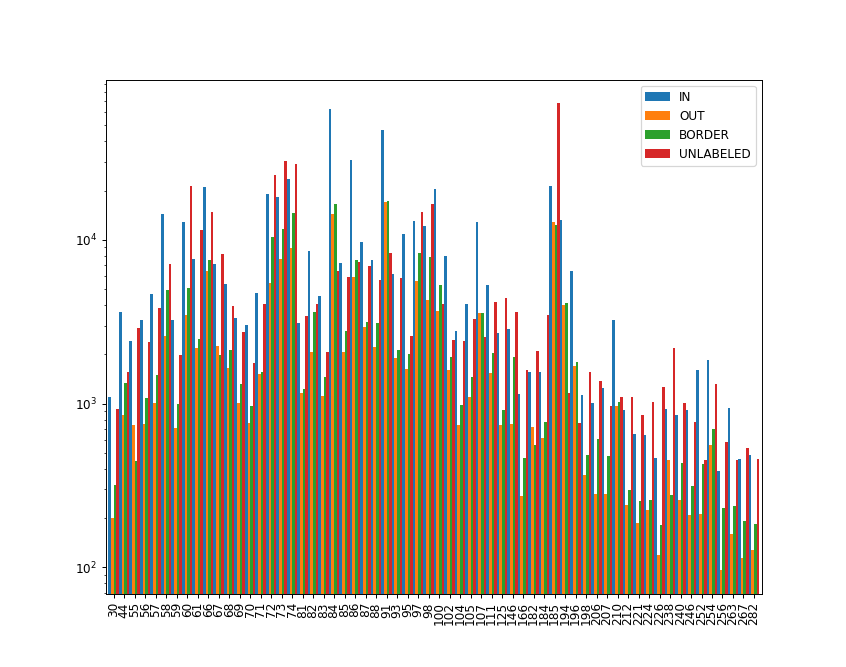

In [63]:
%matplotlib notebook

df_0 = df_in[lipid_list].sum(axis = 0)
df_1 = df_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df_in_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df_unlabelled[lipid_list].sum(axis =0)#.plot.bar(rot = 45)

df_new = pd.DataFrame({'IN':df_0,'OUT':df_1,'BORDER':df_2,'UNLABELED':df_3}, index = df_0.index
                     )
ax = df_new.plot.bar(rot = 90 ,logy = True,fontsize = 10,width = 1)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)

# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
#plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison',bbox_inches='tight')

<IPython.core.display.Javascript object>


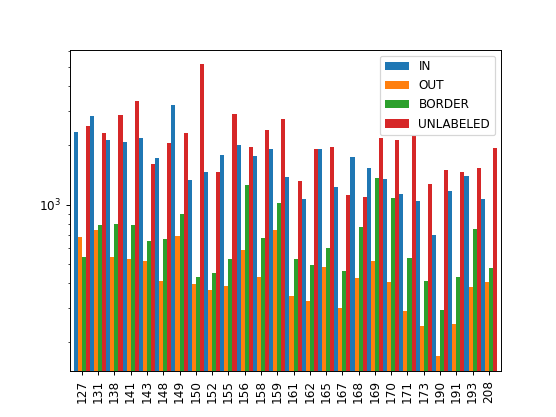

In [73]:
%matplotlib notebook
immune_labels = [str(x) for x in immune_labels]

df_in.columns = [str(x) for x in df_in.columns]
df_out.columns = [str(x) for x in df_out.columns]
df_in_out.columns = [str(x) for x in df_in_out.columns]
df_unlabelled.columns = [str(x) for x in df_unlabelled.columns]
df_0 = df_in[immune_labels].sum(axis = 0)
df_1 = df_out[immune_labels].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df_in_out[immune_labels].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df_unlabelled[immune_labels].sum(axis =0)#.plot.bar(rot = 45)
df_0 = df_0.sort_index()
df_1 = df_1.sort_index()
df_2 = df_2.sort_index()
df_3 = df_3.sort_index()
df_new = pd.DataFrame({'IN':df_0,'OUT': df_1,'BORDER': df_2,'UNLABELED':df_3}, index = df_0.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 10)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('immune_comparison_all.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


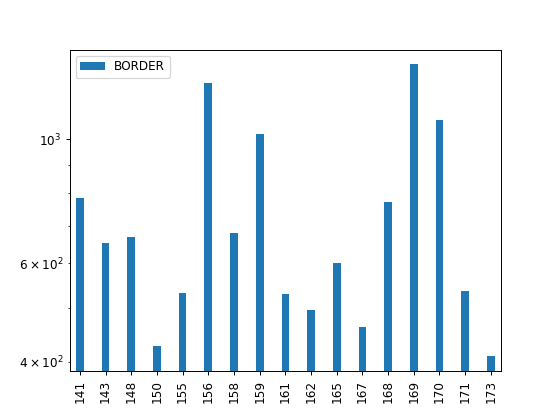

In [69]:
%matplotlib notebook

df_0 = df_in[immune_labels_imp].sum(axis = 0)
df_1 = df_out[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df_in_out[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df_unlabelled[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)

df_new = pd.DataFrame({'BORDER':df_2}, index = df_0.index
                     )
ax = df_new.plot.bar(rot = 90 ,logy = True,fontsize = 10,width = 0.3)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)

# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
#plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')

In [106]:
df1 = df_in_sorted_out.iloc[out_large].sum(axis =0)#.plot.bar(rot = 45)
df2 = df_out_sorted.iloc[out_large].sum(axis =0)#.plot.bar(rot = 45)
df3 = df_in_out_sorted_out.iloc[out_large].sum(axis =0)#.plot.bar(rot = 45)


NameError: name 'df_in_sorted_out' is not defined

In [52]:
df


,50,190,191,193,194,196,198,200,201,202,...,167,168,169,170,171,173,179,182,184,185
0,2.650000,0.00,0.05,0.0,0.150000,0.10,0.00,0.05,0.150000,0.0,...,0.00,0.05,0.05,0.10,0.000000,0.00,0.05,0.05,0.15,0.400000
1,2.000000,0.05,0.00,0.0,0.100000,0.05,0.00,0.00,0.050000,0.1,...,0.00,0.00,0.00,0.10,0.000000,0.05,0.00,0.00,0.05,0.300000
2,1.200000,0.00,0.05,0.1,0.150000,0.10,0.00,0.05,0.000000,0.0,...,0.00,0.10,0.00,0.05,0.000000,0.00,0.00,0.05,0.00,0.300000
3,1.050000,0.00,0.00,0.0,0.050000,0.05,0.05,0.00,0.050000,0.0,...,0.00,0.05,0.00,0.05,0.050000,0.00,0.00,0.05,0.00,0.350000
4,1.600000,0.00,0.00,0.0,0.350000,0.10,0.00,0.05,0.200000,0.0,...,0.00,0.10,0.15,0.00,0.000000,0.00,0.05,0.00,0.05,0.750000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
524283,1.300000,0.00,0.00,0.0,0.150000,0.15,0.00,0.00,0.050000,0.0,...,0.00,0.00,0.05,0.00,0.000000,0.00,0.05,0.05,0.10,0.250000
524284,1.050000,0.00,0.00,0.0,0.050000,0.00,0.00,0.00,0.150000,0.0,...,0.05,0.05,0.00,0.00,0.050000,0.00,0.00,0.05,0.05,0.400000
524285,0.950000,0.00,0.05,0.0,0.250000,0.20,0.00,0.00,0.100000,0.0,...,0.00,0.00,0.10,0.00,0.000000,0.00,0.00,0.00,0.05,0.300000
524286,1.200000,0.00,0.00,0.0,0.300000,0.05,0.00,0.00,0.100000,0.0,...,0.00,0.00,0.00,0.00,0.000000,0.00,0.00,0.00,0.00,0.350000


In [53]:
df_0 = df[lipid_list].sum(axis = 0)


df_new = pd.DataFrame({'Unlabeled':df_0}, index = df_0.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 0.1)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)

# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_unlabelled.png',bbox_inches='tight')

KeyError: "['211'] not in index"

In [47]:
df_in.columns = [int(x) for x in df_in.columns]
df_out.columns = [int(x) for x in df_out.columns]
df_in_out.columns = [int(x) for x in df_in_out.columns]
df_unlabelled.columns = [int(x) for x in df_unlabelled.columns]
lipid_list = [int(x)  for x in lipid_list]
immune_labels = [int(x) for x in immune_labels]
immune_labels_imp = [int(x) for x in immune_labels_imp]

<IPython.core.display.Javascript object>


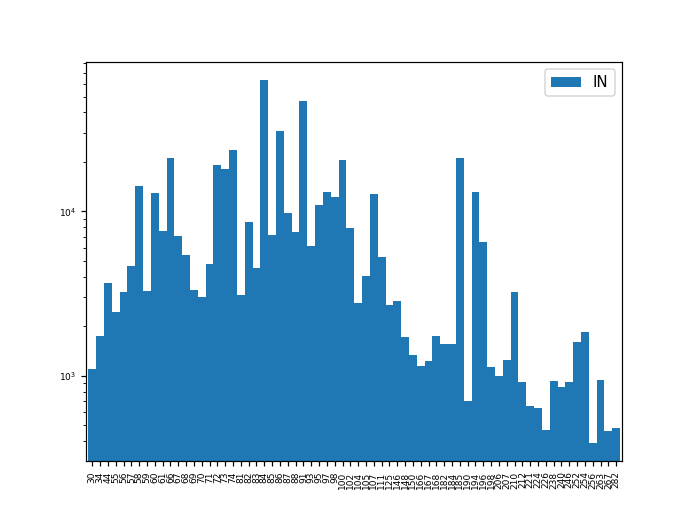

In [50]:

df_1 = df_in[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_1 = df_1.sort_index()

df_new = pd.DataFrame({'IN': df_1}, index = df_1.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 6)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_in.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


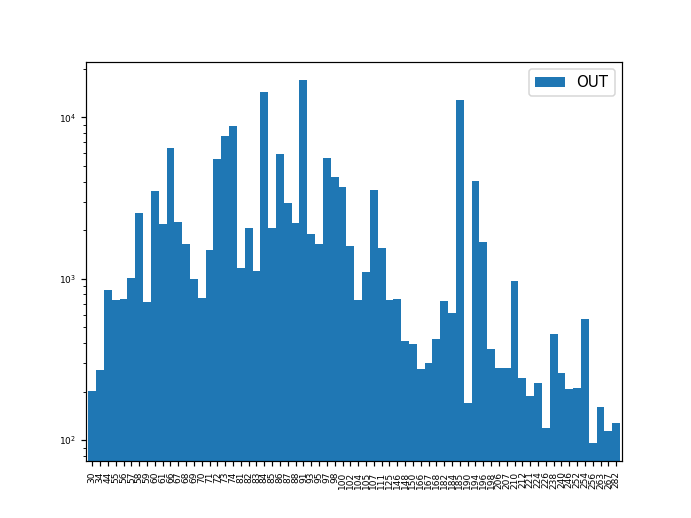

In [51]:
df_1 = df_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_1 = df_1.sort_index()

df_new = pd.DataFrame({'OUT': df_1}, index = df_1.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 6)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_out.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


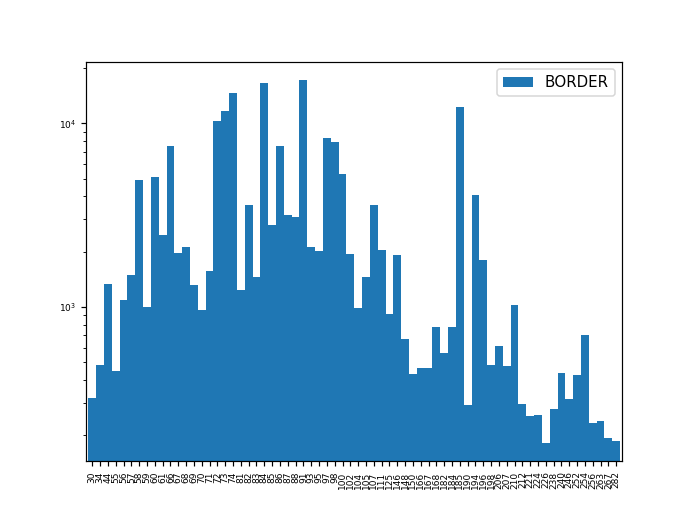

In [52]:
df_1 = df_in_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_1 = df_1.sort_index()

df_new = pd.DataFrame({'BORDER': df_1}, index = df_1.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 6)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_in_out.png',bbox_inches='tight')

In [92]:
in_out_2

1    158   -0.008261
     155   -0.008154
     145   -0.007327
208  1     -0.007078
267  1     -0.007077
1    149   -0.006940
552  1     -0.006720
246  1     -0.006241
1    107   -0.006166
     116   -0.006094
276  1     -0.005813
1    30    -0.005682
     134   -0.005669
     83    -0.005393
     85    -0.005357
     104   -0.005335
     78    -0.005123
     150   -0.005014
479  1     -0.004998
1    162   -0.004571
dtype: float64

<IPython.core.display.Javascript object>


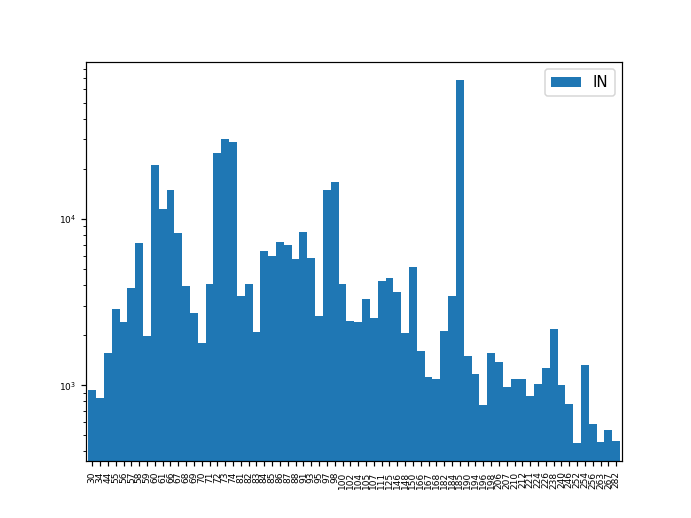

In [53]:
df_1 = df_unlabelled[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_1 = df_1.sort_index()

df_new = pd.DataFrame({'IN': df_1}, index = df_1.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 6)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_unlabelled.png',bbox_inches='tight')

In [83]:
immune_labels_imp = [int(x) for x in immune_labels_imp]

<IPython.core.display.Javascript object>


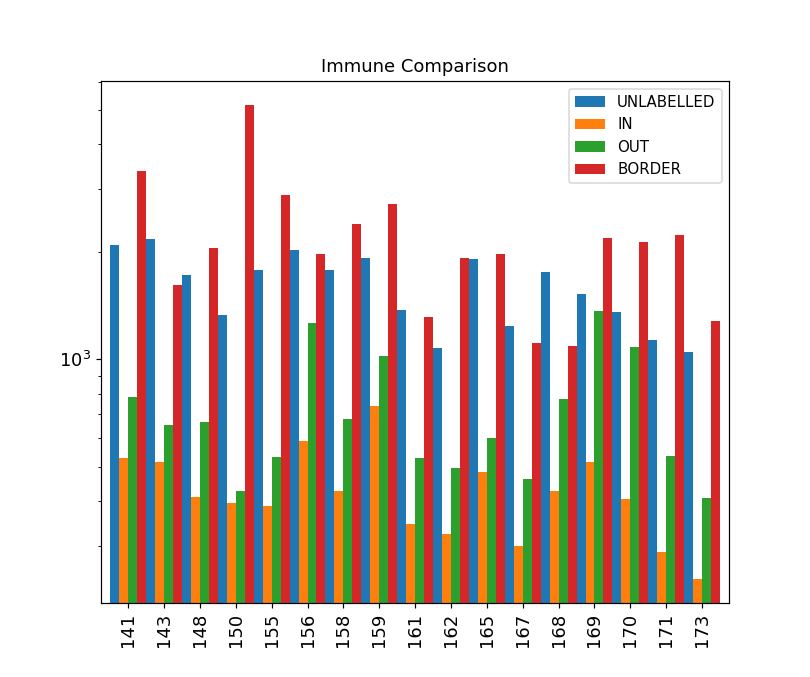

In [85]:
df_0 = df_in[immune_labels_imp].sum(axis = 0)
df_1 = df_out[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df_in_out[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df_unlabelled[immune_labels_imp].sum(axis =0)#.plot.bar(rot = 45)
df_0 = df_0.sort_index()
df_1 = df_1.sort_index()
df_2 = df_2.sort_index()
df_3 = df_3.sort_index()
df_new = pd.DataFrame({'UNLABELLED':df_0,'IN': df_1,'OUT': df_2,'BORDER':df_3}, index = df_0.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 12,title = 'Immune Comparison')
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('immune_comparison_comparison_all.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


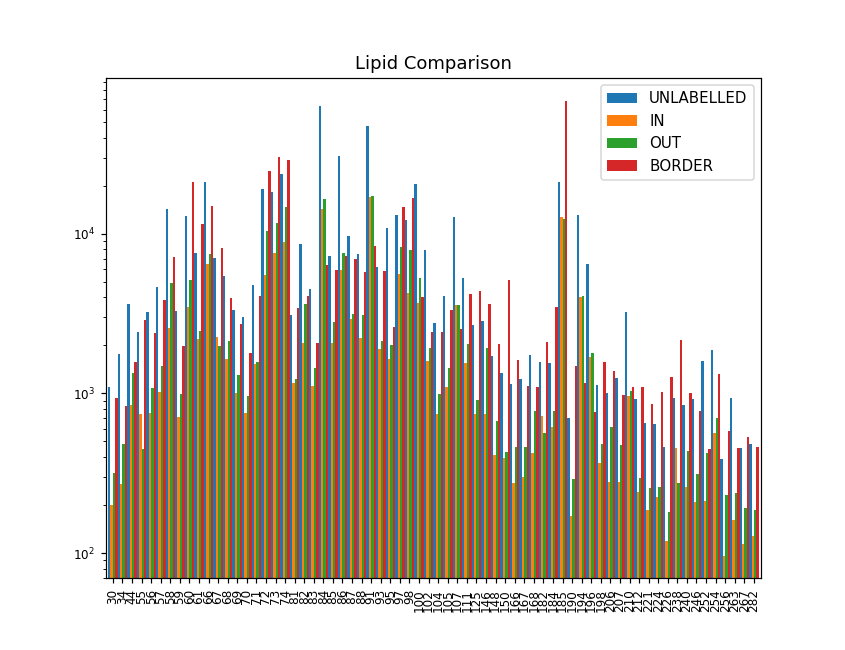

In [82]:

df_0 = df_in[lipid_list].sum(axis = 0)
df_1 = df_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df_in_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df_unlabelled[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_0 = df_0.sort_index()
df_1 = df_1.sort_index()
df_2 = df_2.sort_index()
df_3 = df_3.sort_index()
df_new = pd.DataFrame({'UNLABELLED':df_0,'IN': df_1,'OUT': df_2,'BORDER':df_3}, index = df_0.index)
ax = df_new.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 8,title = 'Lipid Comparison')
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_all.png',bbox_inches='tight')

In [ ]:

df_0 = df[lipid_list].sum(axis = 0)
df_1 = df1[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_2 = df2[lipid_list].sum(axis =0)#.plot.bar(rot = 45)
df_3 = df3[lipid_list].sum(axis =0)#.plot.bar(rot = 45)

df_new = pd.DataFrame({"BORDER":df_3}, index = lipid_list)
ax = df.plot.bar(rot = 90 ,width = 1,logy = True,fontsize = 10)
ax.grid(False)
# ax.set_xticks(np.arange(len(in_inter_out_1)))
# ax.set_xticklabels(in_inter_out_1)
2
# for xtick in ax.get_xticklabels():
#     tick_text = xtick.get_text()
#     if tick_text in immune_labels:
#         xtick.set_color('red')
plt.legend( prop={'size': 10})

plt.gca().patch.set_facecolor('white')
plt.savefig('ilipid_comparison_border',bbox_inches='tight')

In [ ]:
df1 = df_out[out_inter_in_out_1].sum(axis =0)#.plot.bar(rot = 45)
df2 = df_in_out[out_inter_in_out_1].sum(axis =0)#.plot.bar(rot = 45)
df = pd.DataFrame({'OUT': df1,'IN OUT': df2}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT VS IN OUT INTERSECTION TOP',logy = True)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('OUT_INTER_IN_OUT_1.svg',bbox_inches='tight')


In [ ]:
df1 = df_in[in_inter_out_2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df_out[in_inter_out_2].sum(axis =0)#.plot.bar(rot = 45)
df = pd.DataFrame({'IN': df1,
                   'OUT': df2}, index=df2.index)
ax = df.plot.bar(rot =90,title = 'IN VS OUT INTERSECTION BOTTOM',logy = True)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
plt.savefig('IN_INTER_OUT_2.svg',bbox_inches='tight')

In [ ]:
%matplotlib notebook
df1 = df_in[in_inter_in_out_2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df_in_out[in_inter_in_out_2].sum(axis =0)#.plot.bar(rot = 45)
df = pd.DataFrame({'IN': df1,
                   'IN OUT': df2}, index=df2.index)
ax = df.plot.bar(rot = 90,title = 'IN VS IN OUT INTERSECTION BOTTOM', logy = True)#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')

plt.savefig('IN_INTER_IN_OUT_2.svg',bbox_inches='tight')

In [ ]:
df1 = df_out[out_inter_in_out_2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df_in_out[out_inter_in_out_2].sum(axis =0)#.plot.bar(rot = 45)
df = pd.DataFrame({'OUT': df1,
                   'IN OUT': df2}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT VS IN OUT INTERSECTION BOTTOM',logy = True)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

# Top Elements

In [ ]:
number_of_compounds = 20
in_1 = get_top_abs_correlations(in_corr,number_of_compounds)
in_2 = get_bottom_abs_correlations(in_corr,number_of_compounds)
out_1 = get_top_abs_correlations(out_corr,number_of_compounds)
out_2 = get_bottom_abs_correlations(out_corr,number_of_compounds)
in_out_1 = get_top_abs_correlations(in_out_corr,number_of_compounds)
in_out_2 = get_bottom_abs_correlations(in_out_corr,number_of_compounds)
in_1_compounds = convert_list(in_1) 
in_2_compounds = convert_list(in_2) 
out_1_compounds = convert_list(out_1) 
out_2_compounds = convert_list(out_2) 
in_out_1_compounds = convert_list(in_out_1) 
in_out_2_compounds = convert_list(in_out_2) 

<IPython.core.display.Javascript object>


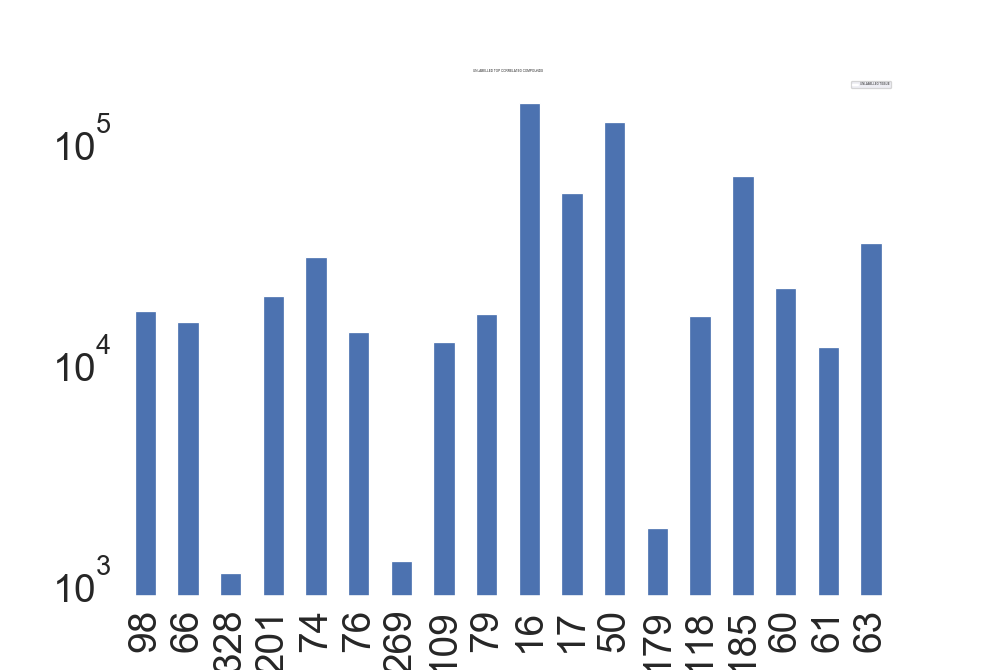

In [162]:
%matplotlib notebook
df1 = df_unlabelled[unlabelled_1_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'UNLABELLED TISSUE': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'UNLABELLED TOP CORRELATED COMPOUNDS', logy = True, fontsize = 30)#,width = 1 )#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('UNLABELLED_TOP.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


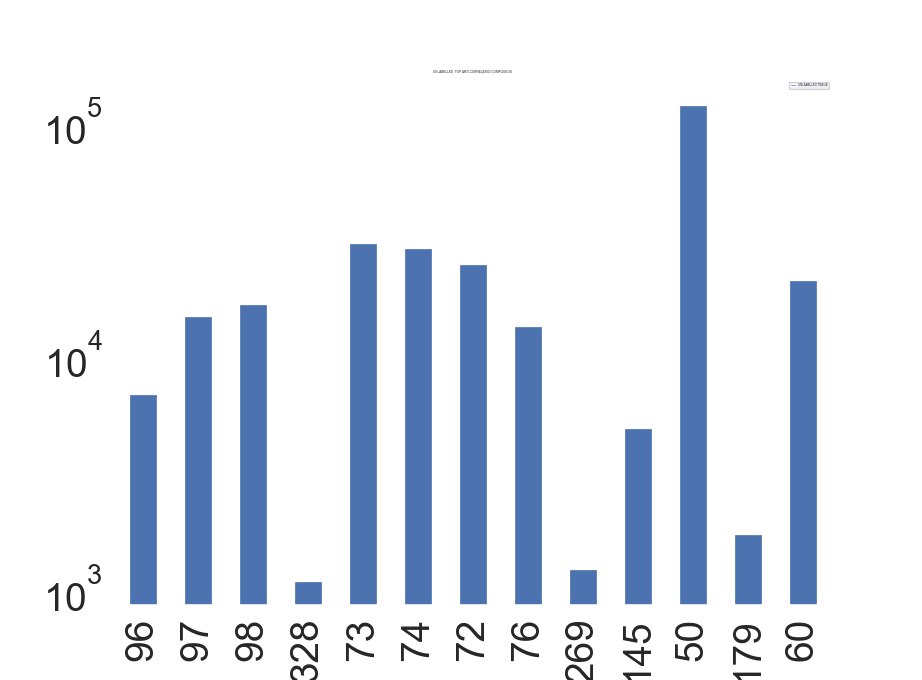

In [163]:
%matplotlib notebook
df1 = df_unlabelled[unlabelled_2_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'UNLABELLED TISSUE': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'UNLABELLED  TOP ANTI-CORRELATED COMPOUNDS', logy = True, fontsize = 30)#,width = 1 )#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('UNLABELLED_BOTTOM.png',bbox_inches='tight')

In [ ]:
%matplotlib notebook
df1 = df_in_out[lipid_list].sum(axis =0)#.plot.bar(rot = 45)

#df = pd.DataFrame({'In Out Germinal':df_in_out[lipid_list].sum(axis =0)}, index=df1.index)
df = pd.DataFrame({'In Germinal': df_in[lipid_list].sum(axis =0), 'Out Germinal' : df_out[lipid_list].sum(axis =0), 'In Out Germinal':df_in_out[lipid_list].sum(axis =0)}, index=df1.index)

ax = df.plot.bar(rot = 90,title = 'In Out Germinal', logy = True, fontsize = 30)#,width = 1 )#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('lipid_1233.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


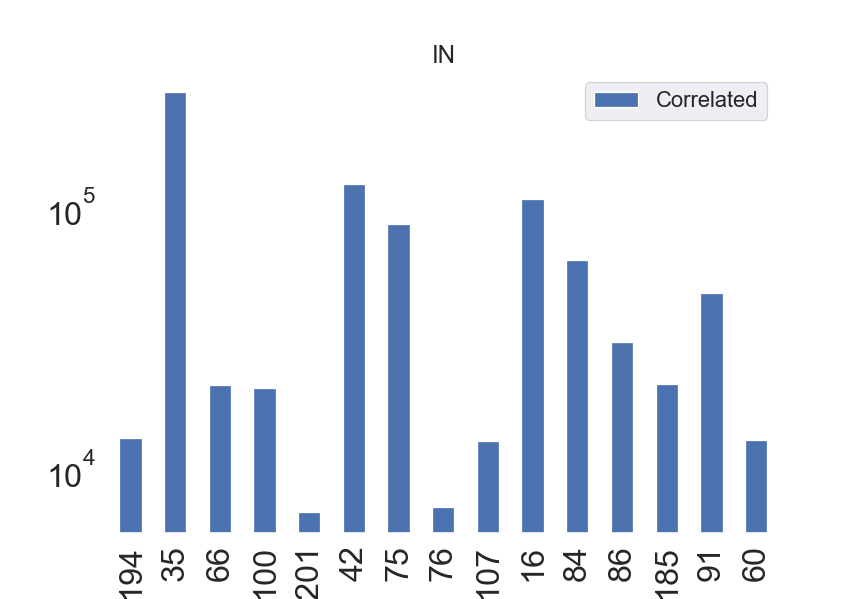

In [229]:
%matplotlib notebook
df1 = df_in_sorted[in_1_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'Correlated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN', logy = True, fontsize = 25)#,width = 1 )#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('IN_1.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


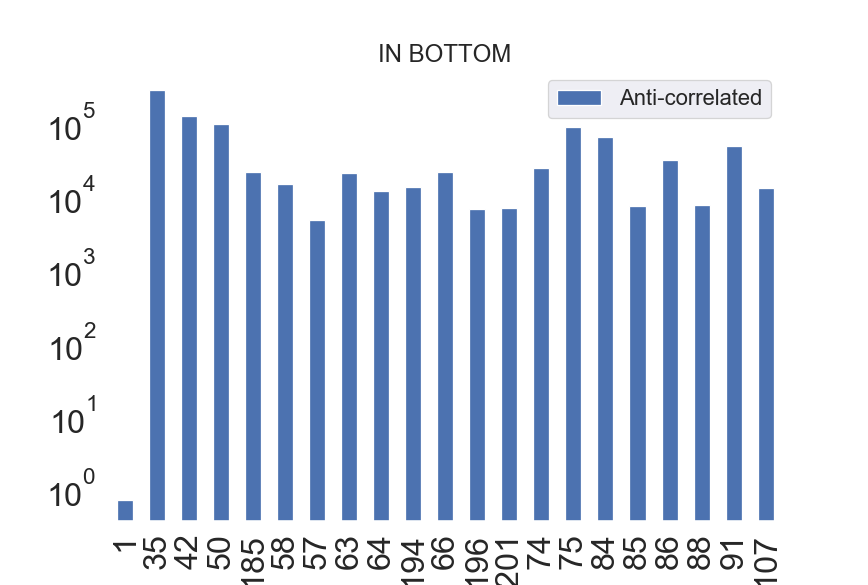

In [228]:
%matplotlib notebook
df1 = df_in_sorted[in_2_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'Anti-correlated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN BOTTOM', logy = True, fontsize = 25 )#,width = 1,fontsize =8)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('IN_2.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


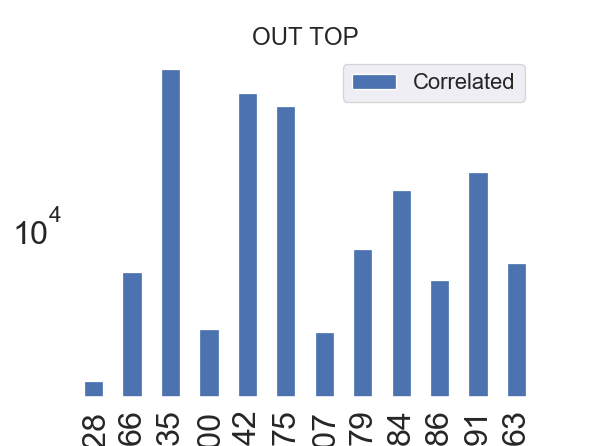

In [232]:
%matplotlib notebook
df1 = df_out_sorted[out_1_compounds].sum(axis =0)#.plot.bar(rot = 45

df = pd.DataFrame({'Correlated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT TOP', logy = True, fontsize = 25)#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('OUT_1.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


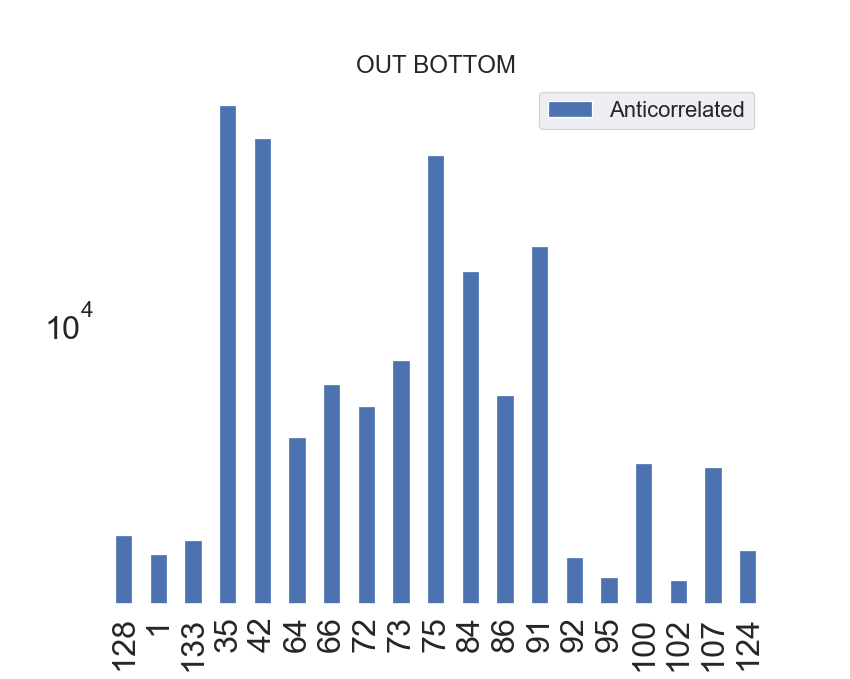

In [234]:
%matplotlib notebook
df1 = df_out[out_2_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'Anticorrelated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT BOTTOM', logy = True, fontsize = 25 )#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')

plt.gca().patch.set_facecolor('white')
plt.savefig('OUT_2.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


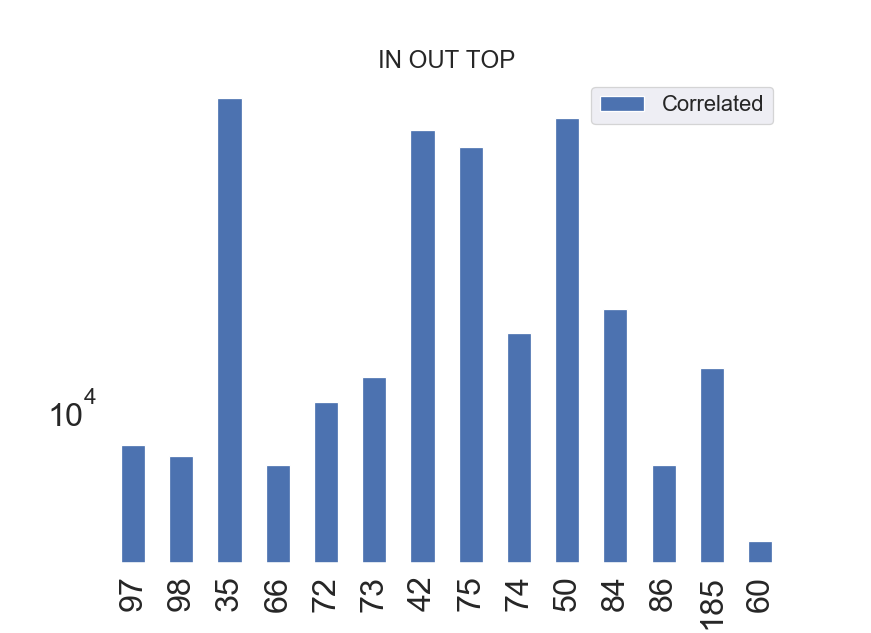

In [235]:
%matplotlib notebook
df1 = df_in_out[in_out_1_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'Correlated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN OUT TOP', logy = True, fontsize = 25)#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('IN_OUT_1.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


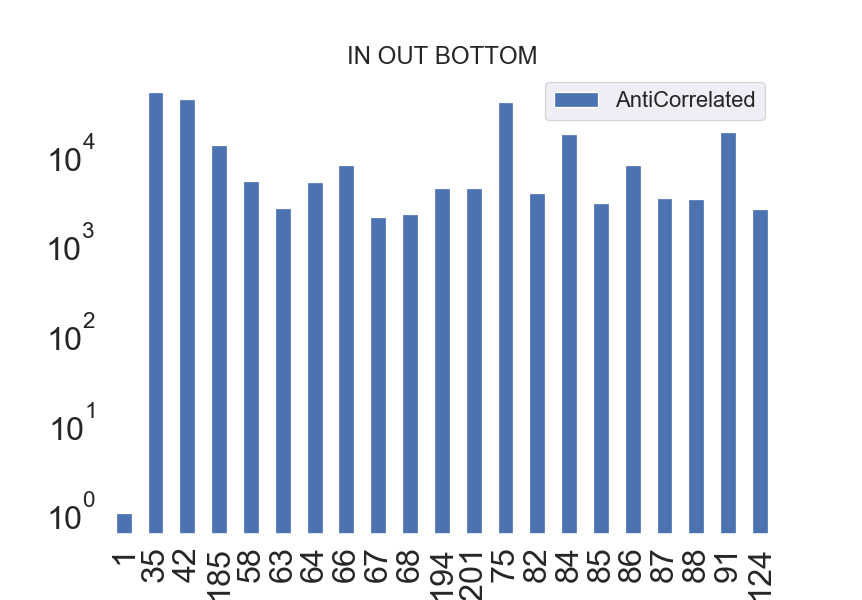

In [236]:
%matplotlib notebook
df1 = df_in_out[in_out_2_compounds].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'AntiCorrelated': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN OUT BOTTOM', logy = True, fontsize = 25 )#,width = 1,fontsize =8)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('IN_OUT_2.png',bbox_inches='tight')

In [ ]:
%matplotlib notebook
df1 = df_unlabelled.sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'Unlabelled': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'Unlabelled Tissue', logy = True)#,width = 1 )#,width = 1,fontsize =8)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('UNlabelled.png',bbox_inches='tight')

## Immune Labels and Metabolites

In [217]:
immune_labels = [int(x) for x in immune_labels]

<IPython.core.display.Javascript object>


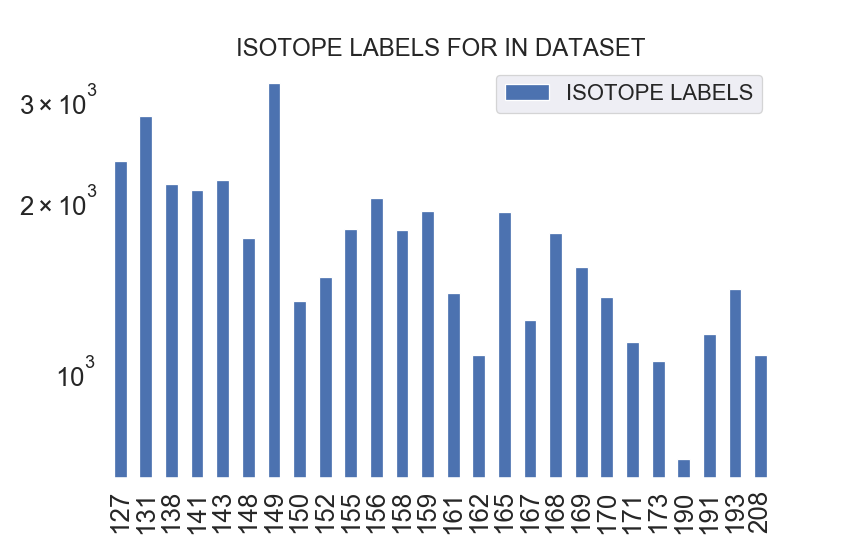

In [222]:
%matplotlib notebook
df1 = df_in_sorted[immune_labels].sum(axis = 0)#.plot.bar(rot = 45)

df = pd.DataFrame({'ISOTOPE LABELS': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'ISOTOPE LABELS FOR IN DATASET',fontsize = 20, logy = True)#,width = 1,fontsize =8)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')



plt.gca().patch.set_facecolor('white')
plt.savefig('immune_in.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


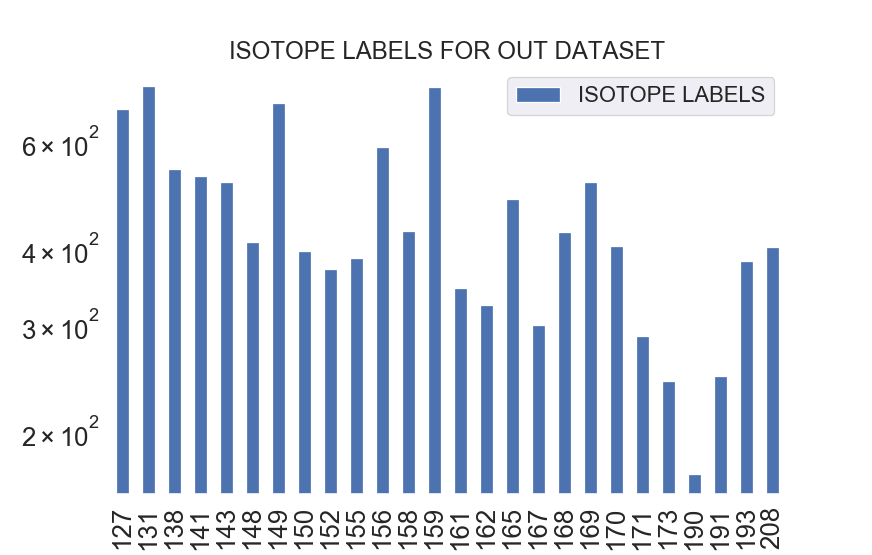

In [223]:
%matplotlib notebook
df1 = df_out_sorted[immune_labels].sum(axis = 0)#.plot.bar(rot = 45)

df = pd.DataFrame({'ISOTOPE LABELS': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'ISOTOPE LABELS FOR OUT DATASET',fontsize = 20, logy= True)#,width = 1,fontsize =8)
ax.grid(False)
for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('immune_out.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


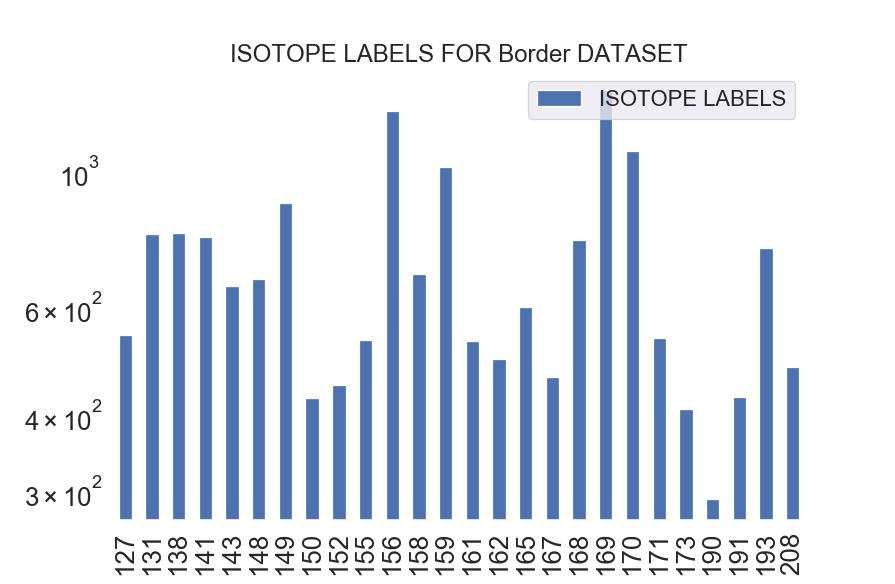

In [225]:
%matplotlib notebook
df1 = df_in_out_sorted[immune_labels].sum(axis = 0)#.plot.bar(rot = 45)

df = pd.DataFrame({'ISOTOPE LABELS': df1}, index=df1.index)
ax = df.plot.bar(rot = 90,title = 'ISOTOPE LABELS FOR Border DATASET',fontsize = 20, logy = True)#,width = 1,fontsize =8)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels:
        xtick.set_color('red')


plt.gca().patch.set_facecolor('white')
plt.savefig('immune_in_out.png',bbox_inches='tight')

In [ ]:
# df_in.columns = df_in.columns.astype(str)
# df_out.columns = df_out.columns.astype(str)
# in_inter_out_1 = list(in_inter_out_1)


In [ ]:
in_inter_out_1
in_inter_out_1 = [item for sublist in in_inter_out_1 for item in sublist]

In [ ]:
con_1 = list(set(list(in_1_compounds) + list(in_2_compounds) + list(immune_labels_in)))
con_2 = list(set(list(out_1_compounds) + list(out_2_compounds) + list(immune_out)))
con_3 = list(set(list(in_out_1_compounds) + list(in_out_2_compounds) + list(immune_in_out)))

# Heatmaps 

In [ ]:
%matplotlib notebook
sns.set(font_scale=0.3)
# fig = plt.figure()

g = sns.clustermap(df_in[con_1].corr(),cmap = 'jet')#, xticklabels = labels, yticklabels = labels, square = True )
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
    
plt.savefig('clustermap_in_germinal_slices_immune_labels.svg',format='svg', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale=1)
# fig = plt.figure()

g = sns.clustermap(df_in.corr(),cmap = 'jet')#, xticklabels = labels, yticklabels = labels, square = True )
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
    
plt.savefig('clustermap_in_germinal_heatmap.png',format='png', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale=1)
# fig = plt.figure()

g = sns.clustermap(df_in_out[con_3].corr(),cmap = 'jet')#, xticklabels = labels, yticklabels = labels, square = True )
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
    
plt.savefig('clustermap_in_out_germinal_slices_immune_labels.svg',format='svg', dpi=1200)

In [ ]:
os.chdir(results_store_path)

In [ ]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

g = sns.clustermap(df_in.corr(),cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
        
    
plt.savefig('clustermap_in_germinal_slices_immune_labels_all_6.jpg',format='jpg', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale=0.4)
# fig = plt.figure()

g = sns.clustermap(out_corr,cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
    
plt.savefig('clustermap_out_germinal_slices_immune_labels_all.svg',format='svg', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale=0.4)
# fig = plt.figure()

g = sns.clustermap(in_out_corr,cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
        
plt.savefig('clustermap_in_out_germinal_slices_immune_labels_all.svg',format='svg', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale=0.4)
# fig = plt.figure()

g = sns.clustermap(unlabelled_corr,cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
    
plt.savefig('clustermap_unlabelled_germinal_slices_immune_labels_all.svg',format='svg', dpi=1200)

## Maldi path

In [125]:
maldi_path = r'C:\Users\sganesh44\Documents\3D TOFSIMS'
os.chdir(maldi_path)

## Loading of MALDI INFORMATION

In [126]:
maldi_mass = np.load('masslist.npy')
maldi_matrix = np.load('matrixvalues.npy')
coord = np.load('matrixcoord.npy')

In [127]:
maldi_mass = [str(x) for x in maldi_mass]

In [128]:
np.shape(maldi_matrix)

(1478, 1813)

In [129]:
num_out_list = []
for i in df_in.columns:
    num_out_list.append(i)
y = num_out_list 
# y.remove('E')
# y.remove('Frag')
# y.remove('chain')
# y.remove('frag')
# y.remove('fragment-R-CO-H')
# y.remove('head')
# y.remove('168Er-')

In [130]:
y = [float(x) for x in y]
y.sort()

In [131]:
maldi_mass = [float(x) for x in maldi_mass]
np.shape(maldi_mass)

(1478,)

In [132]:
from bisect import bisect_left

def take_closest(myList, myNumber):
    pos = bisect_left(myList, myNumber)
    if pos == 0:
        return myList[0]
    if pos == len(myList):
        return myList[-1]
    before = myList[pos - 1]
    after = myList[pos]
    if after - myNumber < myNumber - before:
       return after
    else:
       return before
    return lst[min(range(len(lst)), key = lambda i: abs(lst[i]-K))] 

In [133]:
j2 = [i for i in y if i >= 200]

In [134]:
closest_list = []
for i in j2:
    closest_value = take_closest(maldi_mass,i)
    print(closest_value)
    closest_list.append(closest_value)

202.0
207.63416339977525
208.72502212582478
215.10960875739815
216.8070326620827
224.0250133139982
224.31867843209184
227.27658553365134
229.07001871168757
237.93980483465958
241.39334088362602
243.2981689831911
245.2180280279994
264.5757860571051
274.82038571637946
276.2642242974024
282.85594663264874
284.34200207047735
295.35196644000536
300.42488444699904
308.8043046862713
313.6970653976371
316.5868975307254
332.7454451837604
333.1816274163135
338.01753438839455
343.37315568936214
359.012705649695
361.8456648660477
363.74671281759476
370.4793783230674
380.8127513612818
384.8246552265157
397.1157476828129
404.9962455753513
413.5745547386238
430.7155113472567
436.967056969564
452.6991662909378
459.2697898619254
468.99767818145756
475.1819673035415
480.18806115018873
498.12837577200855
500.0898723855555
502.0590928493229
514.0383281063127
520.8165314721984
529.7619926881541
545.2518725683283
553.8909585506668
561.1946659870611
570.8336555655945
586.7552896722657
593.7140769756646
611.0

In [135]:
mat = np.zeros((54,54))
mat_ravel = []
for j in range(len(maldi_matrix)):
    for i in range(len(coord)):
        mat[coord[i][0],coord[i][1]] = maldi_matrix[j,:][i]
    mat_ravel.append(mat[:15,30:].ravel())
mat_ravel = np.array(mat_ravel) 
    

In [136]:
np.shape(closest_list)

(58,)

In [137]:
from bisect import bisect_left

def take_closest(myList, myNumber):
    pos = bisect_left(myList, myNumber)
    if pos == 0:
        return myList[0]
    if pos == len(myList):
        return myList[-1]
    before = myList[pos - 1]
    after = myList[pos]
    if after - myNumber < myNumber - before:
       return after
    else:
       return before
    return lst[min(range(len(lst)), key = lambda i: abs(lst[i]-K))] 

closest_list = []
for i in j2:
    closest_value = take_closest(maldi_mass,i)
    print(closest_value)
    closest_list.append(closest_value)
    



202.0
207.63416339977525
208.72502212582478
215.10960875739815
216.8070326620827
224.0250133139982
224.31867843209184
227.27658553365134
229.07001871168757
237.93980483465958
241.39334088362602
243.2981689831911
245.2180280279994
264.5757860571051
274.82038571637946
276.2642242974024
282.85594663264874
284.34200207047735
295.35196644000536
300.42488444699904
308.8043046862713
313.6970653976371
316.5868975307254
332.7454451837604
333.1816274163135
338.01753438839455
343.37315568936214
359.012705649695
361.8456648660477
363.74671281759476
370.4793783230674
380.8127513612818
384.8246552265157
397.1157476828129
404.9962455753513
413.5745547386238
430.7155113472567
436.967056969564
452.6991662909378
459.2697898619254
468.99767818145756
475.1819673035415
480.18806115018873
498.12837577200855
500.0898723855555
502.0590928493229
514.0383281063127
520.8165314721984
529.7619926881541
545.2518725683283
553.8909585506668
561.1946659870611
570.8336555655945
586.7552896722657
593.7140769756646
611.0

In [138]:
bar_list = []
for i in range(len(closest_list)):
    m_index = maldi_mass.index(closest_list[i])
    bar_list.append(mat_ravel.sum(axis = 1)[m_index])  

# Maldi Dataframe

In [155]:
df2 = pd.DataFrame(bar_list)

In [140]:
df3 = df2.transpose()

In [141]:
df3 = df3.set_axis(closest_list, axis=1, inplace=False)

In [142]:
df3

,202.000000,207.634163,208.725022,215.109609,216.807033,224.025013,224.318678,227.276586,229.070019,237.939805,...,529.761993,545.251873,553.890959,561.194666,570.833656,586.755290,593.714077,611.073872,624.017154,687.538531
0,0.0,0.0,71708.020042,0.0,0.0,0.0,0.0,0.0,0.0,127033.243141,...,5713.003723,515.387939,58857.80899,0.0,0.0,0.0,0.0,1.547225e+07,14276.953796,0.0


In [108]:
# Defining Mass Numbers in Datasets

In [143]:
j2 = [str(x) for x in j2]

In [110]:
closest_list

[202.0,
 207.63416339977525,
 208.72502212582478,
 215.10960875739815,
 216.8070326620827,
 224.0250133139982,
 224.31867843209184,
 227.27658553365134,
 229.07001871168757,
 237.93980483465958,
 241.39334088362602,
 243.2981689831911,
 245.2180280279994,
 264.5757860571051,
 274.82038571637946,
 276.2642242974024,
 282.85594663264874,
 284.34200207047735,
 295.35196644000536,
 300.42488444699904,
 308.8043046862713,
 313.6970653976371,
 316.5868975307254,
 332.7454451837604,
 333.1816274163135,
 338.01753438839455,
 343.37315568936214,
 359.012705649695,
 361.8456648660477,
 363.74671281759476,
 370.4793783230674,
 380.8127513612818,
 384.8246552265157,
 397.1157476828129,
 404.9962455753513,
 413.5745547386238,
 430.7155113472567,
 436.967056969564,
 452.6991662909378,
 459.2697898619254,
 468.99767818145756,
 475.1819673035415,
 480.18806115018873,
 498.12837577200855,
 500.0898723855555,
 502.0590928493229,
 514.0383281063127,
 520.8165314721984,
 529.7619926881541,
 545.2518725683

In [111]:
df_in.columns = [str(x) for x in df_in.columns]

<IPython.core.display.Javascript object>


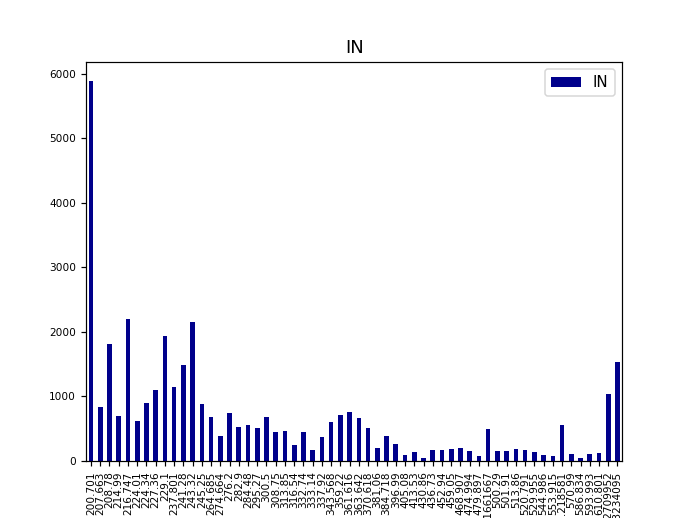

In [112]:
%matplotlib notebook
df1 = df_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3
df = pd.DataFrame({'IN': df1},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN',fontsize = 7,color = 'darkblue')
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
plt.savefig('in_bar_maldi.png',bbox_inches='tight')

In [113]:
df_out_sorted_in.columns = [str(x) for x in df_out_sorted_in.columns]

In [67]:
df_out_sorted_in.columns = [str(x) for x in df_out_sorted_in.columns]

In [114]:
df_out_sorted_in[j2].sum(axis=0)

200.701          133.140000
207.663          230.613333
208.78           298.893333
214.99          3205.380000
216.747          121.440000
224.01          2384.933333
224.34           249.973333
227.36           549.746667
229.1            169.840000
237.801          750.993333
241.28           123.160000
243.32           256.613333
245.25           240.853333
264.685          558.933333
274.664          283.093333
276.2            248.120000
282.9            313.940000
284.48           207.940000
295.27           141.346667
300.5             85.100000
308.75           219.293333
313.85           102.766667
316.54           117.373333
332.74           147.600000
333.14            88.820000
337.92            91.386667
343.568           52.266667
359.22            37.133333
361.616           34.566667
363.642          241.986667
370.618        11859.073333
381.06           201.540000
384.718           47.066667
396.99            46.033333
405.08            21.646667
413.53            30

<IPython.core.display.Javascript object>


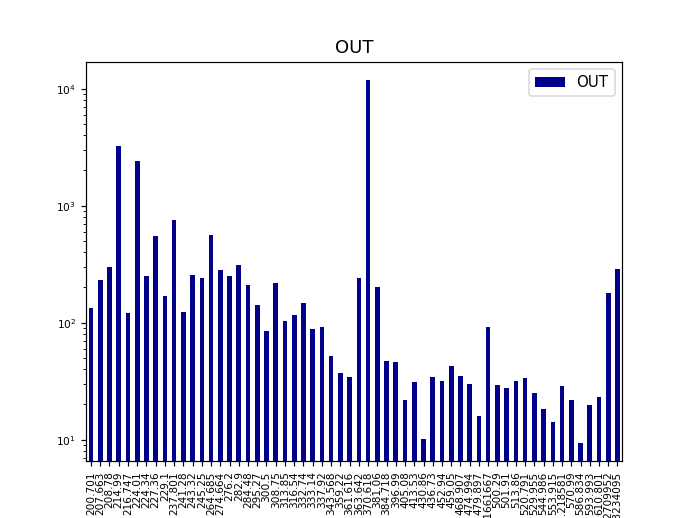

In [116]:
df1 = df_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3.transpose().sum(axis =1)
df = pd.DataFrame({'OUT': df1},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT',logy = True,color = 'darkblue',fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
plt.savefig('out_maldi.png',bbox_inches='tight')

<IPython.core.display.Javascript object>


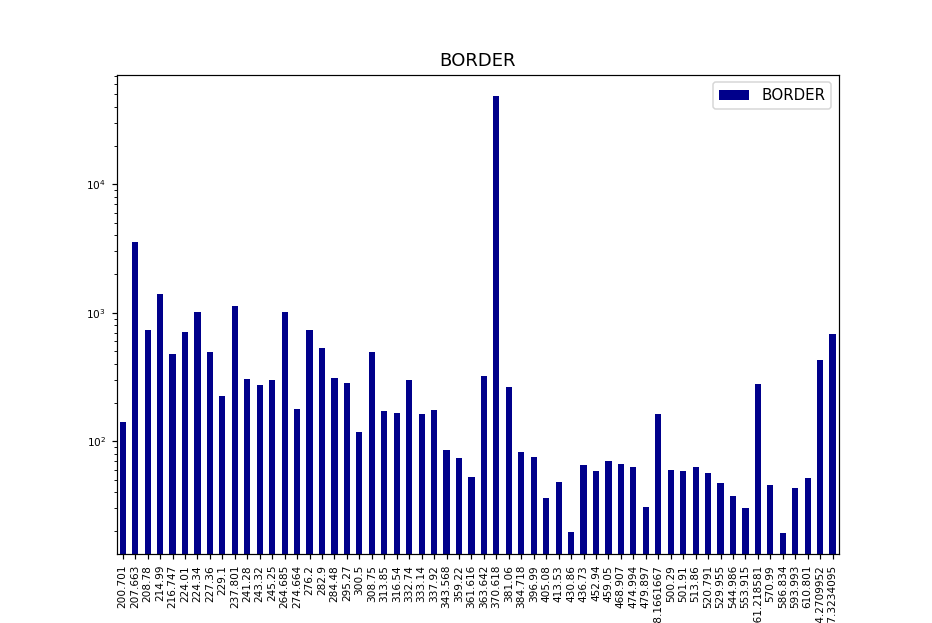

In [117]:
df1 = df_in_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3.transpose().sum(axis =1)
df = pd.DataFrame({'BORDER': df1},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'BORDER',logy = True,color = 'darkblue',fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
plt.savefig('border_maldi.png',bbox_inches='tight')
# plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

<IPython.core.display.Javascript object>


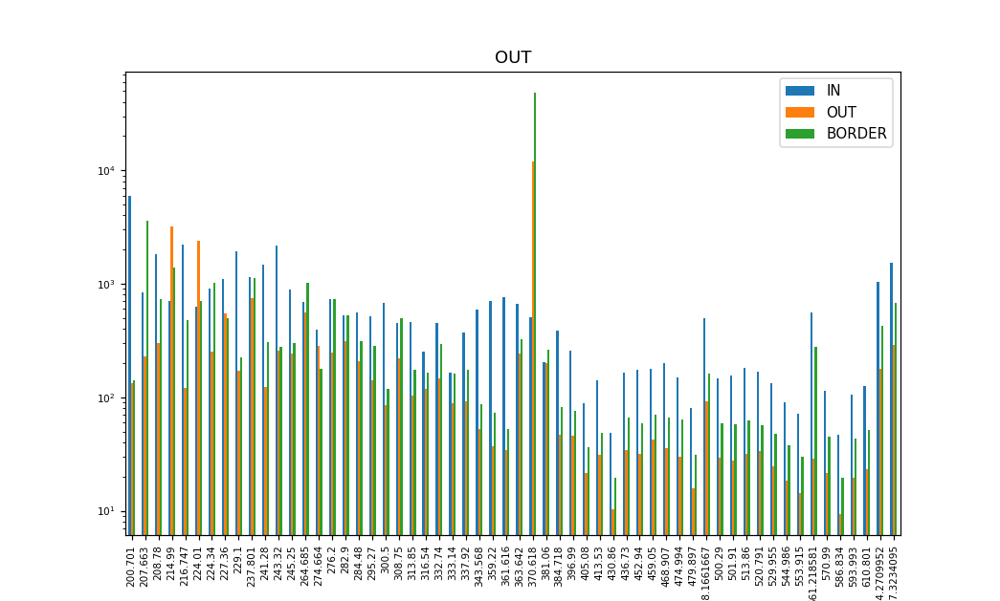

In [119]:
df1 = df_in_sorted[j2].sum(axis =0)#.plot.bar(rot = 45)

df2 = df_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)

df3 = df_in_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)

df = pd.DataFrame({'IN': df1, 'OUT': df2, 'BORDER' :df3},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT',logy = True,fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
# plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

In [121]:
j2 = [str(x) for x in j2]

In [145]:
df3= df3.set_axis(j2,axis =1,inplace=False)

In [84]:
df3= df3.set_axis(closest_list, axis=1, inplace=False)

<IPython.core.display.Javascript object>


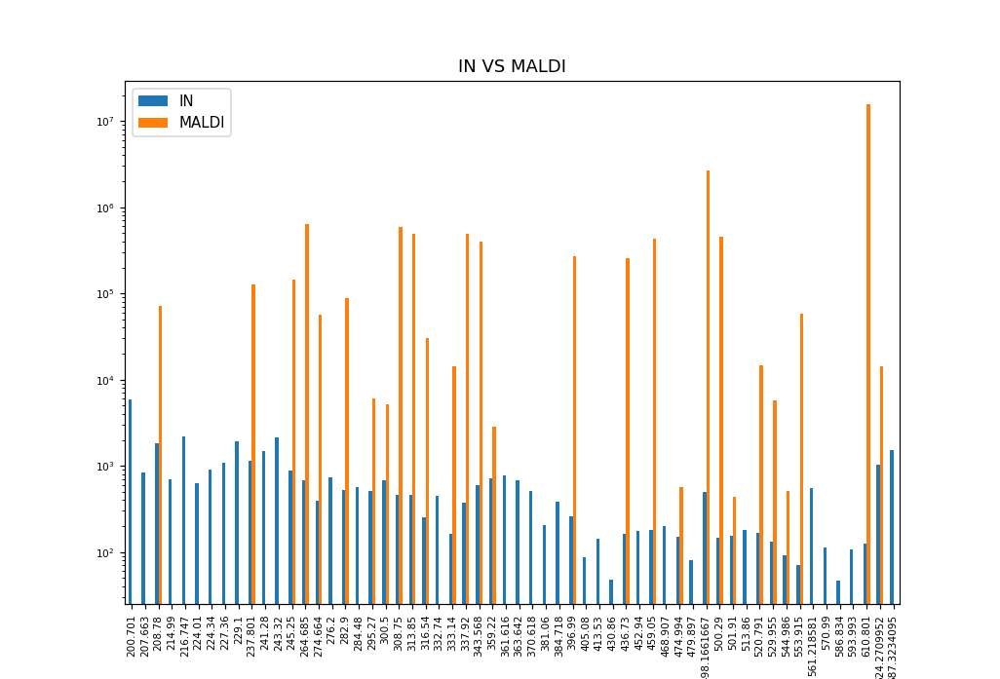

In [146]:
df1 = df_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3.transpose().sum(axis = 1)
df = pd.DataFrame({'IN': df1,
                   'MALDI': df2},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'IN VS MALDI',logy = True,fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
# plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

<IPython.core.display.Javascript object>


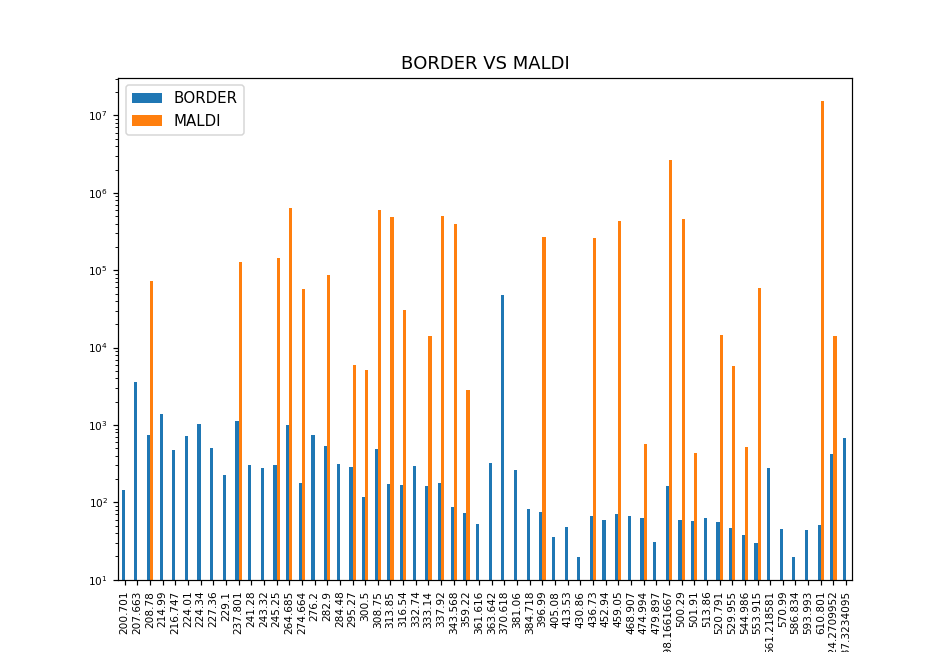

In [150]:
df1 = df_in_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3.transpose().sum(axis = 1)
df = pd.DataFrame({'BORDER': df1,
                   'MALDI': df2},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'BORDER VS MALDI',logy = True,fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
# plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

<IPython.core.display.Javascript object>


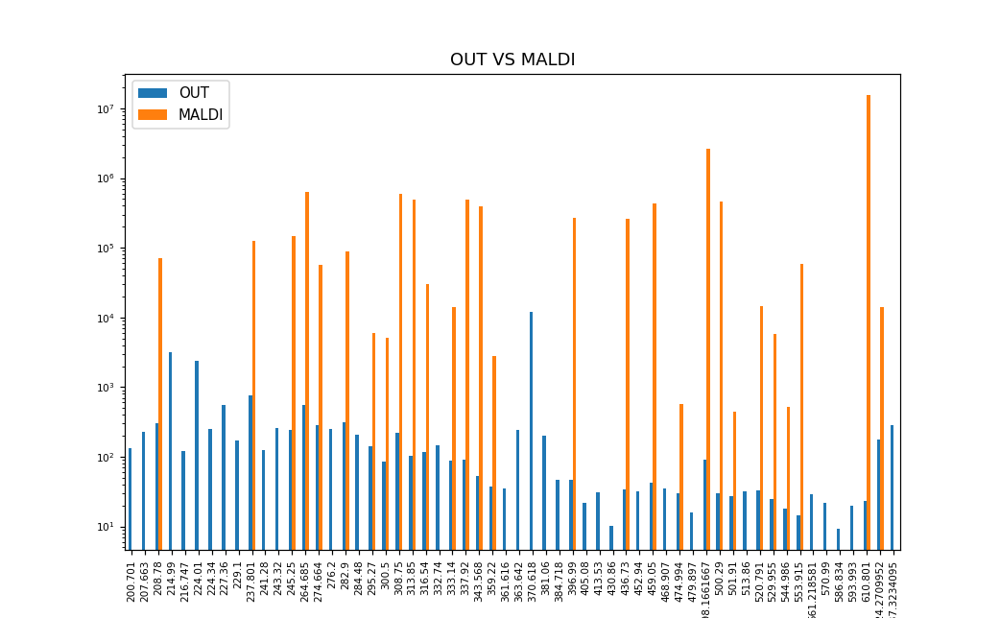

In [151]:
df1 = df_out_sorted_in[j2].sum(axis =0)#.plot.bar(rot = 45)
df2 = df3.transpose().sum(axis = 1)
df = pd.DataFrame({'OUT': df1,
                   'MALDI': df2},index=df1.index)
ax = df.plot.bar(rot = 90,title = 'OUT VS MALDI',logy = True,fontsize = 7)
ax.grid(False)

for xtick in ax.get_xticklabels():
    tick_text = xtick.get_text()
    if tick_text in immune_labels_in:
        xtick.set_color('red')
    if tick_text in immune_out:
        xtick.set_color('red')
    if tick_text in immune_in_out:
        xtick.set_color('red')
        
plt.gca().patch.set_facecolor('white')
# plt.savefig('OUT_INTER_IN_OUT_2.svg',bbox_inches='tight')

In [154]:
df2

200.701        0.000000e+00
207.663        0.000000e+00
208.78         7.170802e+04
214.99         0.000000e+00
216.747        0.000000e+00
224.01         0.000000e+00
224.34         0.000000e+00
227.36         0.000000e+00
229.1          0.000000e+00
237.801        1.270332e+05
241.28         0.000000e+00
243.32         0.000000e+00
245.25         1.454982e+05
264.685        6.300957e+05
274.664        5.639152e+04
276.2          0.000000e+00
282.9          8.777182e+04
284.48         0.000000e+00
295.27         5.990254e+03
300.5          5.161258e+03
308.75         5.918038e+05
313.85         4.936838e+05
316.54         3.015996e+04
332.74         0.000000e+00
333.14         1.416395e+04
337.92         4.962903e+05
343.568        3.960480e+05
359.22         2.826520e+03
361.616        0.000000e+00
363.642        0.000000e+00
370.618        0.000000e+00
381.06         0.000000e+00
384.718        0.000000e+00
396.99         2.709907e+05
405.08         0.000000e+00
413.53         0.000

In [168]:
maldi_df = pd.DataFrame(maldi_matrix.transpose(),columns = maldi_mass)

In [169]:

maldi_df

,202.000000,202.264793,202.529934,202.795422,203.061258,203.327443,203.593976,203.860859,204.128092,204.395675,...,1382.084260,1383.895978,1385.710069,1387.526539,1389.345391,1391.166626,1392.990249,1394.816262,1396.644669,1398.475473
0,0.0,0.0,0.0,0.0,678.320557,678.320557,678.320557,678.320557,0.0,0.0,...,318.316162,322.621765,996.017456,664.151276,0.000000,1111.485199,708.977722,0.000000,0.000000,399.335052
1,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,1636.868652,0.000000,1708.333191,600.186523,1193.994202,0.000000,1206.415466,1119.764465,0.000000,0.000000
2,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,652.812500,736.020020,0.000000,618.837402,0.000000,599.807495,0.000000,0.000000,614.795166,1215.115540
3,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,333.820068,337.920013,331.791779,0.000000,726.397217,0.000000,678.260956,317.981079,655.016022
4,0.0,0.0,0.0,0.0,324.798584,324.798584,324.798584,324.798584,0.0,0.0,...,778.033051,385.788696,421.411652,333.462616,340.716644,0.000000,0.000000,0.000000,685.490875,0.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1808,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,379.031433,802.252350,1211.906128,401.895874,1126.359100,1123.746521,476.946259,0.000000,0.000000,0.000000
1809,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,276.990021,0.000000,143.918503,0.000000,268.700912,134.238571,412.592606,125.557999
1810,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,0.000000,259.066315,0.000000,0.000000,550.497620,790.736633,561.531464,596.414032,0.000000
1811,0.0,0.0,0.0,0.0,0.000000,0.000000,0.000000,0.000000,0.0,0.0,...,0.000000,1132.646759,408.752136,0.000000,374.893036,748.716431,0.000000,757.515472,441.501282,0.000000


In [171]:
from sklearn.preprocessing import StandardScaler

def compute_sparse_correlation_matrix(A):
    scaler = StandardScaler(with_mean=False)
    scaled_A = scaler.fit_transform(A)  # Assuming A is a CSR or CSC matrix
    corr_matrix = (1/scaled_A.shape[0]) * (scaled_A.T @ scaled_A)
    return corr_matrix

In [183]:
in_list = []
for i in range(len(closest_list)):
    if closest_list[i] in maldi_mass:
        in_list.append(maldi_mass.index(closest_list[i]))
    

In [184]:
in_list

[0,
 21,
 25,
 48,
 54,
 79,
 80,
 90,
 96,
 125,
 136,
 142,
 148,
 206,
 235,
 239,
 257,
 261,
 290,
 303,
 324,
 336,
 343,
 381,
 382,
 393,
 405,
 439,
 445,
 449,
 463,
 484,
 492,
 516,
 531,
 547,
 578,
 589,
 616,
 627,
 643,
 653,
 661,
 689,
 692,
 695,
 713,
 723,
 736,
 758,
 770,
 780,
 793,
 814,
 823,
 845,
 861,
 935]

In [189]:
coor_maldi = compute_sparse_correlation_matrix(maldi_matrix[in_list,:].transpose())

In [190]:
np.shape(coor_maldi)

(58, 58)

In [84]:
os.chdir(results_store_path)

<IPython.core.display.Javascript object>


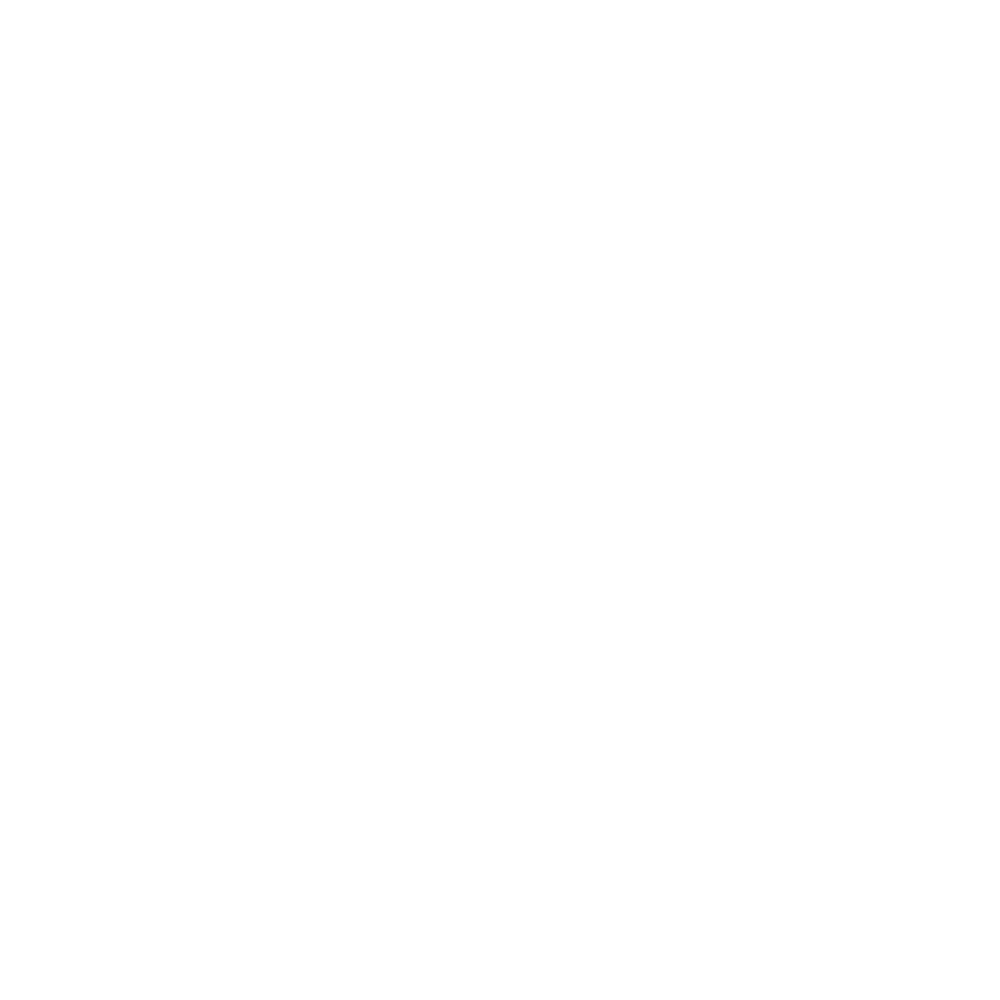

In [120]:
%matplotlib notebook
sns.set(font_scale= 0.28)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(unlabelled_corr, dtype=np.bool)))

# cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

# g = sns.clustermap(in_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# # mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
# mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(unlabelled_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')

plt.savefig('clustermap_unlabelled_germinal_slices_suppressed_5.svg',format='svg', dpi=1200)

<IPython.core.display.Javascript object>


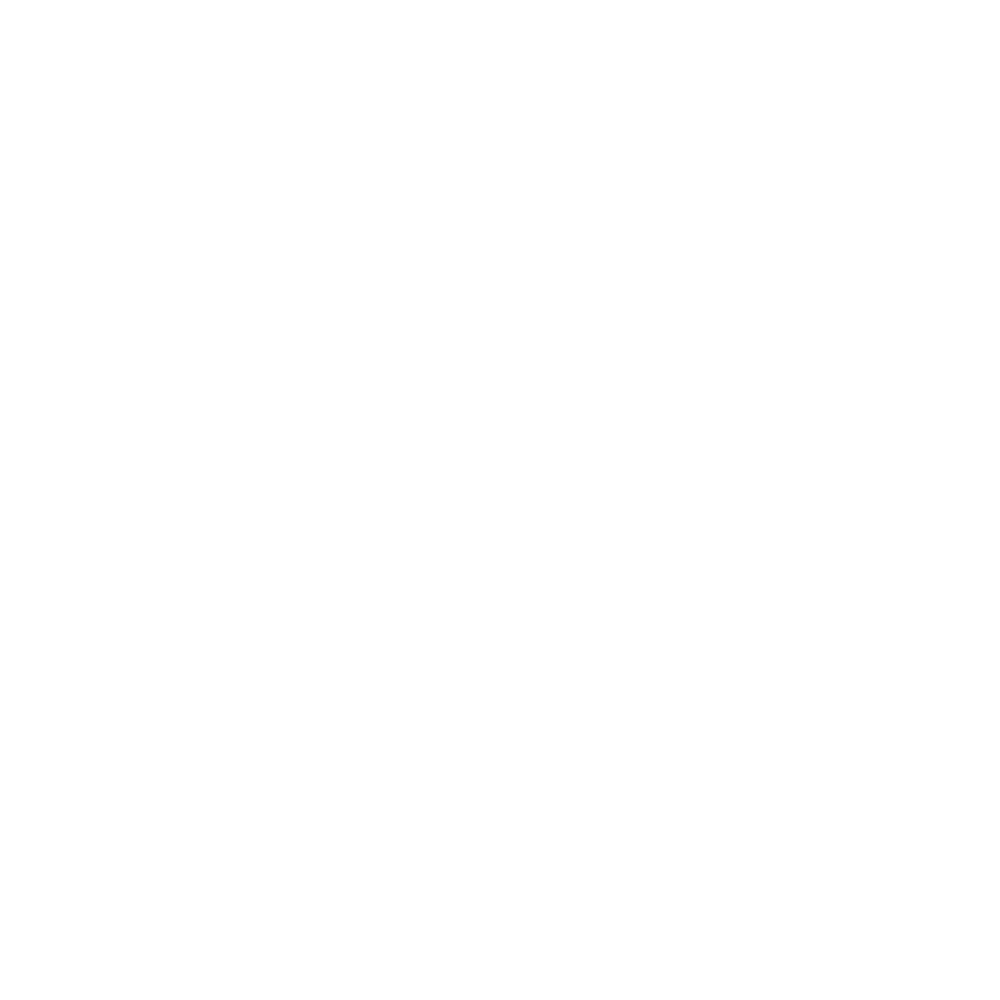

In [121]:
%matplotlib notebook
sns.set(font_scale= 0.28)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(in_corr, dtype=np.bool)))

# cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

# g = sns.clustermap(in_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# # mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
# mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(in_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
        
        
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')

plt.savefig('clustermap_in_germinal_slices_suppressed_5.svg',format='svg', dpi=1200)

<IPython.core.display.Javascript object>


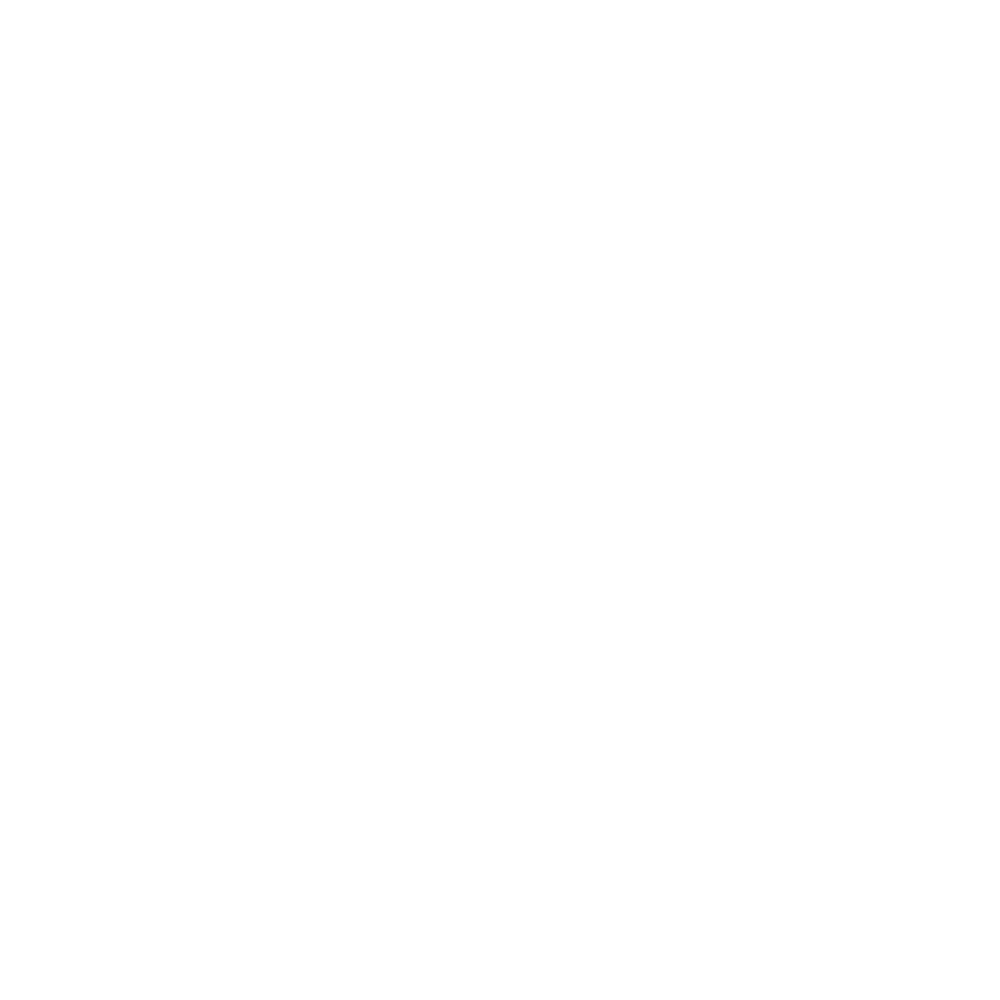

In [122]:
%matplotlib notebook
sns.set(font_scale= 0.28)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(out_corr, dtype=np.bool)))

# cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

# g = sns.clustermap(in_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# # mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
# mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(out_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
        
        
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')

plt.savefig('clustermap_out_germinal_slices_suppressed_5.svg',format='svg', dpi=1200)

<IPython.core.display.Javascript object>


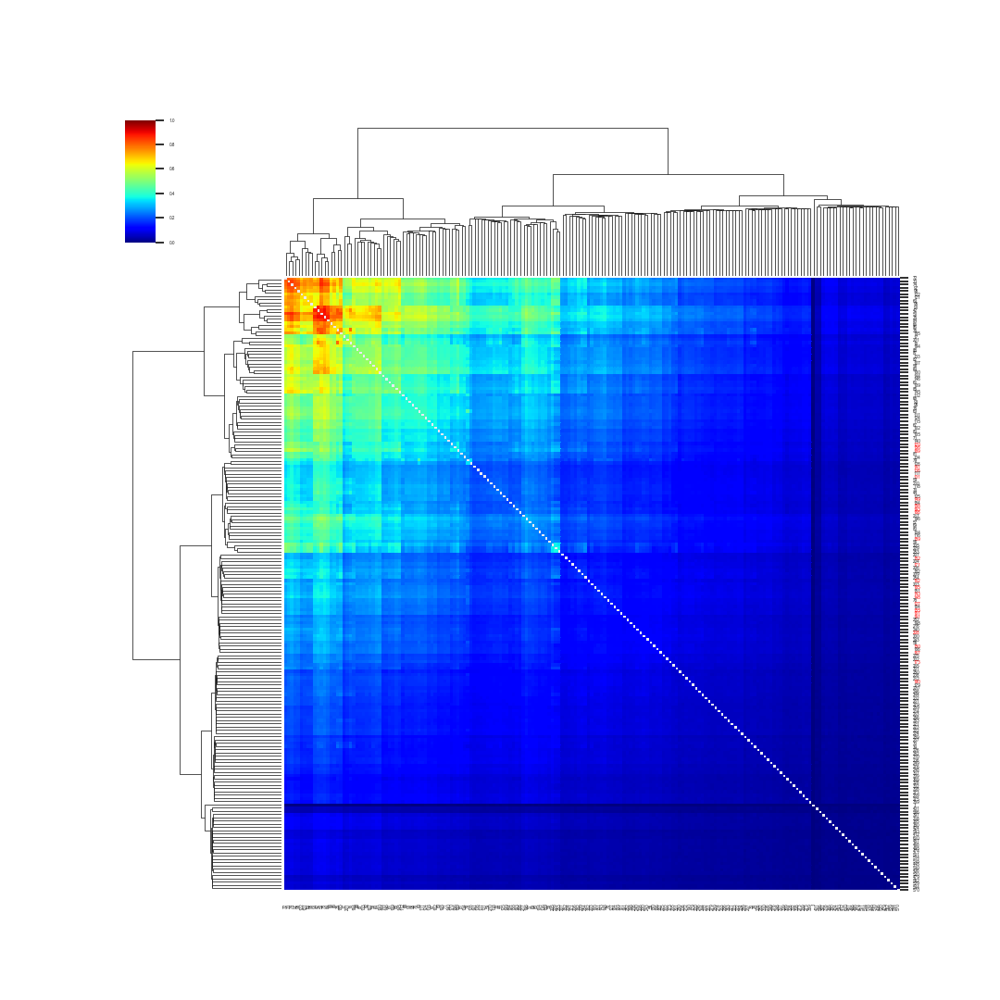

In [123]:
%matplotlib notebook
sns.set(font_scale= 0.28)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(in_out_corr, dtype=np.bool)))

# cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

# g = sns.clustermap(in_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# # mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
# mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(in_out_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
        
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels:
        tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')

plt.savefig('clustermap_in_out_germinal_slices_suppressed_5.svg',format='svg', dpi=1200)

In [ ]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(out_corr, dtype=np.bool)))

cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

g = sns.clustermap(out_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(out_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')

plt.savefig('clustermap_out_germinal_slices_suppressed.jpg',format='jpg', dpi=1200)

<IPython.core.display.Javascript object>


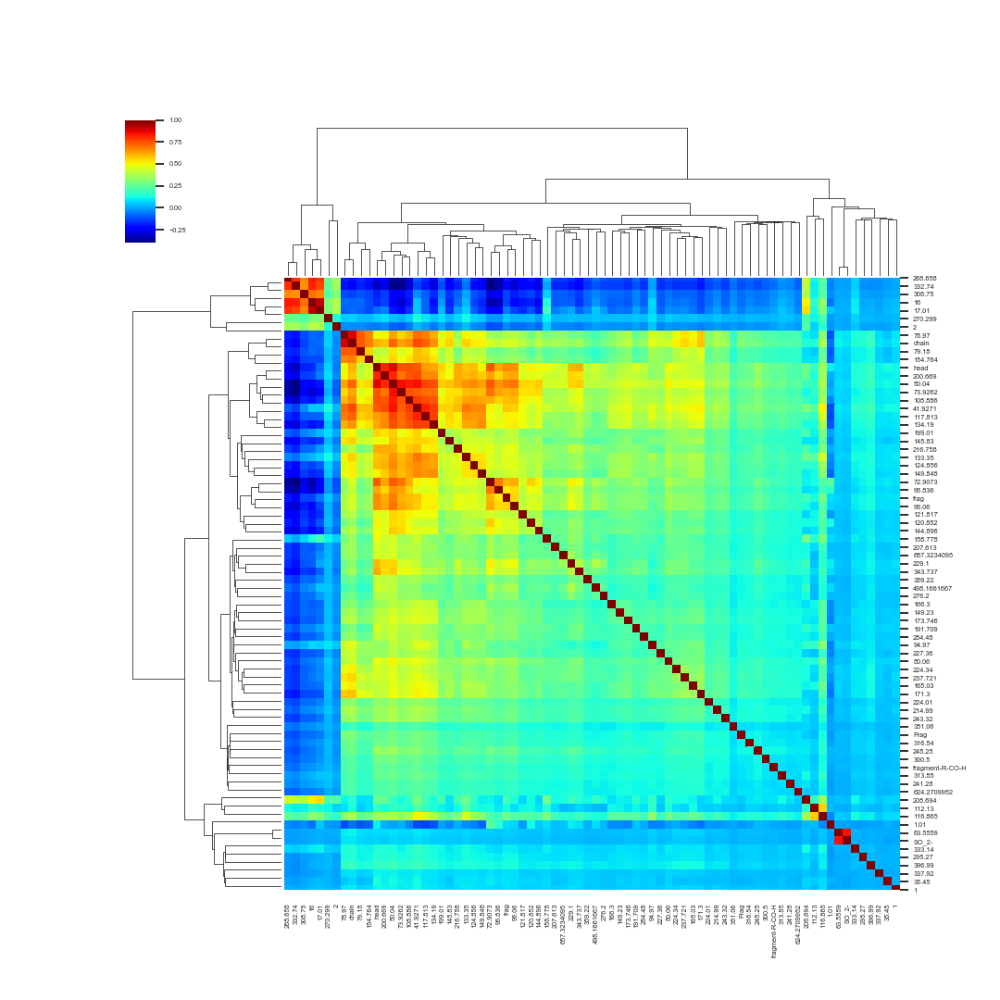

<IPython.core.display.Javascript object>


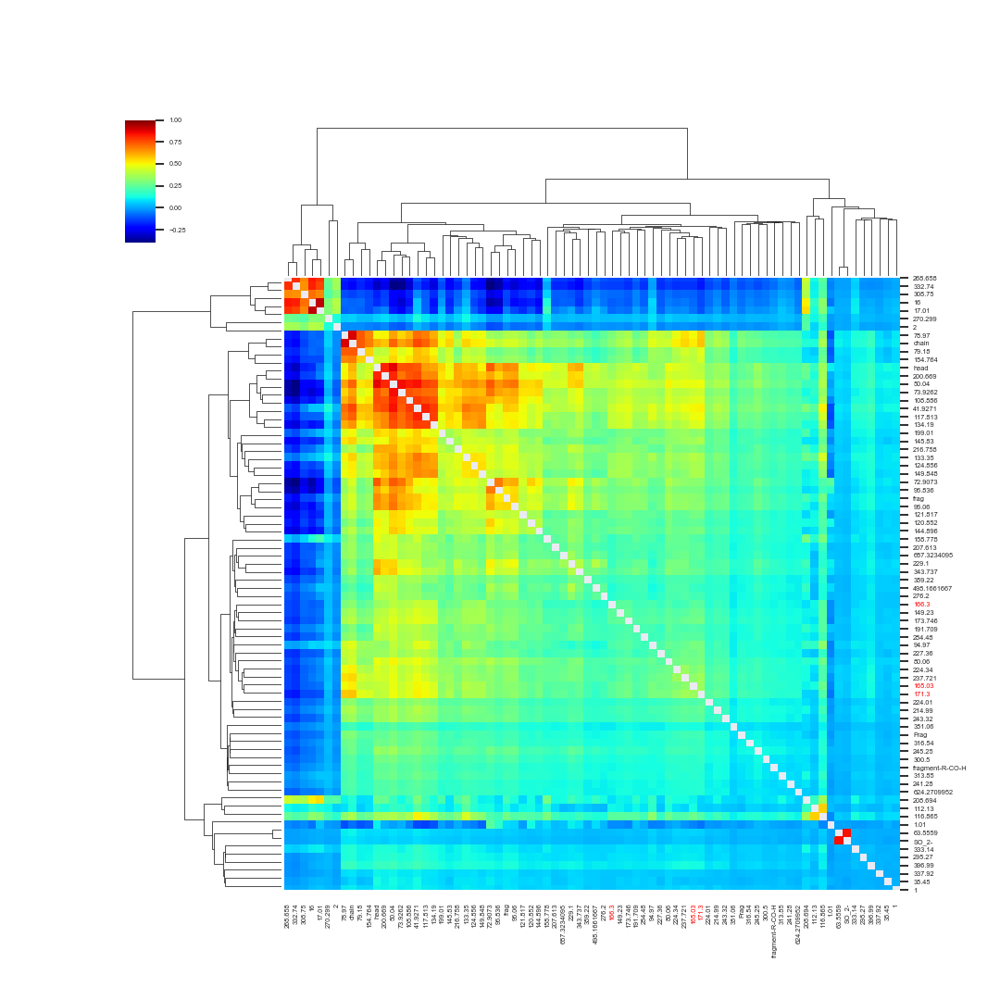

In [50]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(unlabelled_corr, dtype=np.bool)))

cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

g = sns.clustermap(unlabelled_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(unlabelled_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')

plt.savefig('clustermap_unlabelled_germinal_slices_suppressed.jpg',format='jpg', dpi=1200)

<IPython.core.display.Javascript object>


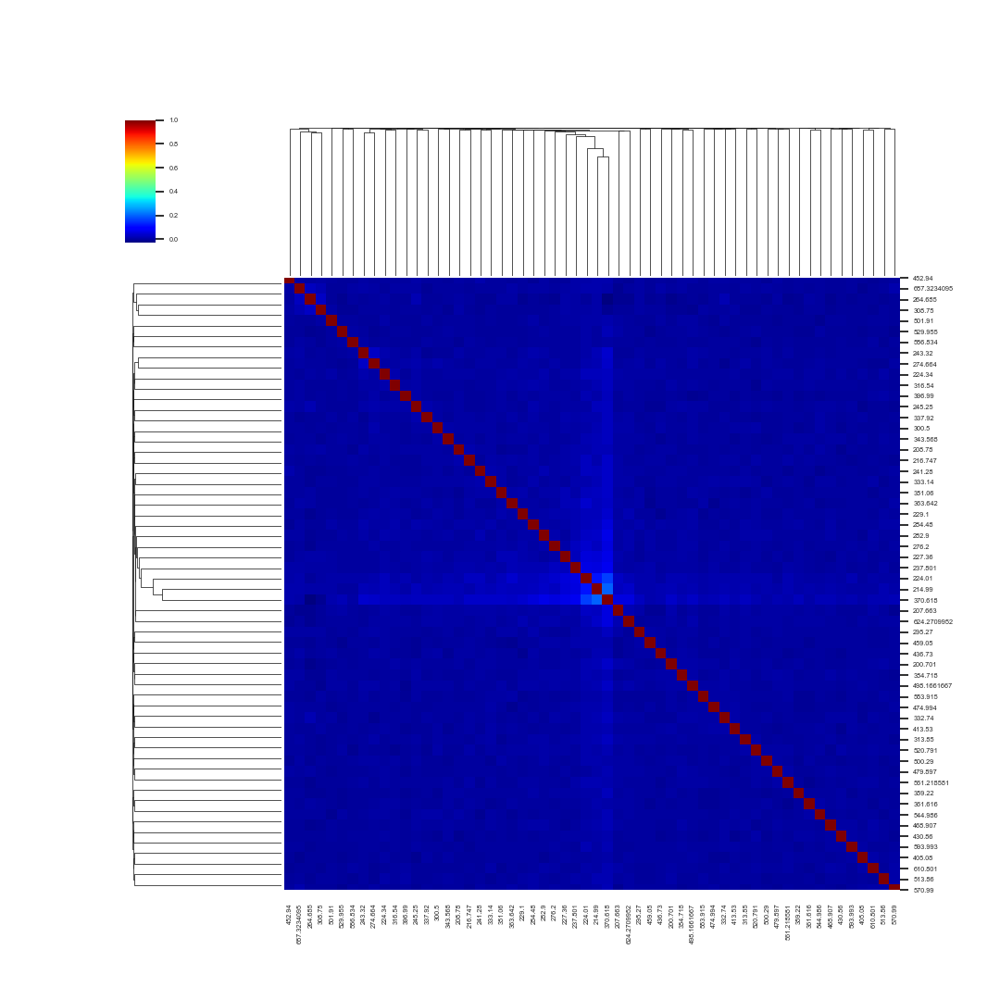

In [178]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

g = sns.clustermap(df_out_sorted_in[j2.corr(),cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
        
    
# plt.savefig('clustermap_in_germinal_slices_immune_labels_all_6.jpg',format='jpg', dpi=1200)

<IPython.core.display.Javascript object>


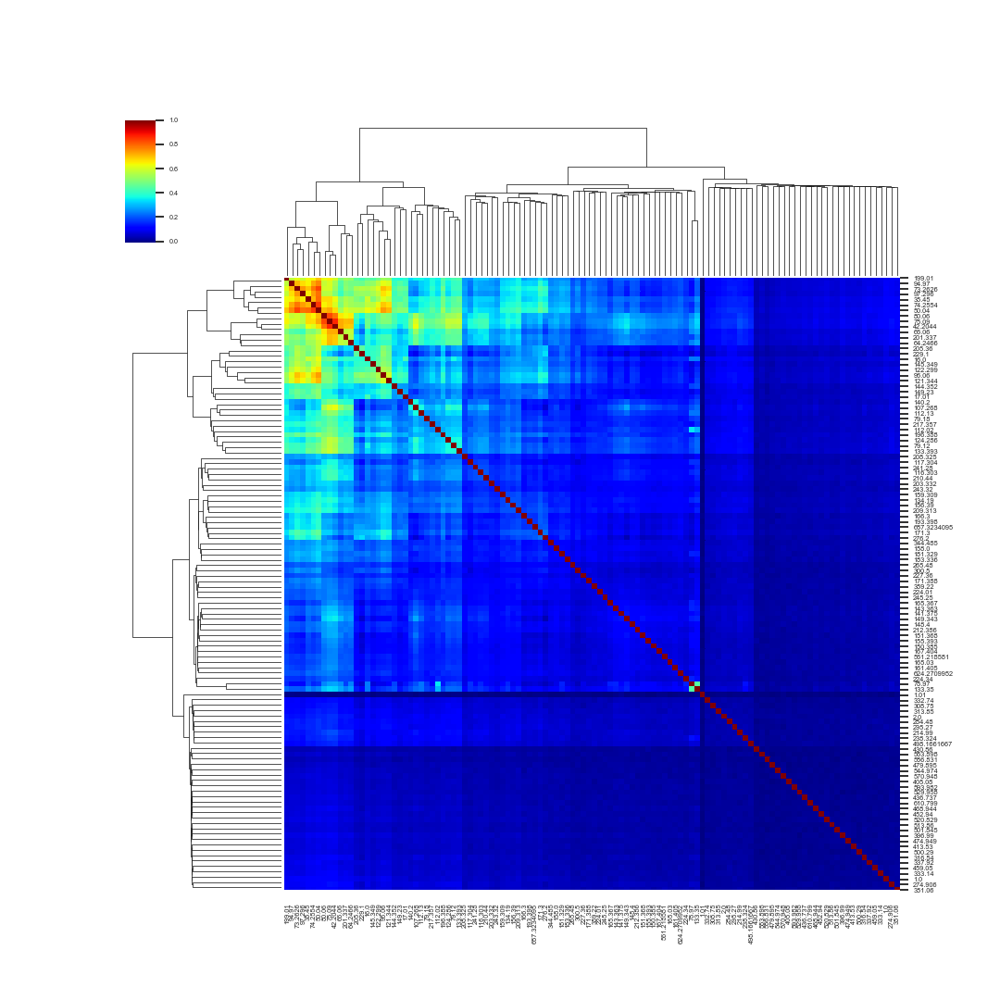

<IPython.core.display.Javascript object>


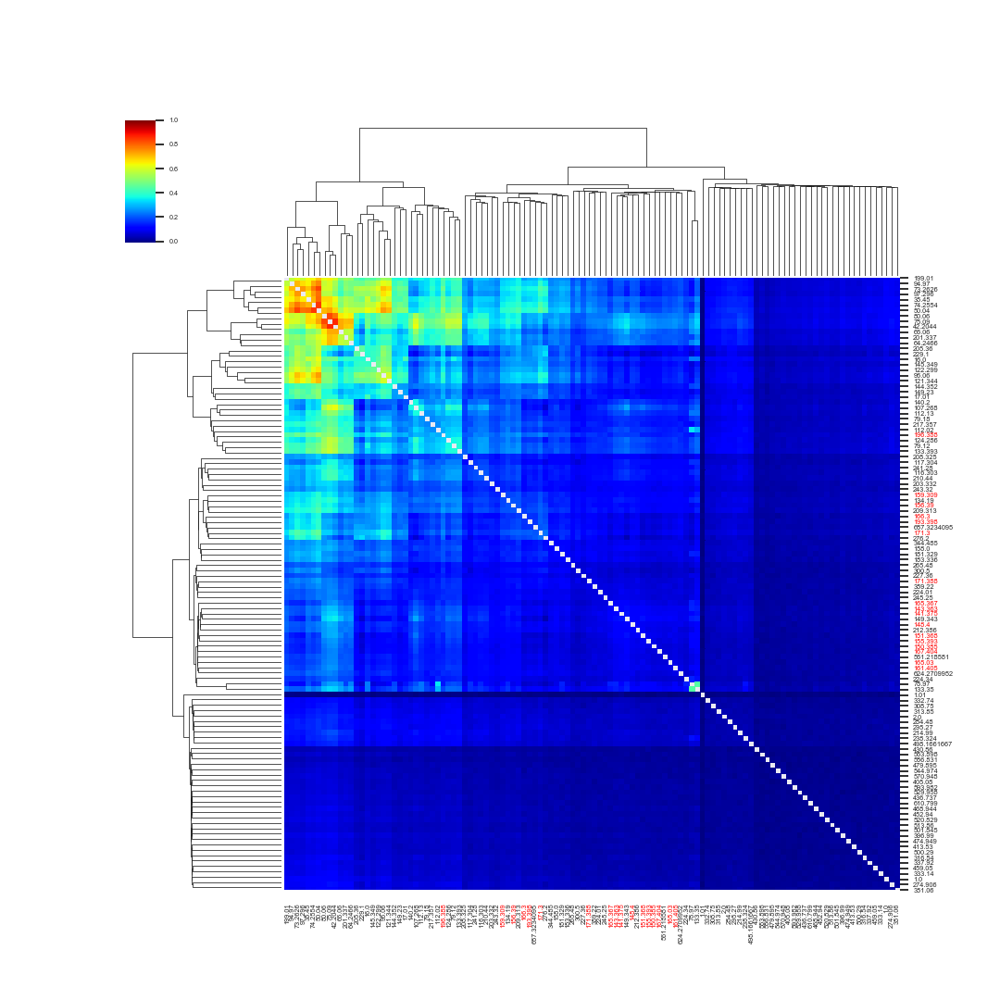

In [49]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

# Generate a mask for the upper triangle
mask = np.diag(np.diag(np.ones_like(df_unlabelled.corr(), dtype=np.bool)))

cmap = 'jet'#sns.dark_palette((210, 90, 60), input="husl")

g = sns.clustermap(in_out_corr, cmap = cmap, yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

mask = mask[np.argsort(g.dendrogram_row.reordered_ind),:]
mask = mask[:,np.argsort(g.dendrogram_col.reordered_ind)]

g = sns.clustermap(in_out_corr, cmap = 'jet' , mask = mask, yticklabels=True, xticklabels = True)

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_out:
        tick_label.set_color('red')
        
for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_labels_in:
        tick_label.set_color('red')

for tick_label in g.ax_heatmap.axes.get_yticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')
for tick_label in g.ax_heatmap.axes.get_xticklabels():
    tick_text = tick_label.get_text()
    if tick_text in immune_in_out:
        tick_label.set_color('red')

plt.savefig('clustermap_in_out_germinal_slices_suppressed.jpg',format='jpg', dpi=1200)

<IPython.core.display.Javascript object>


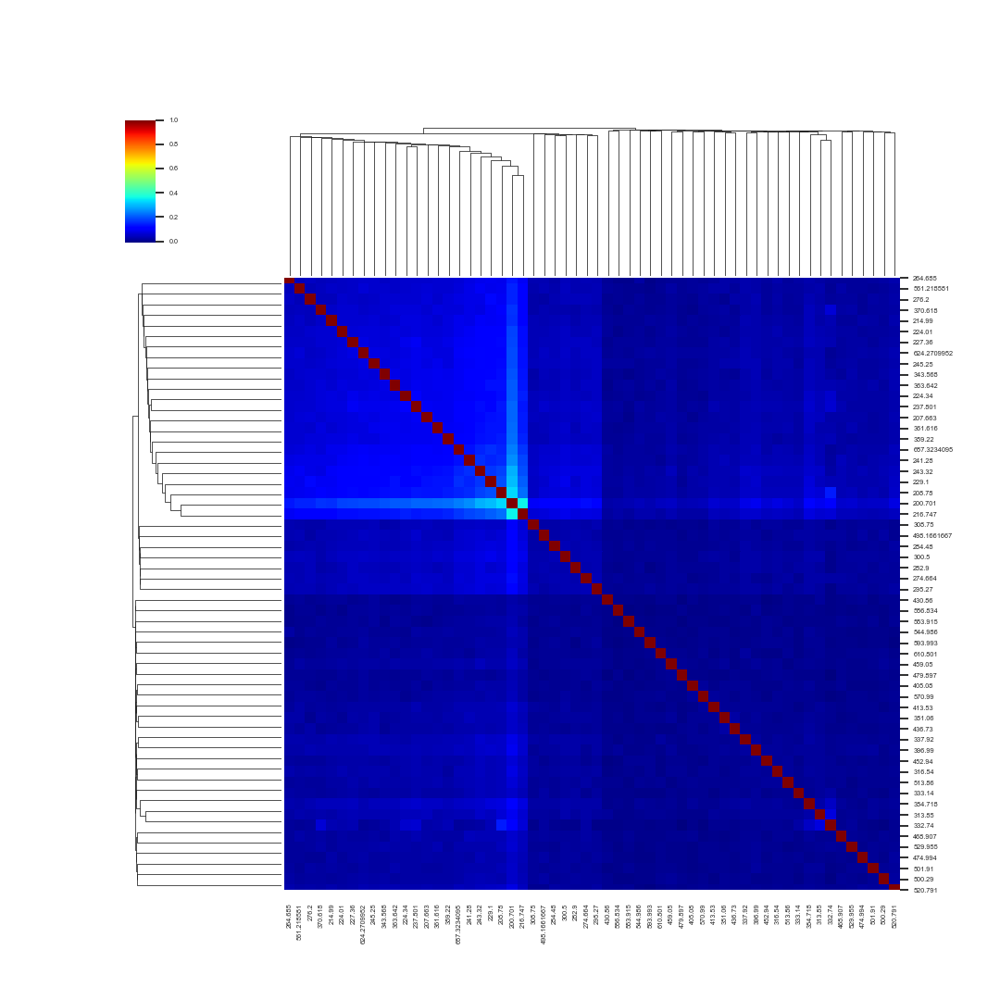

In [176]:
%matplotlib notebook
sns.set(font_scale= 0.45)
# fig = plt.figure()

g = sns.clustermap(df_in_sorted[j2].corr(),cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
        
    
# plt.savefig('clustermap_in_germinal_slices_immune_labels_all_6.jpg',format='jpg', dpi=1200)

In [196]:
coor_maldi_df = pd.DataFrame(coor_maldi, columns = closest_list,index = closest_list)

In [201]:
os.chdir(results_store_path)

In [209]:
coor_maldi_df = coor_maldi_df.rename(index = lambda x : str(x)[:-12],columns = lambda x : str(x)[:-12])

<IPython.core.display.Javascript object>


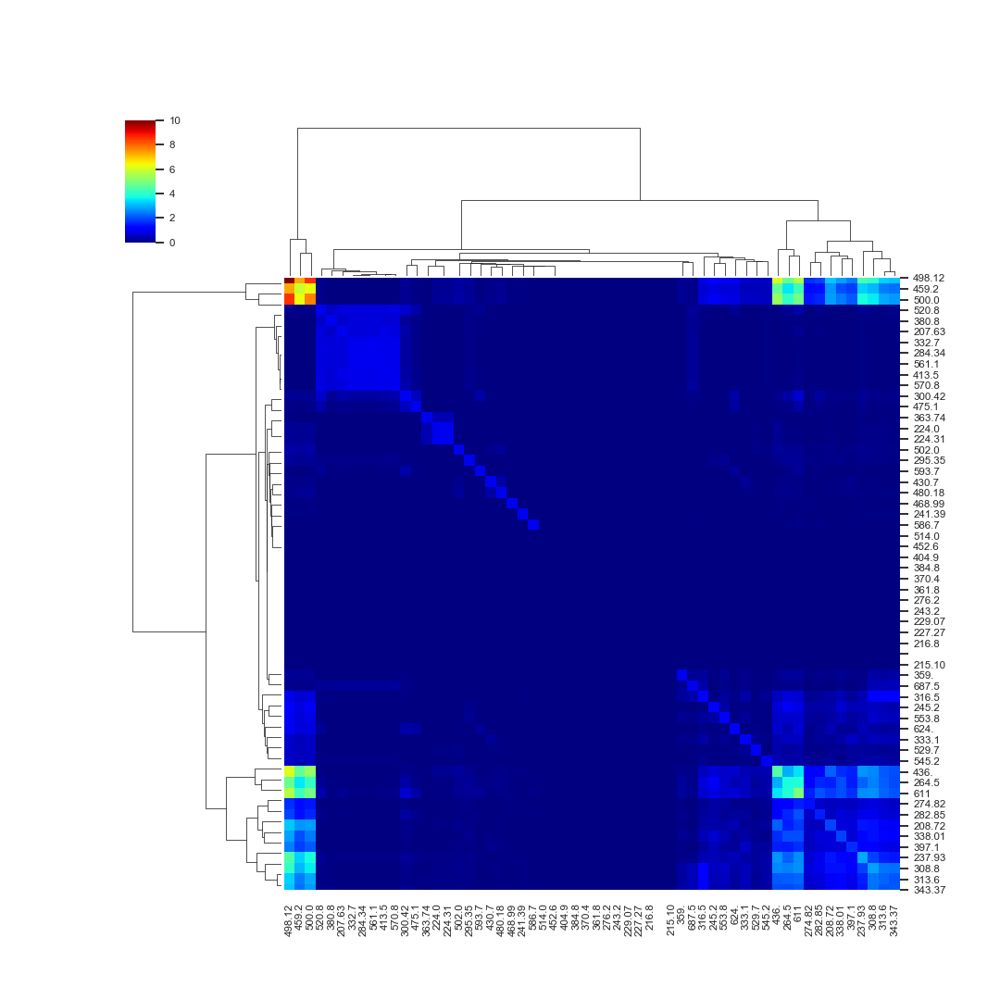

In [212]:
%matplotlib notebook
sns.set(font_scale= 0.7)
# fig = plt.figure()

g = sns.clustermap(coor_maldi_df,cmap = 'jet',yticklabels=True, xticklabels = True)#, xticklabels = labels, yticklabels = labels, square = True )

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_out:
#         tick_label.set_color('red')
        
# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_labels_in:
#         tick_label.set_color('red')

# for tick_label in g.ax_heatmap.axes.get_yticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
# for tick_label in g.ax_heatmap.axes.get_xticklabels():
#     tick_text = tick_label.get_text()
#     if tick_text in immune_in_out:
#         tick_label.set_color('red')
plt.savefig('clustermap_maldi_58_coor.jpg',format='jpg', dpi=1200)

In [ ]:
os.chdir(results_store_path)

In [ ]:
# for i in range(1478):
#     fig = plt.figure()
#     plt.imshow(maldi_matrix[i,:].reshape(49,37))
#     plt.savefig(str(i) + '.png' )

In [ ]:
os.chdir(r'C:\Users\sganesh44\Documents\3D TOFSIMS')

In [ ]:
coord = np.load('matrixcoord.npy')

In [ ]:
mat = np.zeros((54,54))
for i in range(len(coord)):
    mat[coord[i][0],coord[i][1]] = maldi_matrix[-3,:][i]

In [ ]:
fig = plt.figure()
ax = plt.subplot(111)
plt.imshow(mat[:15,30:])
#plt.imshow(mat)
ax.grid(False)
#plt.savefig(str(i) + '.png' )